# Fraud Detection Analysis

## Data Preprocessing Phase 1



In [2]:
# Import required modules.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
from scipy.stats.contingency import association
import seaborn as sns
from scipy.stats import ttest_ind

In [3]:
# Load the Credit Card Transactions dataset into a Pandas DataFrame.
credit_card_df = pd.read_csv('credit_card_transactions_updated.csv',index_col=0)
credit_card_df.head(10)

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,NaN,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,-81.1781,3495.0,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,28705.0
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,NaN,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,-118.2105,149.0,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,NaN
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,NaN,NaN,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,-112.2620,4154.0,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,83236.0
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,NaN,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,-112.1138,1939.0,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,NaN
4,2019-01-01 00:03:06,375534208663984,NaN,misc_pos,NaN,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,-79.4629,99.0,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,22844.0
5,2019-01-01 00:04:08,4767265376804500,"fraud_Stroman, Hudson and Erdman",gas_transport,NaN,Jennifer,Conner,F,4655 David Island,Dublin,...,-75.2045,2158.0,Transport planner,1961-06-19,189a841a0a8ba03058526bcfe566aab5,1325376248,40.653382,-76.152667,0,17972.0
6,2019-01-01 00:04:42,30074693890476,fraud_Rowe-Vandervort,grocery_net,NaN,Kelsey,Richards,F,889 Sarah Station Suite 624,Holcomb,...,-100.9893,2691.0,Arboriculturist,1993-08-16,83ec1cc84142af6e2acf10c44949e720,1325376282,37.162705,-100.153370,0,NaN
7,2019-01-01 00:05:08,6011360759745864,fraud_Corwin-Collins,gas_transport,NaN,Steven,Williams,M,231 Flores Pass Suite 720,Edinburg,...,-78.6003,6018.0,"Designer, multimedia",1947-08-21,6d294ed2cc447d2c71c7171a3d54967c,1325376308,38.948089,-78.540296,0,22644.0
8,2019-01-01 00:05:18,4922710831011201,NaN,misc_pos,NaN,Heather,Chase,F,6888 Hicks Stream Suite 954,Manor,...,-79.6607,1472.0,Public affairs consultant,1941-03-07,fc28024ce480f8ef21a32d64c93a29f5,1325376318,40.351813,-79.958146,0,15236.0
9,2019-01-01 00:06:01,2720830304681674,"fraud_Schoen, Kuphal and Nitzsche",grocery_pos,NaN,Melissa,Aguilar,F,21326 Taylor Squares Suite 708,Clarksville,...,-87.3490,151785.0,Pathologist,1974-03-28,3b9014ea8fb80bd65de0b1463b00b00e,1325376361,37.179198,-87.485381,0,42442.0


In [4]:
credit_card_df.columns

Index(['trans_date_trans_time', 'cc_num', 'merchant', 'category', 'amt',
       'first', 'last', 'gender', 'street', 'city', 'state', 'zip', 'lat',
       'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time', 'merch_lat',
       'merch_long', 'is_fraud', 'merch_zipcode'],
      dtype='object')

## Identity Missing Value and get the Type of the missing values.

In [5]:
# Split trans_date_trans_time into multiple columns.
credit_card_df['trans_date_trans_time'] = pd.to_datetime(credit_card_df['trans_date_trans_time'])
credit_card_df['month'] = credit_card_df['trans_date_trans_time'].dt.month
credit_card_df['day'] = credit_card_df['trans_date_trans_time'].dt.day
credit_card_df['hour'] = credit_card_df['trans_date_trans_time'].dt.hour
credit_card_df['weekday'] = credit_card_df['trans_date_trans_time'].dt.day_name()

In [6]:
credit_card_df.head(10)

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode,month,day,hour,weekday
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,NaN,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,28705.0,1,1,0,Tuesday
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,NaN,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,NaN,1,1,0,Tuesday
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,NaN,NaN,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,83236.0,1,1,0,Tuesday
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,NaN,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,NaN,1,1,0,Tuesday
4,2019-01-01 00:03:06,375534208663984,NaN,misc_pos,NaN,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,22844.0,1,1,0,Tuesday
5,2019-01-01 00:04:08,4767265376804500,"fraud_Stroman, Hudson and Erdman",gas_transport,NaN,Jennifer,Conner,F,4655 David Island,Dublin,...,189a841a0a8ba03058526bcfe566aab5,1325376248,40.653382,-76.152667,0,17972.0,1,1,0,Tuesday
6,2019-01-01 00:04:42,30074693890476,fraud_Rowe-Vandervort,grocery_net,NaN,Kelsey,Richards,F,889 Sarah Station Suite 624,Holcomb,...,83ec1cc84142af6e2acf10c44949e720,1325376282,37.162705,-100.153370,0,NaN,1,1,0,Tuesday
7,2019-01-01 00:05:08,6011360759745864,fraud_Corwin-Collins,gas_transport,NaN,Steven,Williams,M,231 Flores Pass Suite 720,Edinburg,...,6d294ed2cc447d2c71c7171a3d54967c,1325376308,38.948089,-78.540296,0,22644.0,1,1,0,Tuesday
8,2019-01-01 00:05:18,4922710831011201,NaN,misc_pos,NaN,Heather,Chase,F,6888 Hicks Stream Suite 954,Manor,...,fc28024ce480f8ef21a32d64c93a29f5,1325376318,40.351813,-79.958146,0,15236.0,1,1,0,Tuesday
9,2019-01-01 00:06:01,2720830304681674,"fraud_Schoen, Kuphal and Nitzsche",grocery_pos,NaN,Melissa,Aguilar,F,21326 Taylor Squares Suite 708,Clarksville,...,3b9014ea8fb80bd65de0b1463b00b00e,1325376361,37.179198,-87.485381,0,42442.0,1,1,0,Tuesday


In [7]:
numerical_fields = credit_card_df.select_dtypes(include=['number']).columns
print(f'Numeric columns in the dataset:{numerical_fields}')
categorical_fields = credit_card_df.select_dtypes(include=['object']).columns
print(f'Categorical columns in the dataset:{categorical_fields}')

Numeric columns in the dataset:Index(['cc_num', 'amt', 'zip', 'lat', 'long', 'city_pop', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud', 'merch_zipcode', 'month', 'day',
       'hour'],
      dtype='object')
Categorical columns in the dataset:Index(['merchant', 'category', 'first', 'last', 'gender', 'street', 'city',
       'state', 'job', 'dob', 'trans_num', 'weekday'],
      dtype='object')


In [8]:
# Check the columns that has missing value and get their count.
# Replace ? with na.
credit_card_df.replace('?', pd.NA, inplace=True)
print("Number of Missing Vlaue")
missing_columns_list = []
for column in credit_card_df.columns:
  missing_value_count = credit_card_df[column].isna().sum()
  if(missing_value_count > 0):
    missing_columns_list.append(column)
    print(f"{column} : {missing_value_count}")

Number of Missing Vlaue
merchant : 79655
category : 94005
amt : 42502
city_pop : 500
merch_zipcode : 195973


In [9]:
# print the list of missing numers
missing_columns_list

['merchant', 'category', 'amt', 'city_pop', 'merch_zipcode']

In [10]:
numerical_missing_columns_list = []
categorical_missing_columns_list = []
for column in missing_columns_list:
    if pd.api.types.is_numeric_dtype(credit_card_df[column]):
        numerical_missing_columns_list.append(column)
    else:
        categorical_missing_columns_list.append(column)

In [11]:
numerical_missing_columns_list

['amt', 'city_pop', 'merch_zipcode']

In [12]:
categorical_missing_columns_list

['merchant', 'category']

### Missing Value analysis for Numerical Attributes.

In [13]:
def Diagnose_MV_Numerical(df,str_att_name,BM_MV):
    MV_labels = {True:'With Missing Values',False:'Without Missing Values'}
    labels=[]
    box_sr = pd.Series('',index = BM_MV.unique())
    for poss in BM_MV.unique():
        BM = BM_MV == poss
        box_sr[poss] = df[BM][str_att_name].dropna()
        labels.append(MV_labels[poss])
    plt.boxplot(box_sr,vert=False)
    plt.yticks([1,2],labels)
    plt.xlabel(str_att_name)
    plt.show()
    plt.figure(figsize=(10,4))
    att_range = (df[str_att_name].min(),df[str_att_name].max())
    for i,poss in enumerate(BM_MV.unique()):
        plt.subplot(1,2,i+1)
        BM = BM_MV == poss
        df[BM][str_att_name].hist()
        plt.xlim = att_range
        plt.xlabel(str_att_name)
        plt.title(MV_labels[poss])
    plt.show()
    group_1_data = df[BM_MV][str_att_name].dropna()
    group_2_data = df[~BM_MV][str_att_name].dropna()
    p_value = ttest_ind(group_1_data,group_2_data).pvalue
    print('p-value of t-test: {}'.format(p_value))
    if p_value < 0.05:
      print("The groups are significantly different. Missing values are not random.")
    else:
      print("No significant difference between groups. Missing values might be random.")

In [14]:
def Diagnose_MV_Categorical(df, str_att_name, BM_MV):
  if str_att_name != 'trans_num': # don't do for trans number since it is unqiue for all data.
    MV_labels = {True: 'With Missing Values', False: 'Without Missing Values'}
    plt.figure(figsize=(10, 4))
    # Plot bar graphs for both groups
    for i, poss in enumerate(BM_MV.unique()):
        BM = BM_MV == poss
        group_data = df[BM][str_att_name].value_counts()
        if group_data.empty:  # Check if the group has no data
            print(f"No data for group: {MV_labels[poss]}")
            continue
        plt.subplot(1, 2, i + 1)
        group_data.plot.bar()
        plt.title(MV_labels[poss])
    plt.show()
    # Perform chi-squared test only if both groups have data
    if df[BM_MV].shape[0] > 0 and df[~BM_MV].shape[0] > 0:
        contigency_table = pd.crosstab(BM_MV, df[str_att_name])
        p_value = chi2_contingency(contigency_table)[1]
        print('p-value of Chi-squared test: {}'.format(p_value))
        # Interpretation of the p-value
        if p_value < 0.05:
            print(
                f"The missingness in '{str_att_name}' is likely **not completely at random** (p < 0.05).\n"
                "This suggests a significant relationship between missingness and the attribute values."
            )
        else:
            print(
                f"The missingness in '{str_att_name}' appears to be **completely at random** (p >= 0.05).\n"
                "No significant relationship was detected between missingness and the attribute values."
            )
    else:
        print("Insufficient data for chi-squared test.")

#### Missing Anlysis for amt

Diagnosis Analysis of Missing Values for cc_num:


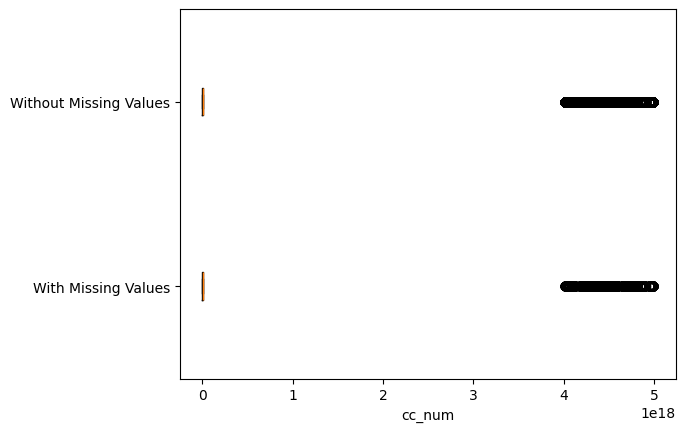

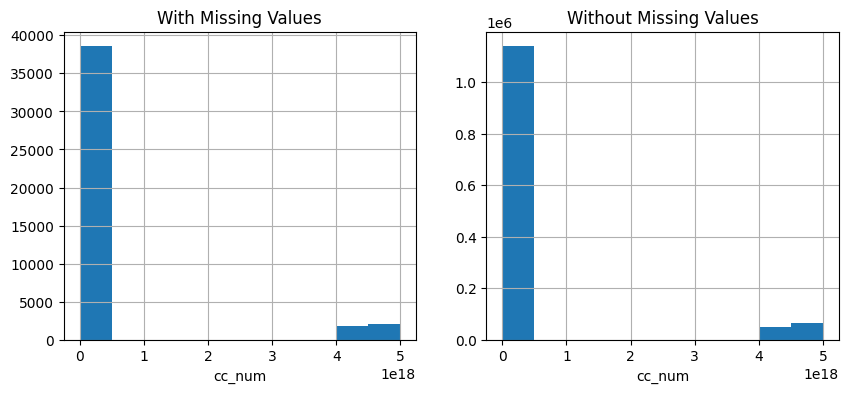

p-value of t-test: 0.37309801809083165
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for amt:


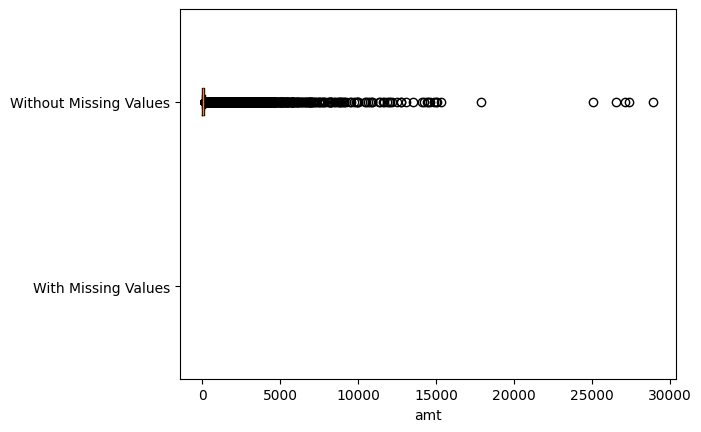

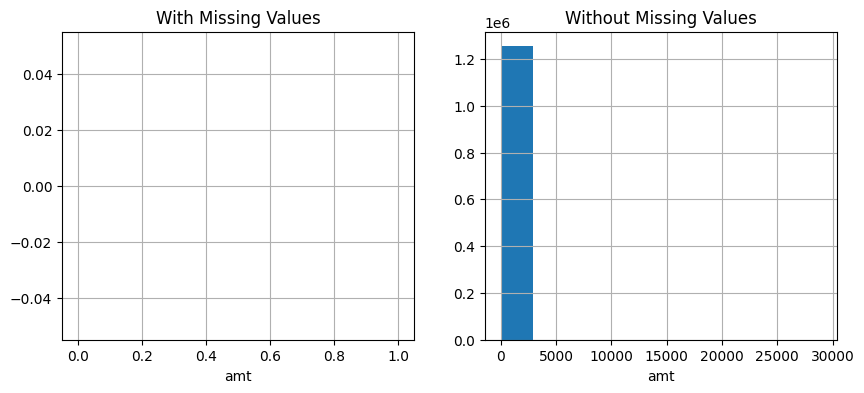

C:\Users\Dell\AppData\Local\Temp\ipykernel_25320\1525526324.py:33: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  p_value = ttest_ind(group_1_data,group_2_data).pvalue


p-value of t-test: nan
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for zip:


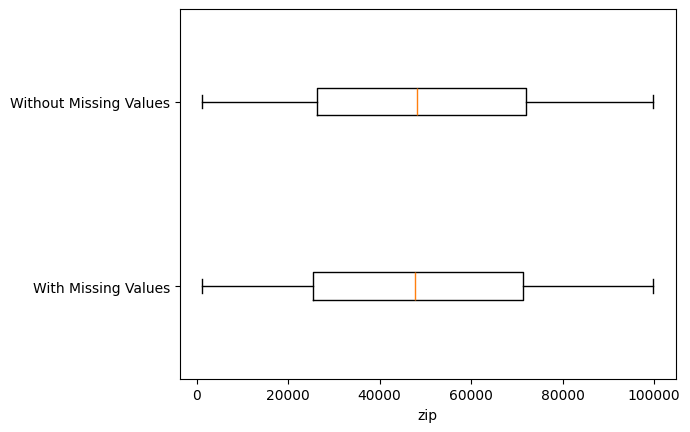

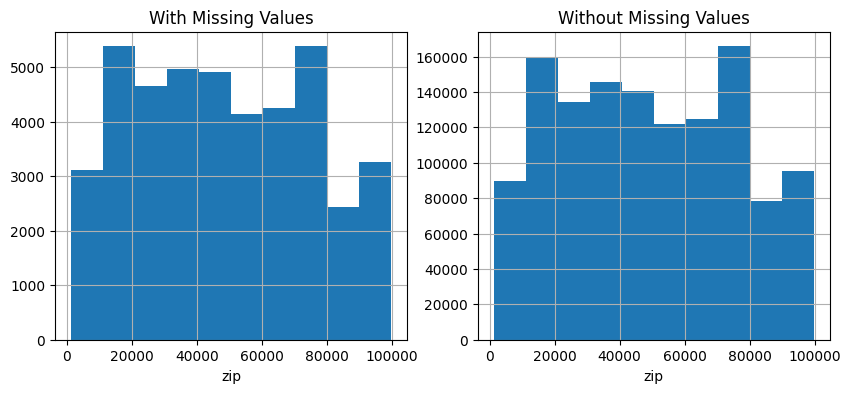

p-value of t-test: 0.0012877835275616728
The groups are significantly different. Missing values are not random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for lat:


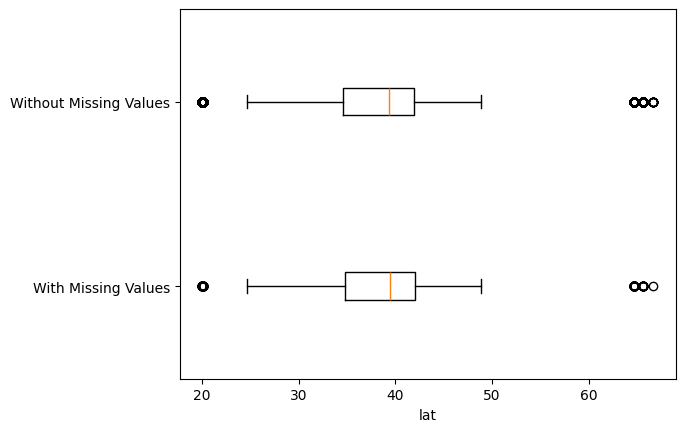

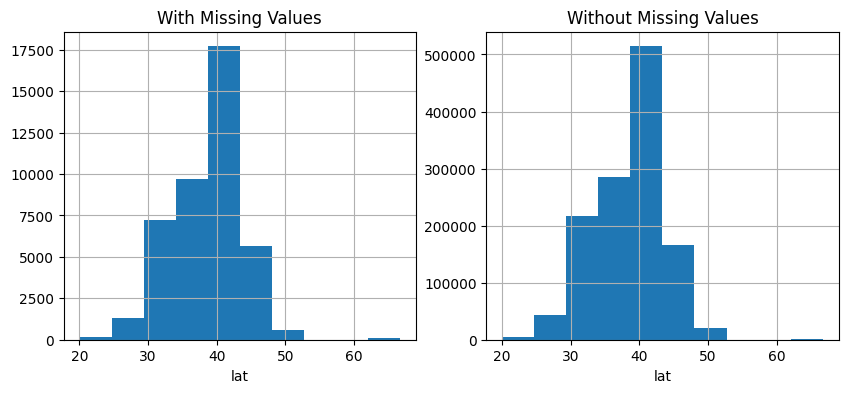

p-value of t-test: 0.0007907823693194036
The groups are significantly different. Missing values are not random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for long:


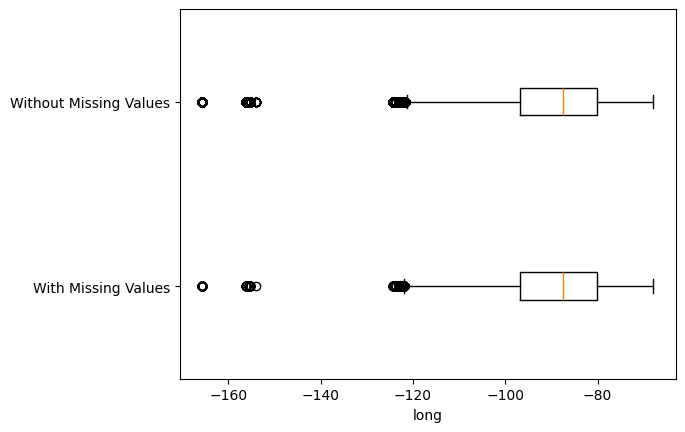

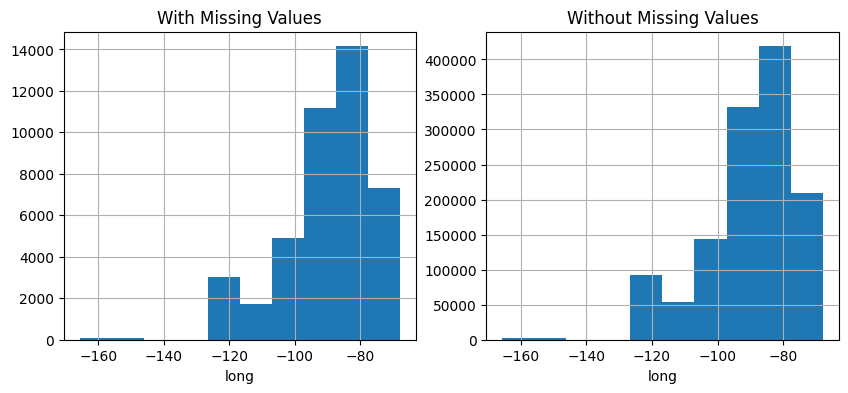

p-value of t-test: 0.047533629246606555
The groups are significantly different. Missing values are not random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for city_pop:


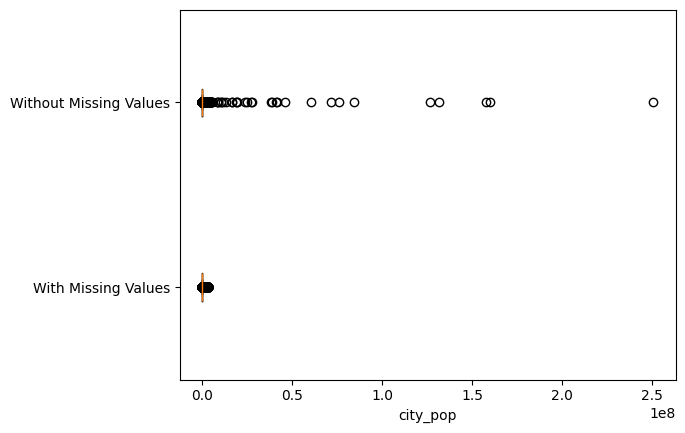

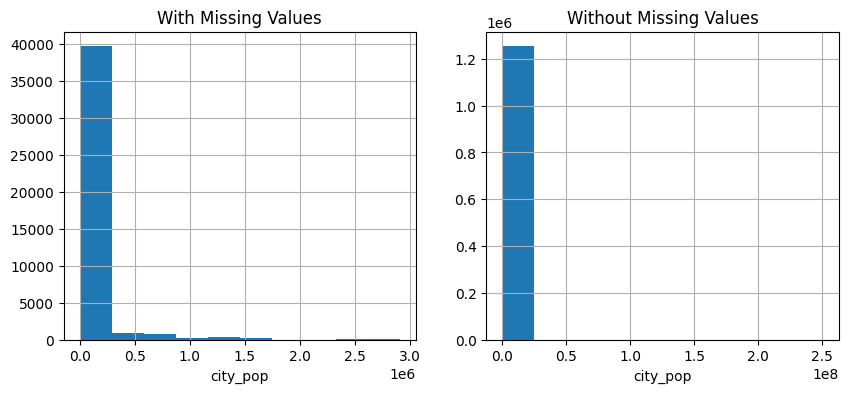

p-value of t-test: 7.293825803530083e-07
The groups are significantly different. Missing values are not random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for unix_time:


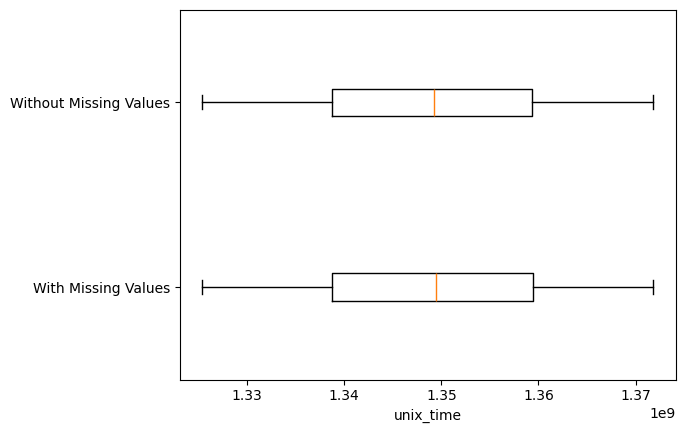

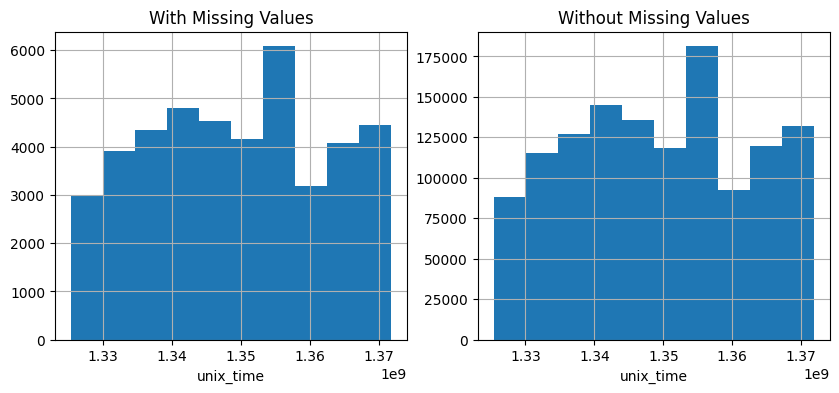

p-value of t-test: 0.9304158952328321
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for merch_lat:


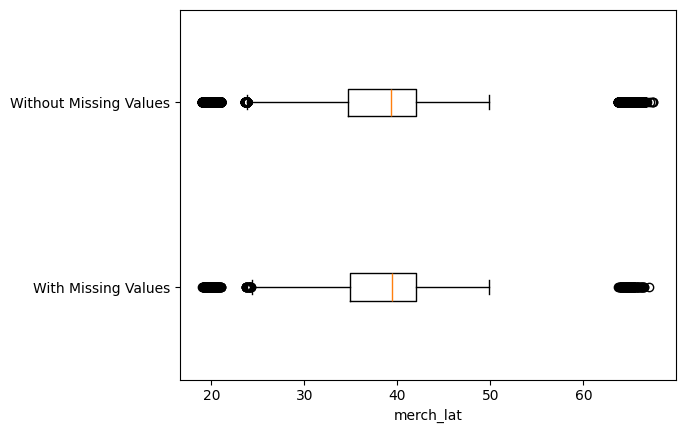

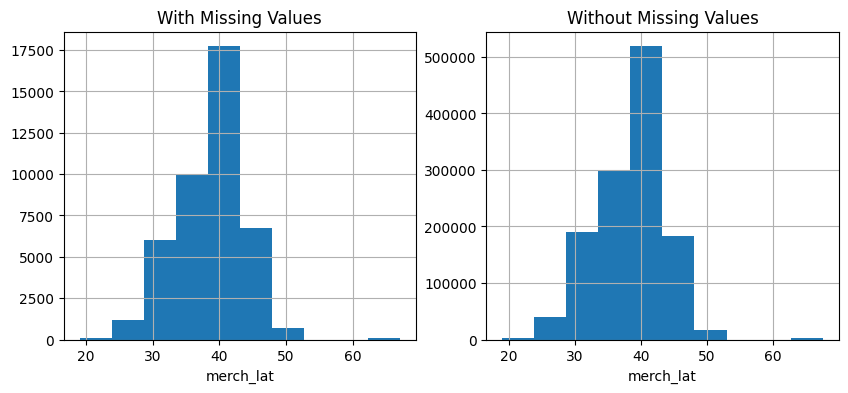

p-value of t-test: 0.0007168781463354825
The groups are significantly different. Missing values are not random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for merch_long:


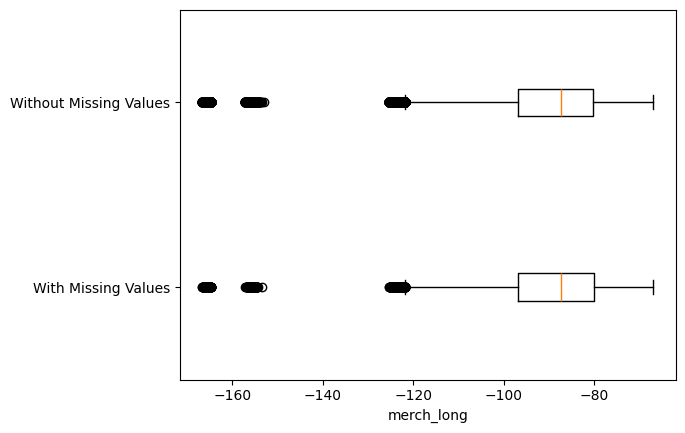

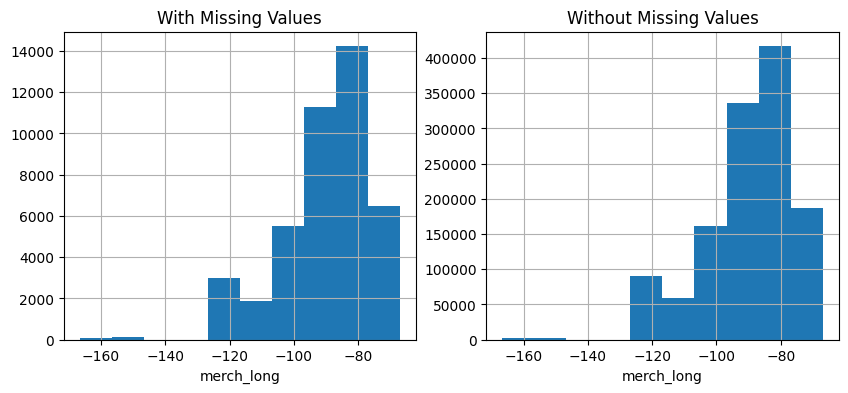

p-value of t-test: 0.045838097289334793
The groups are significantly different. Missing values are not random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for is_fraud:


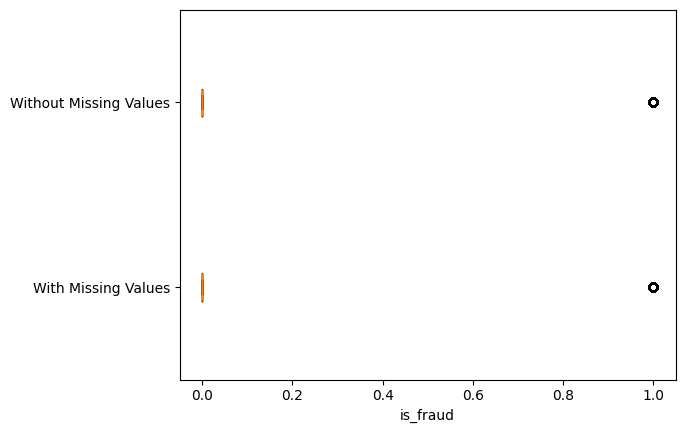

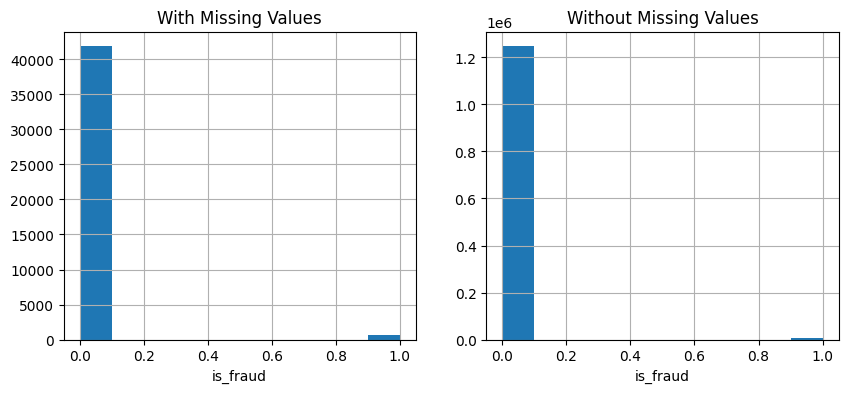

p-value of t-test: 3.964362288670994e-141
The groups are significantly different. Missing values are not random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for merch_zipcode:


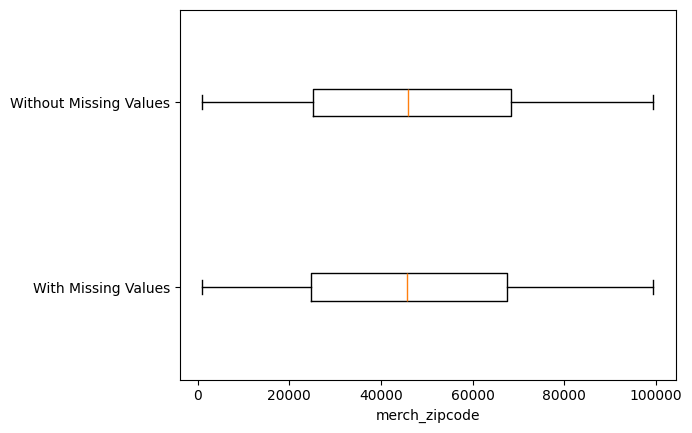

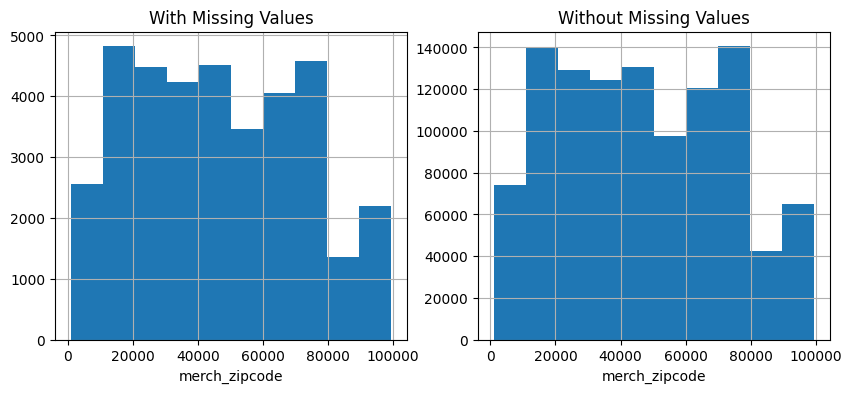

p-value of t-test: 0.0030472974205904267
The groups are significantly different. Missing values are not random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for month:


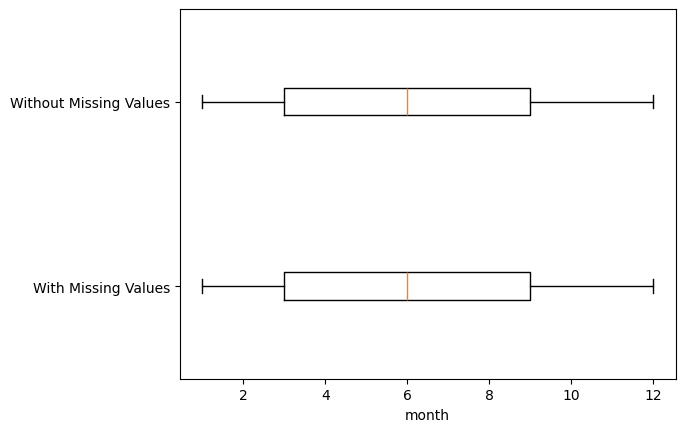

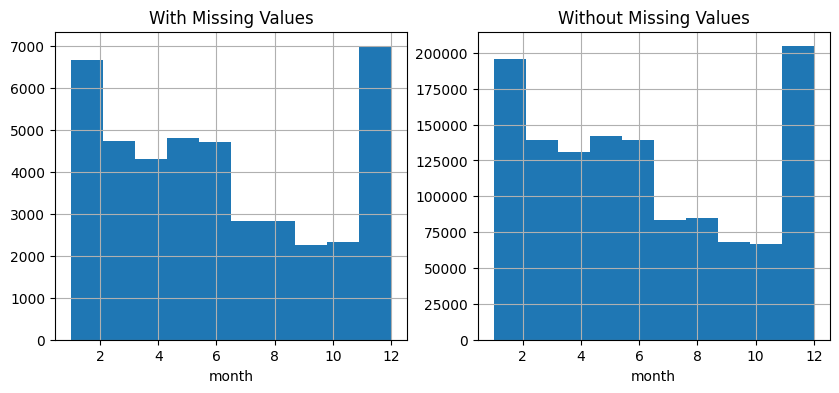

p-value of t-test: 0.6688935774354987
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for day:


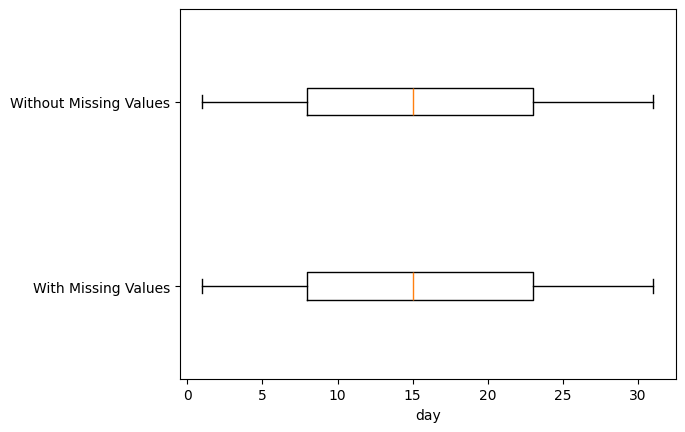

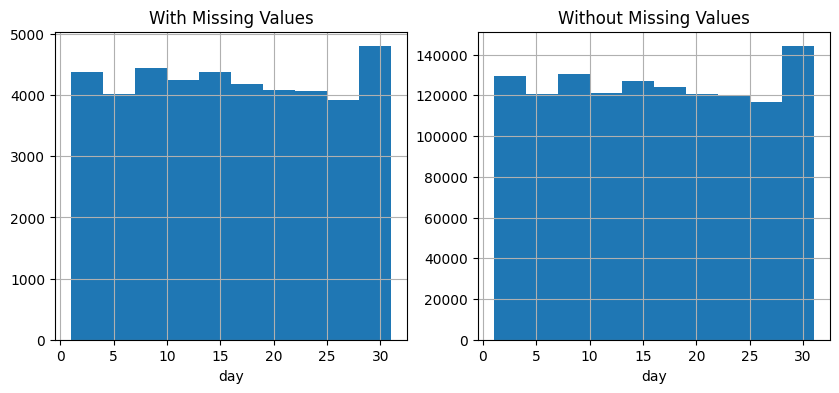

p-value of t-test: 0.39574521290042997
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for hour:


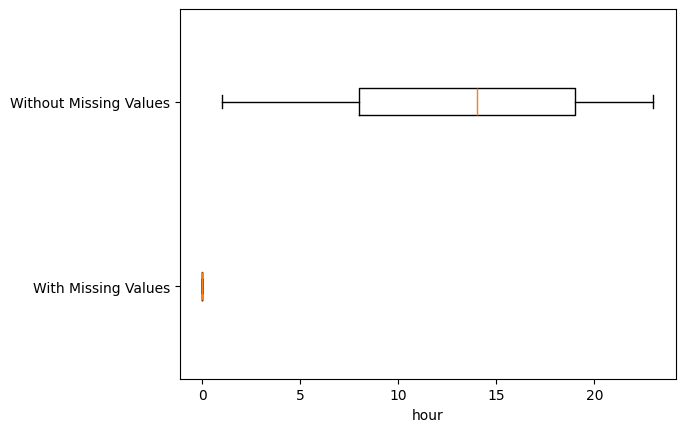

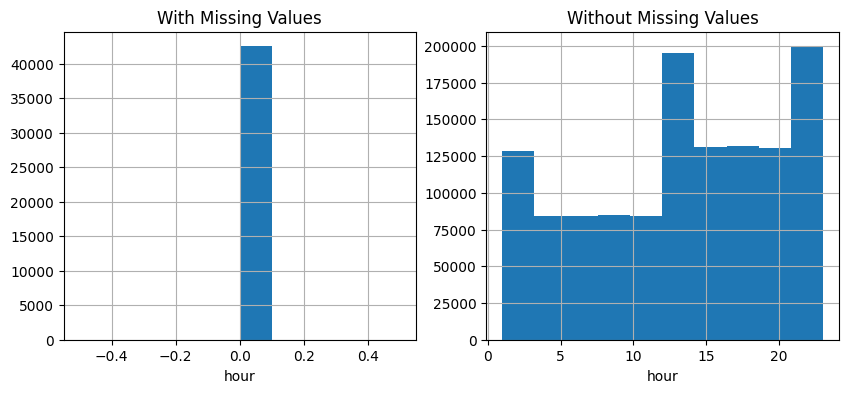

p-value of t-test: 0.0
The groups are significantly different. Missing values are not random.
- - - - - - - - - - - - divider - - - - - - - - - - - 


In [15]:
BM_MV = credit_card_df['amt'].isna()
for att in numerical_fields:
    print('Diagnosis Analysis of Missing Values for {}:'.format(att))
    Diagnose_MV_Numerical(credit_card_df,att,BM_MV)
    print('- - - - - - - - - - - - divider - - - - - - - - - - - ')

Here Missing Values is seen for hour attributes only for 0 and 1 .

Diagnosis Analysis of Missing Values for merchant:


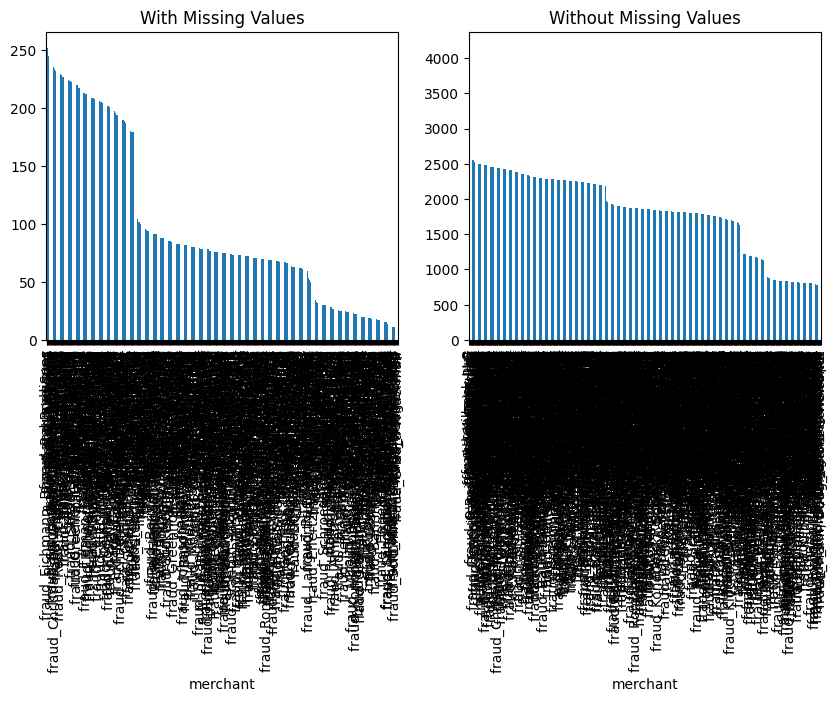

p-value of Chi-squared test: 0.0
The missingness in 'merchant' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for category:


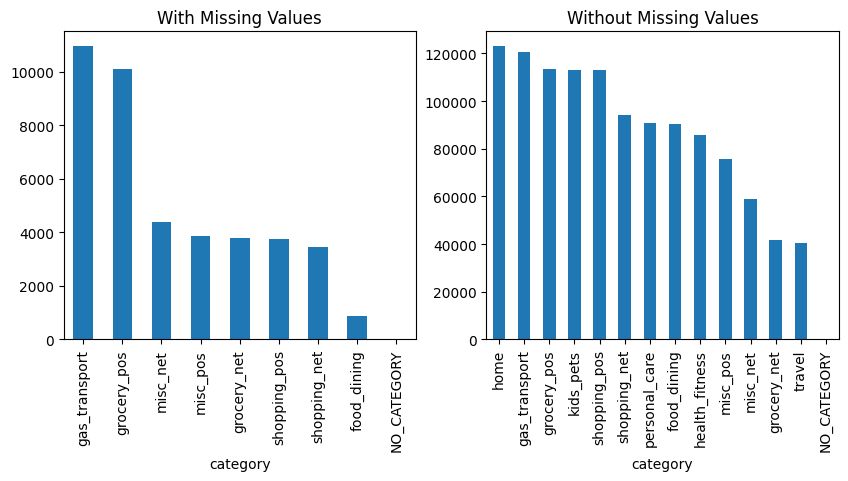

p-value of Chi-squared test: 0.0
The missingness in 'category' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for first:


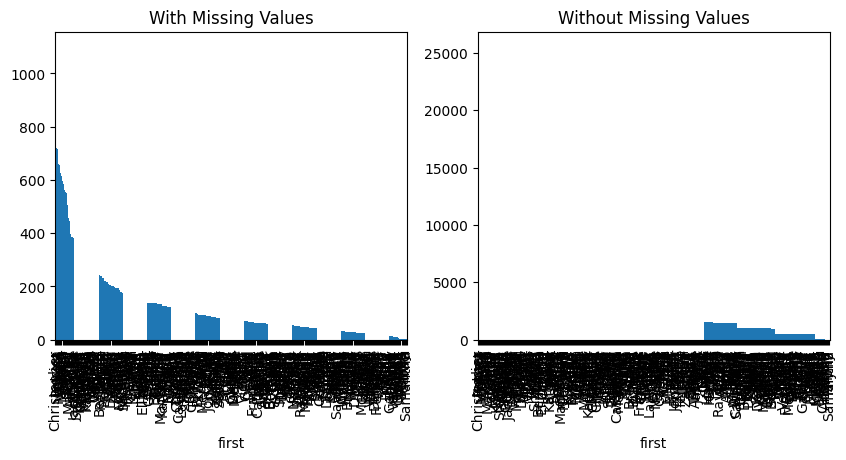

p-value of Chi-squared test: 0.0
The missingness in 'first' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for last:


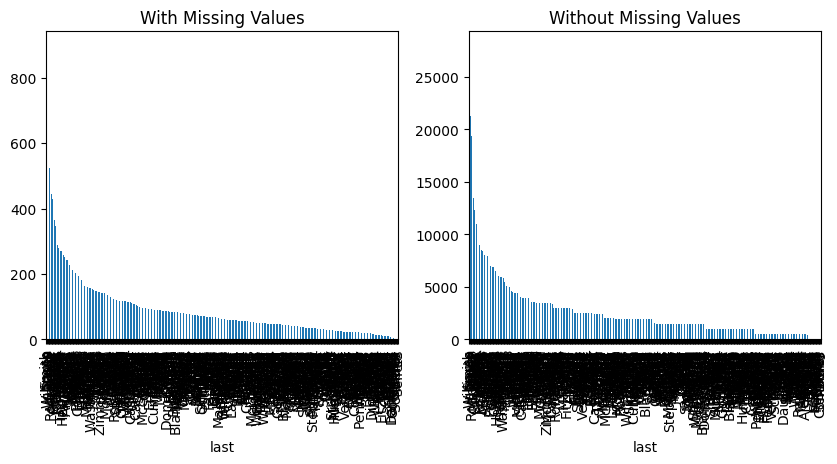

p-value of Chi-squared test: 0.0
The missingness in 'last' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for gender:


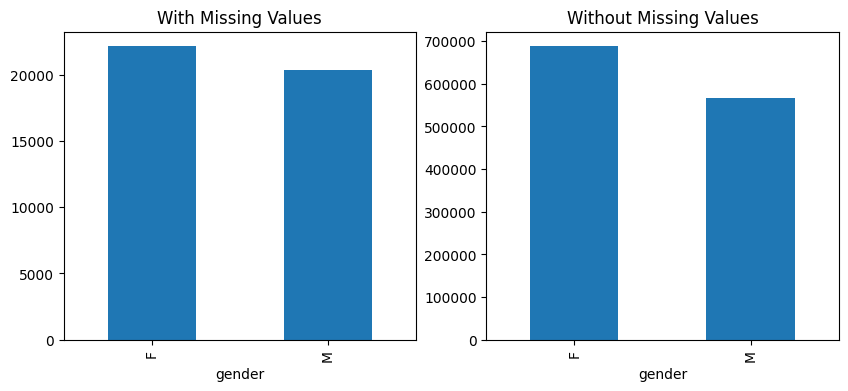

p-value of Chi-squared test: 3.307577302229261e-29
The missingness in 'gender' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for street:


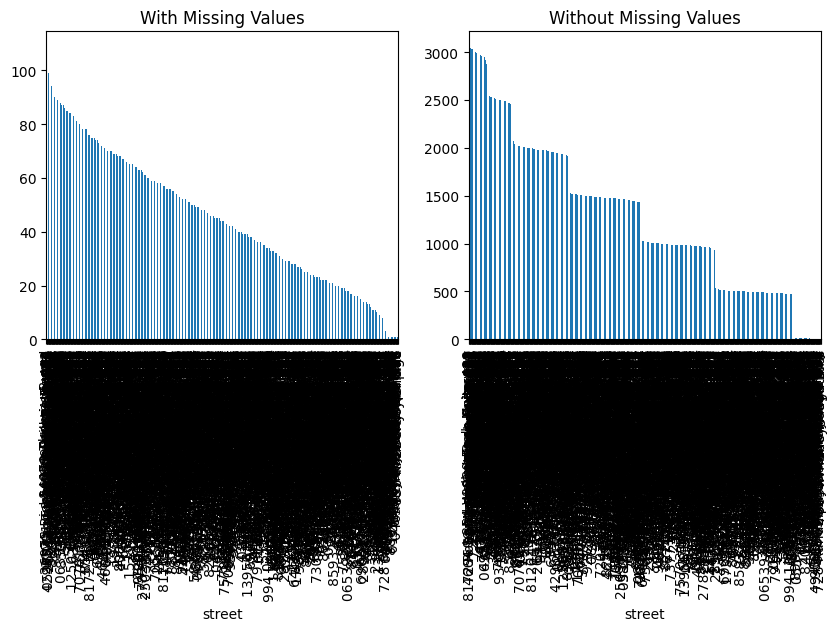

p-value of Chi-squared test: 0.0
The missingness in 'street' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for city:


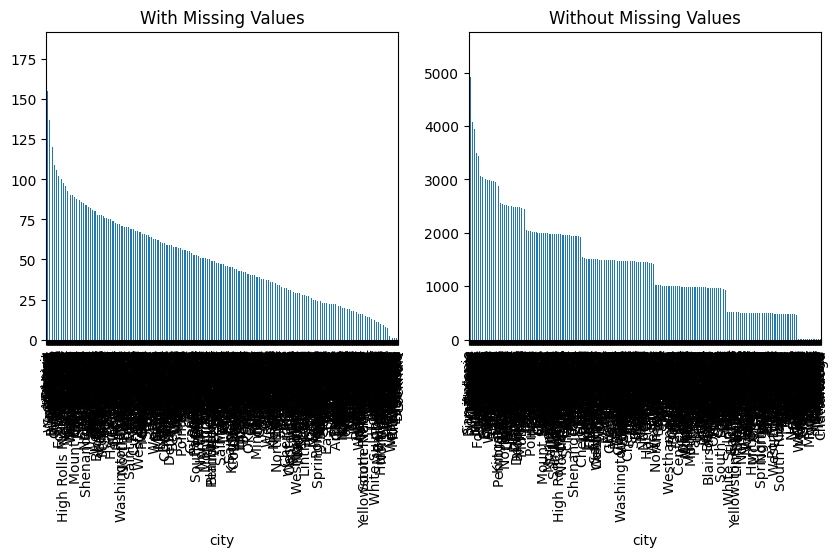

p-value of Chi-squared test: 0.0
The missingness in 'city' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for state:


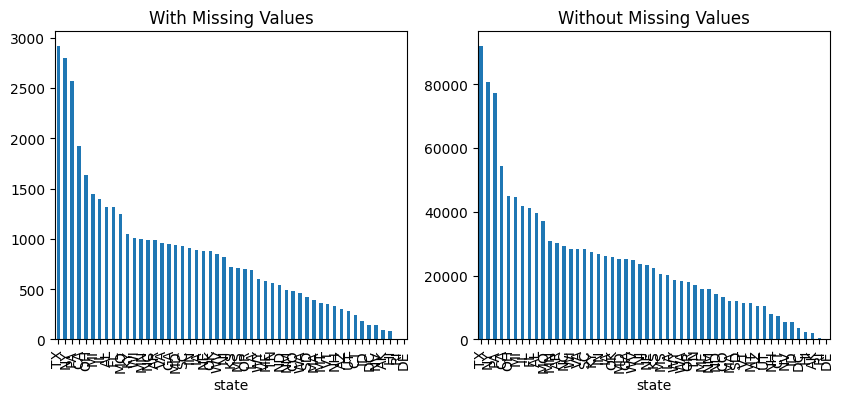

p-value of Chi-squared test: 2.160076933187576e-24
The missingness in 'state' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for job:


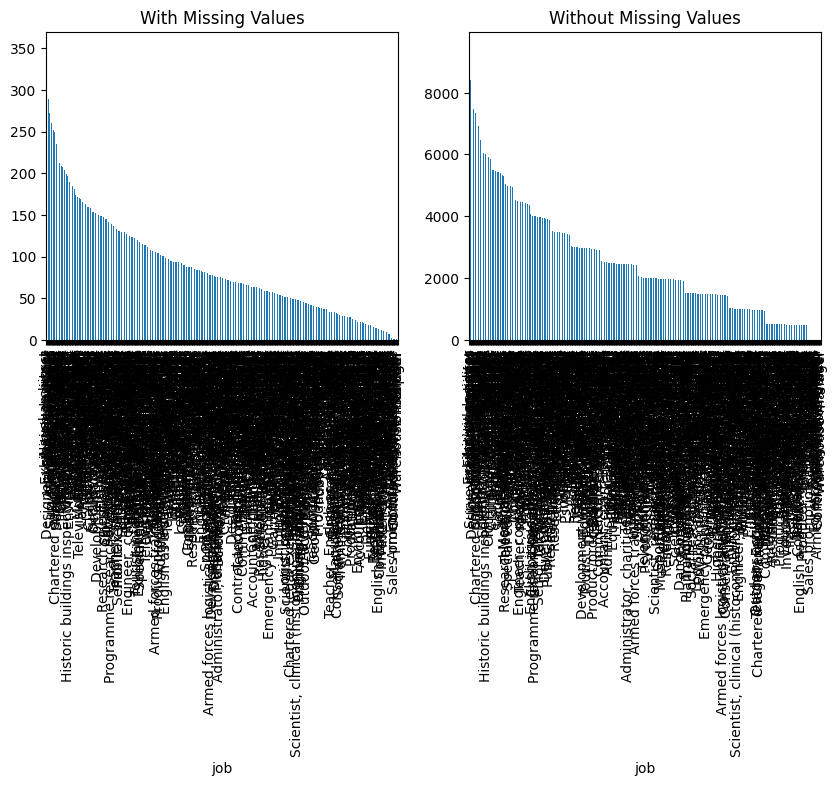

p-value of Chi-squared test: 0.0
The missingness in 'job' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for dob:


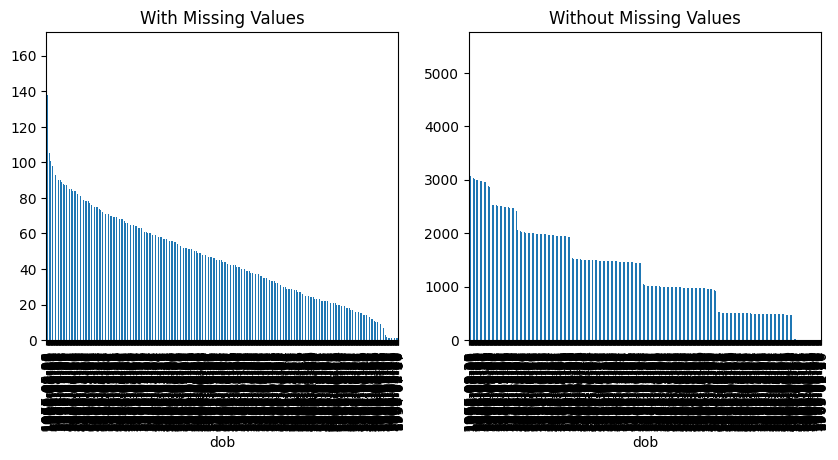

p-value of Chi-squared test: 0.0
The missingness in 'dob' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for trans_num:
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for weekday:


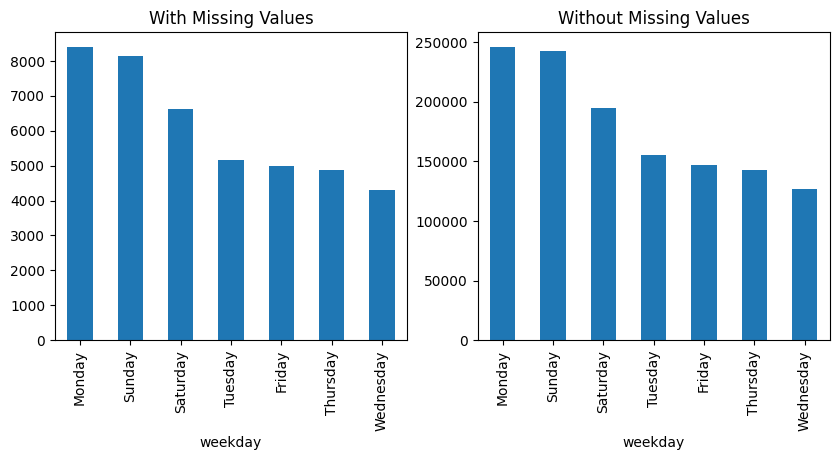

p-value of Chi-squared test: 0.7550993853609804
The missingness in 'weekday' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 


In [16]:
BM_MV = credit_card_df['amt'].isna()
for att in categorical_fields:
    print('Diagnosis Analysis of Missing Values for {}:'.format(att))
    Diagnose_MV_Categorical(credit_card_df,att,BM_MV)
    print('- - - - - - - - - - - - divider - - - - - - - - - - - ')

The missing values in the amt column can be classified as MAR (Missing At Random), as the analysis indicates that these values are predominantly missing for transactions that occurred between 12 PM and 1 AM. This pattern suggests that the missingness is systematically related to the transaction time, which may reflect specific data recording practices or operational factors during this time period.

#### Missing Value anlysis for city_pop

Diagnosis Analysis of Missing Values for cc_num:


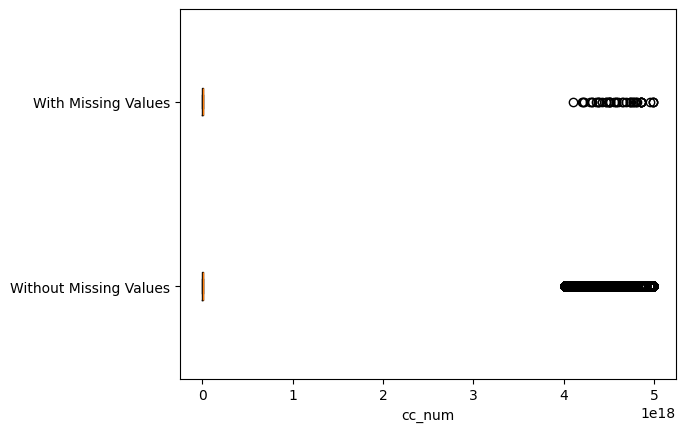

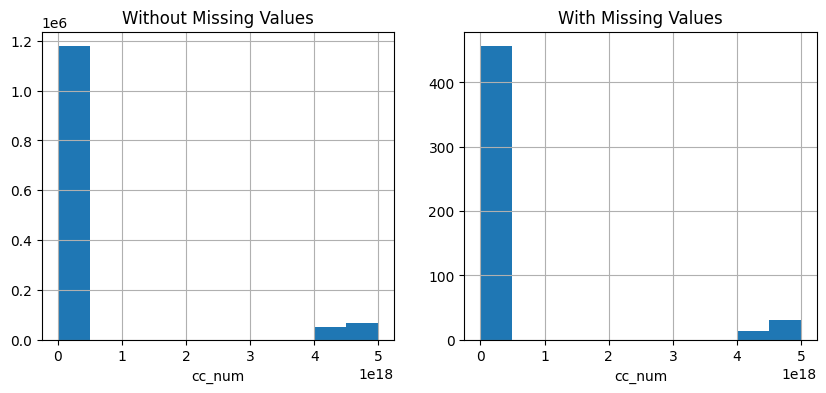

p-value of t-test: 0.8672187160559379
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for amt:


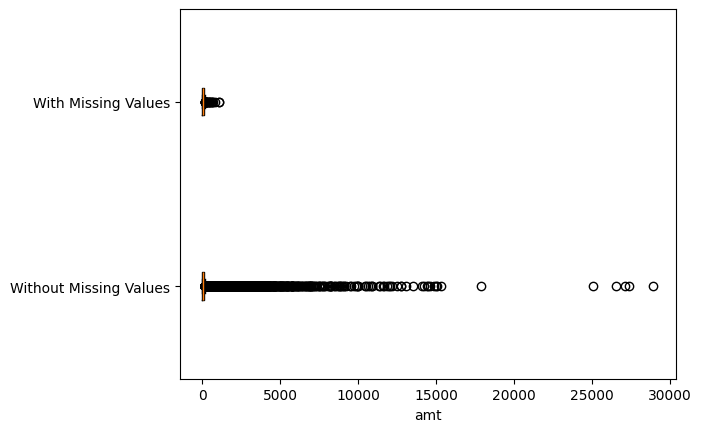

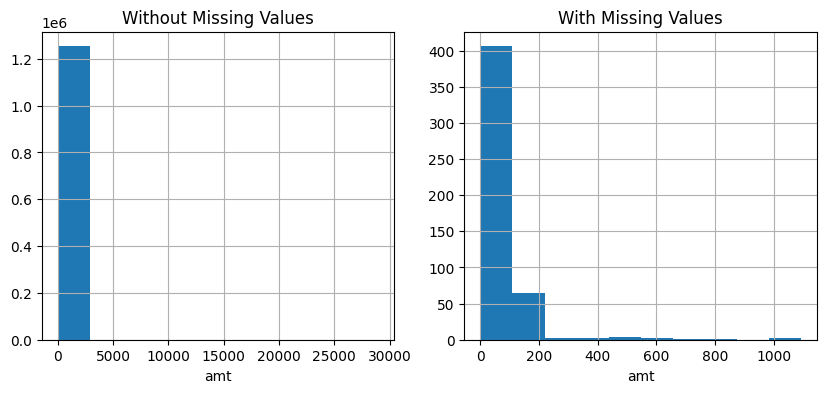

p-value of t-test: 0.8130610134888391
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for zip:


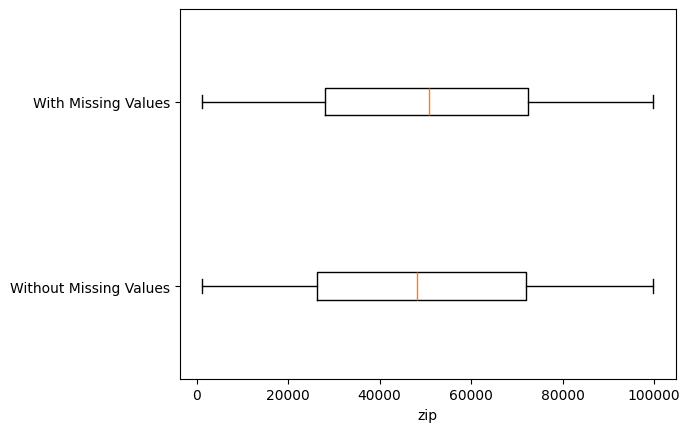

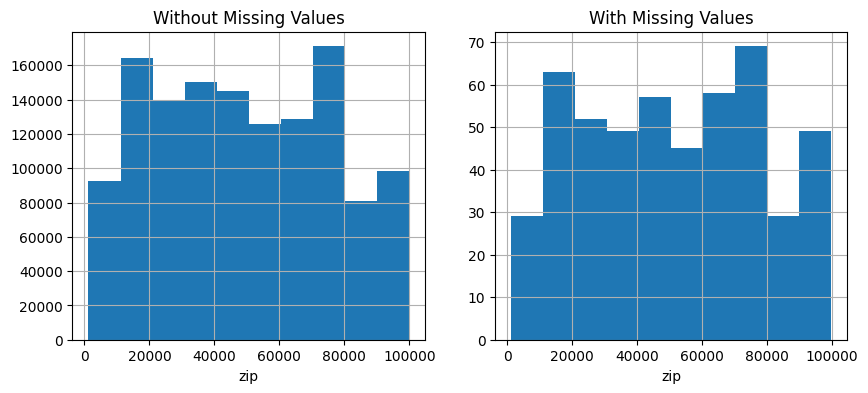

p-value of t-test: 0.10158562890874115
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for lat:


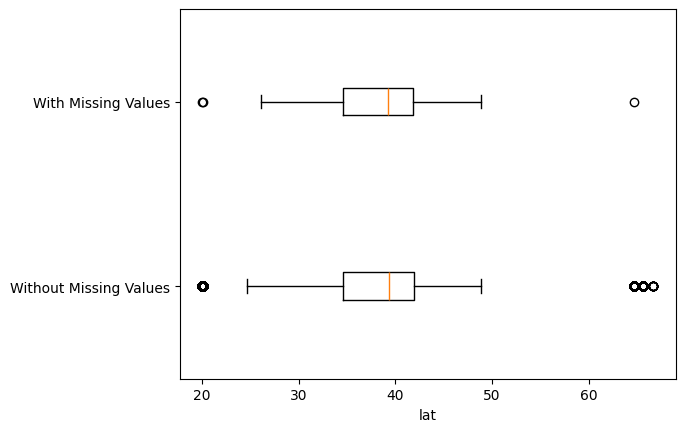

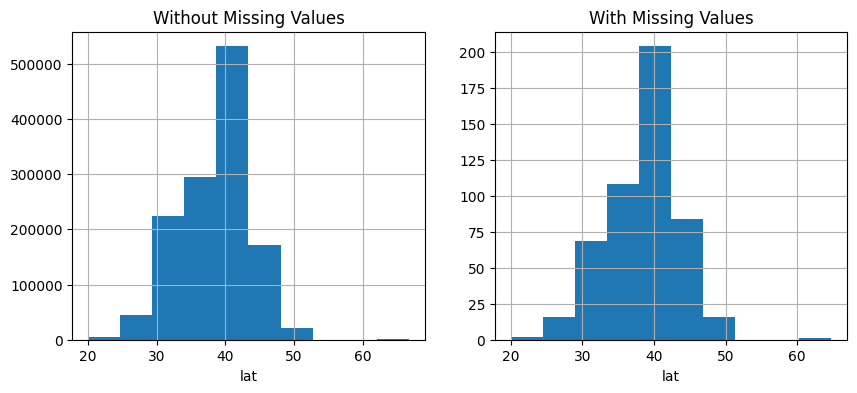

p-value of t-test: 0.8188789053113735
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for long:


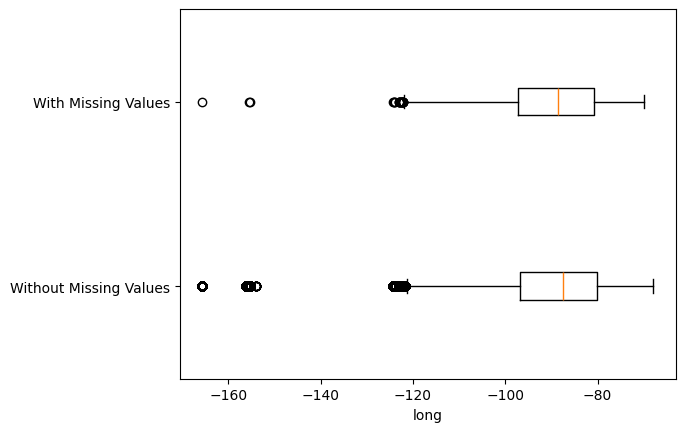

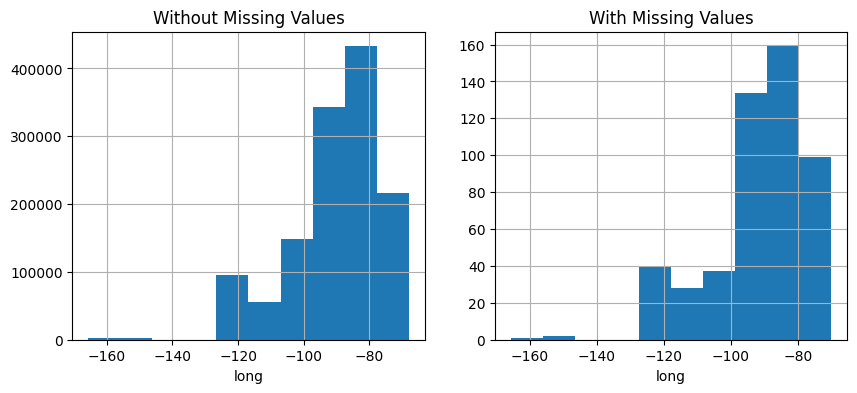

p-value of t-test: 0.10791803614334182
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for city_pop:


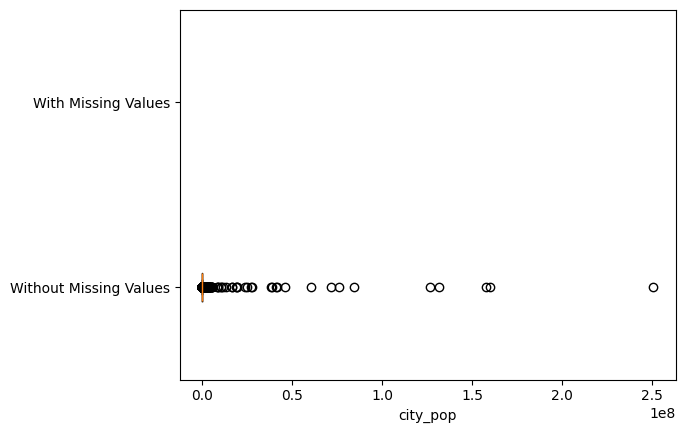

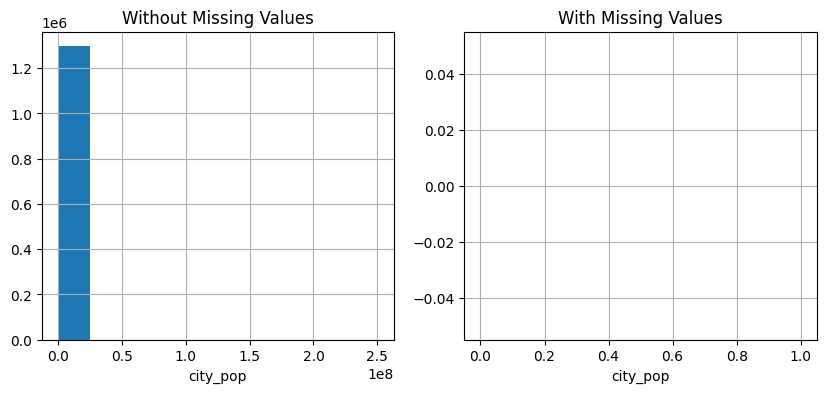

C:\Users\Dell\AppData\Local\Temp\ipykernel_25320\1525526324.py:33: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  p_value = ttest_ind(group_1_data,group_2_data).pvalue


p-value of t-test: nan
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for unix_time:


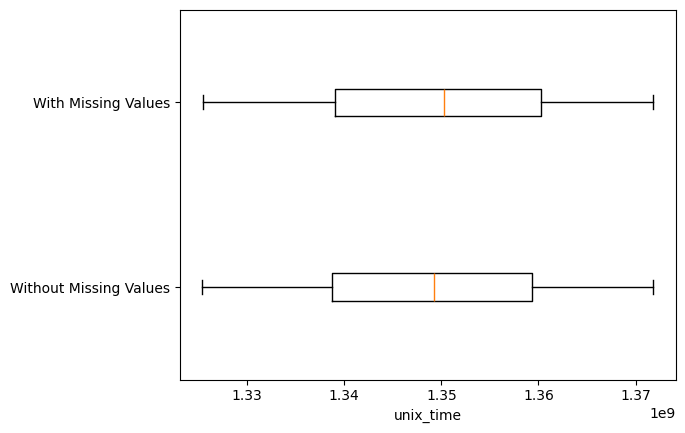

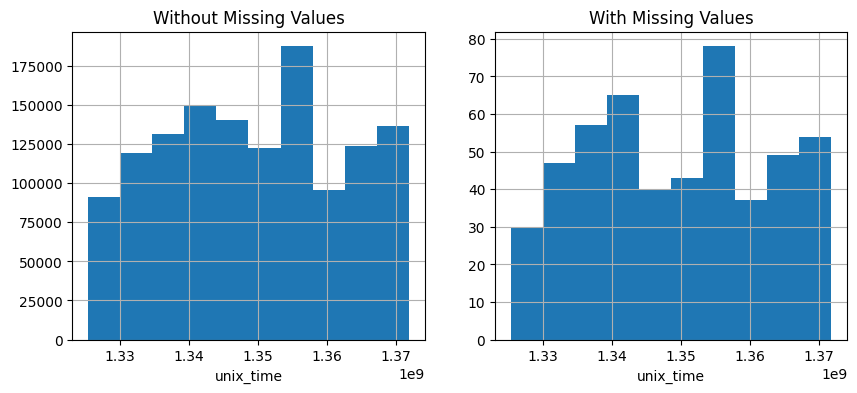

p-value of t-test: 0.6872992151031838
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for merch_lat:


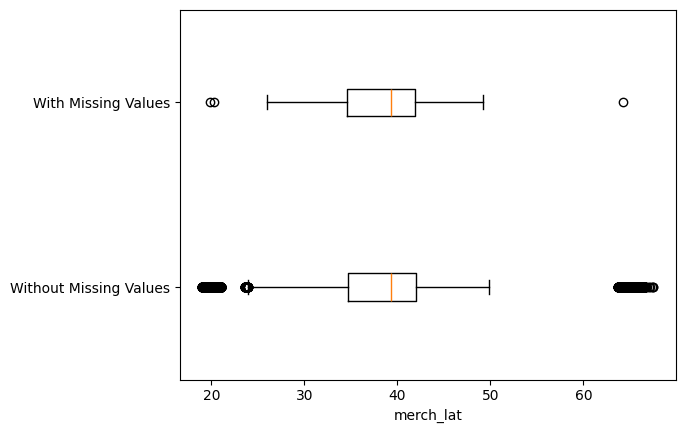

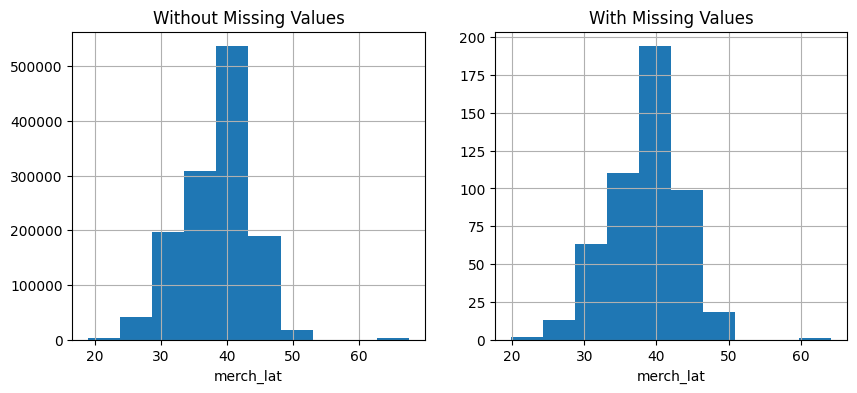

p-value of t-test: 0.8121863283069568
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for merch_long:


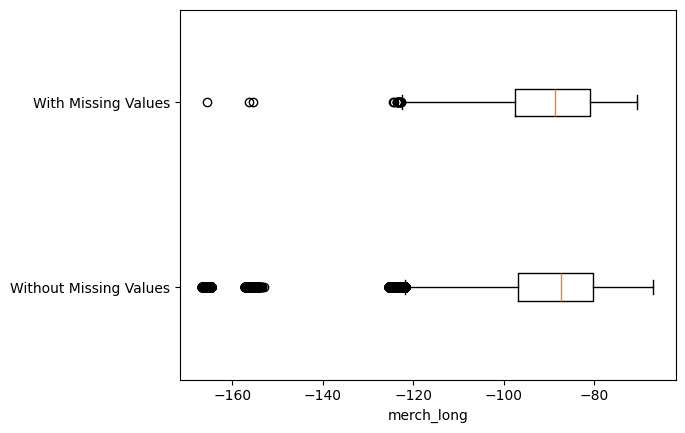

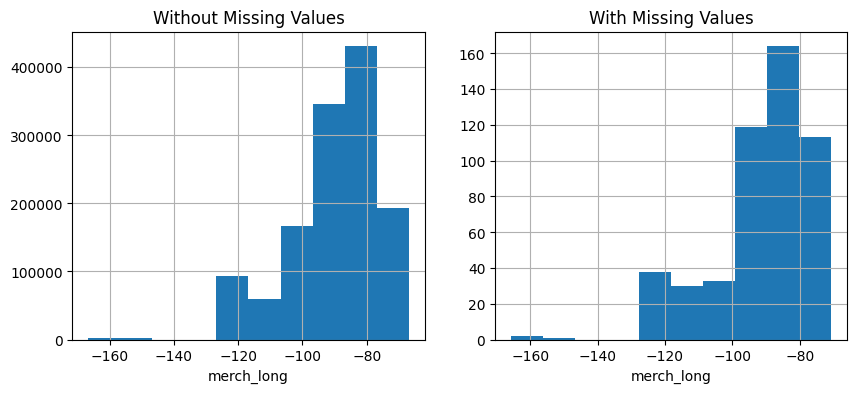

p-value of t-test: 0.10929441798853505
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for is_fraud:


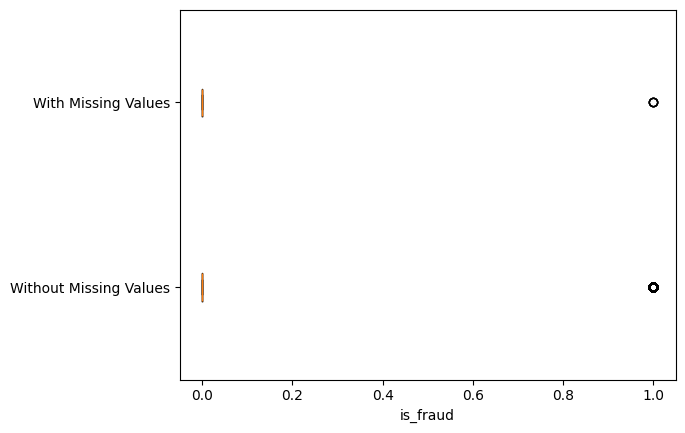

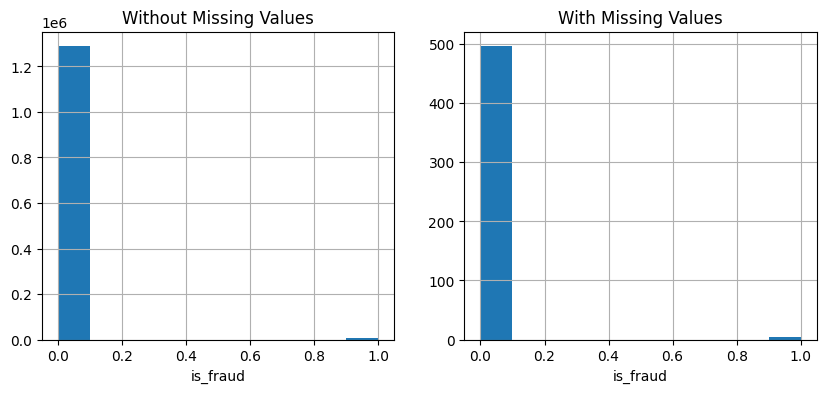

p-value of t-test: 0.5144497443559715
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for merch_zipcode:


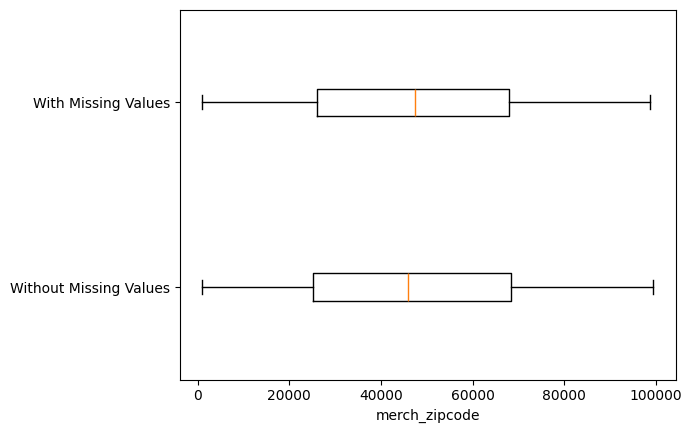

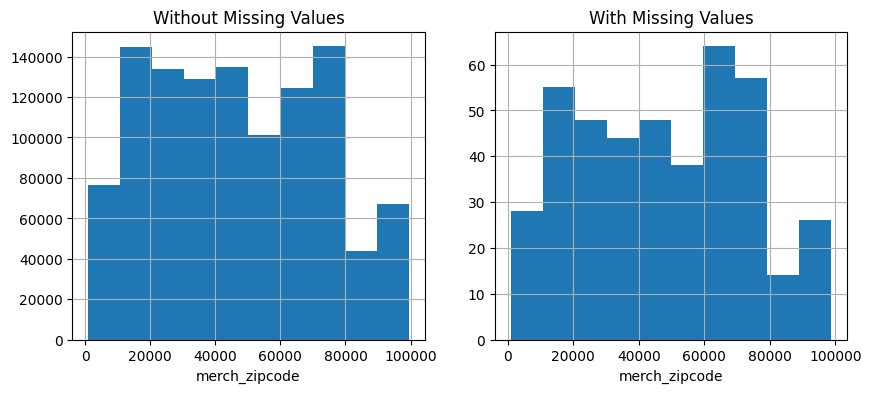

p-value of t-test: 0.5087669658730101
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for month:


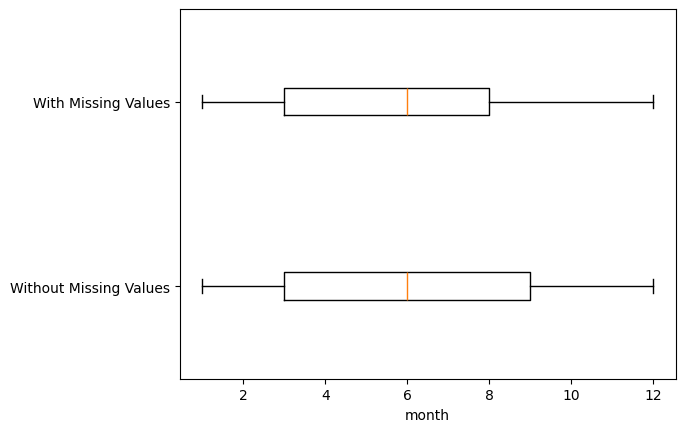

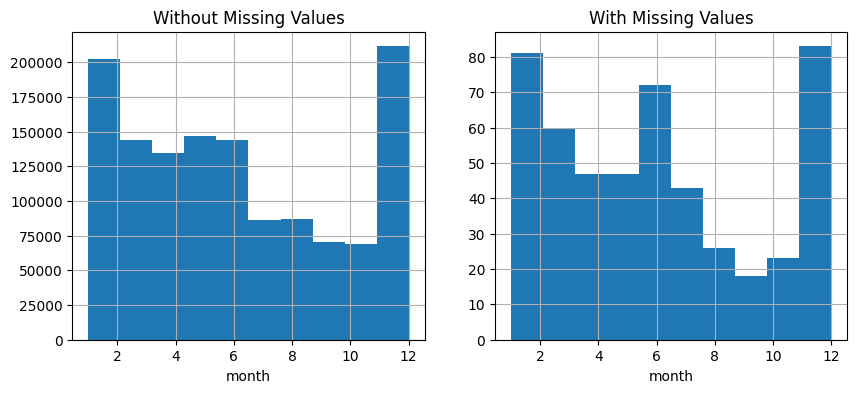

p-value of t-test: 0.5378266135949743
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for day:


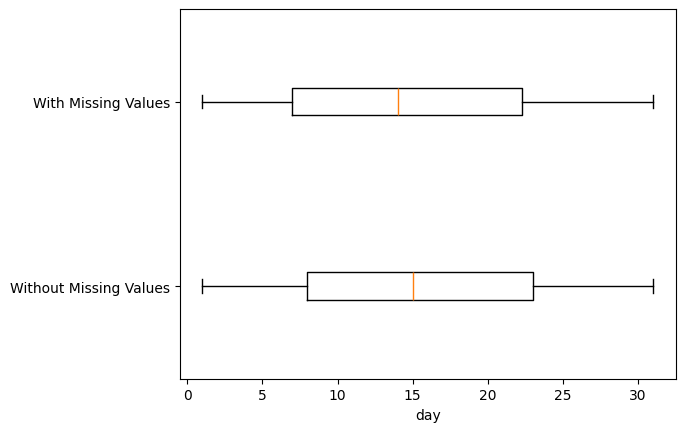

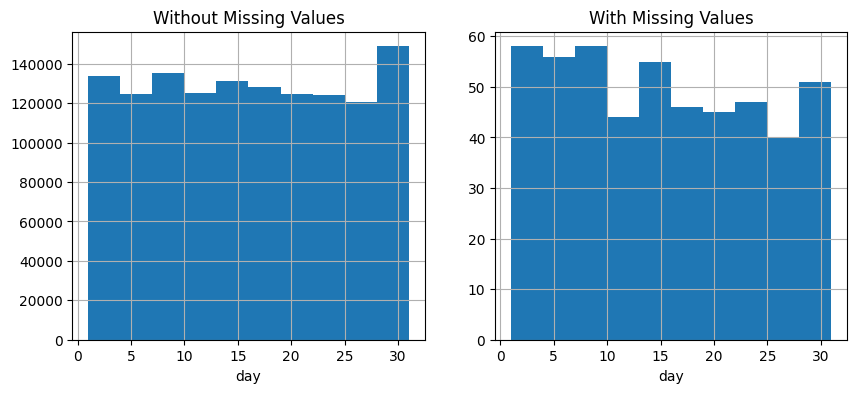

p-value of t-test: 0.054217222639405864
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for hour:


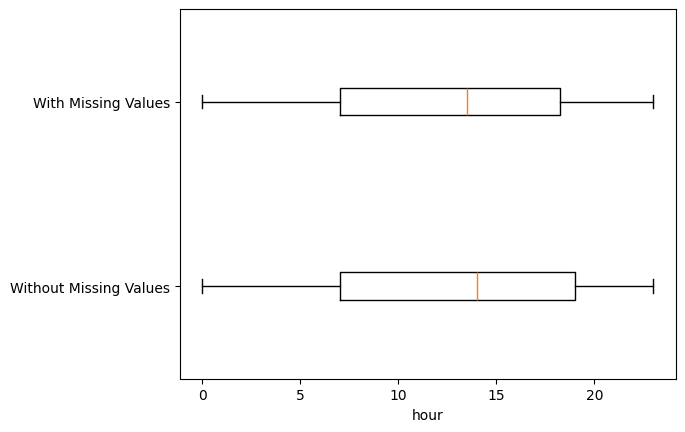

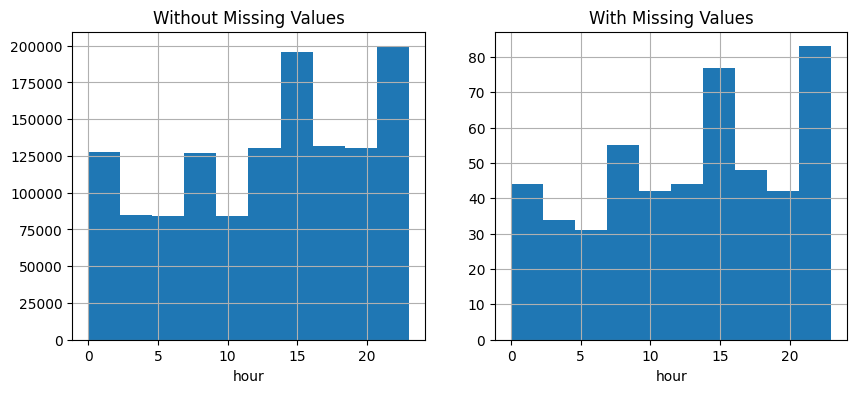

p-value of t-test: 0.94470769211473
No significant difference between groups. Missing values might be random.
- - - - - - - - - - - - divider - - - - - - - - - - - 


In [17]:
BM_MV = credit_card_df['city_pop'].isna()
for att in numerical_fields:
    print('Diagnosis Analysis of Missing Values for {}:'.format(att))
    Diagnose_MV_Numerical(credit_card_df,att,BM_MV)
    print('- - - - - - - - - - - - divider - - - - - - - - - - - ')

Diagnosis Analysis of Missing Values for merchant:


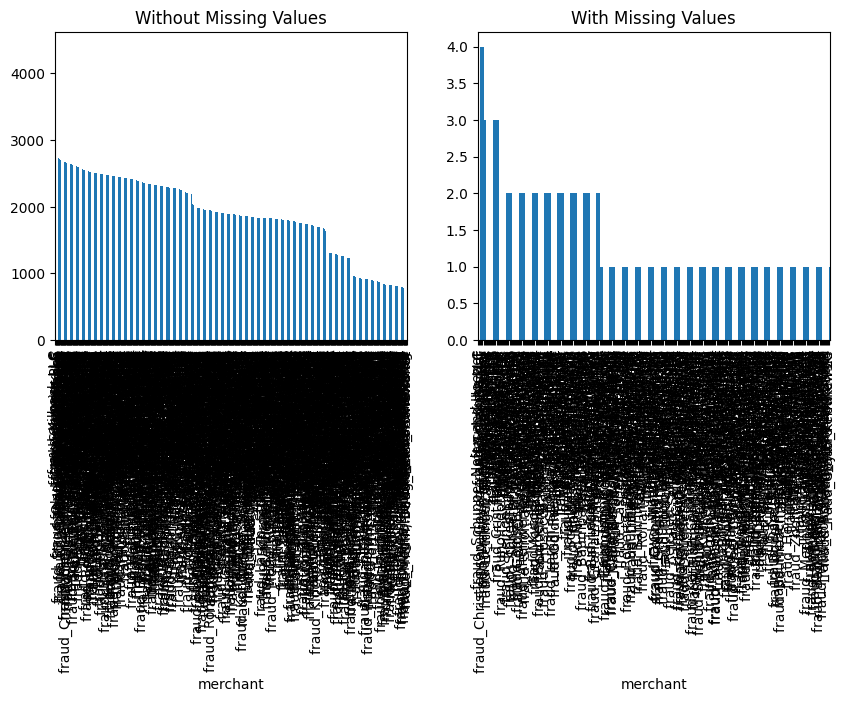

p-value of Chi-squared test: 0.8840327591947281
The missingness in 'merchant' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for category:


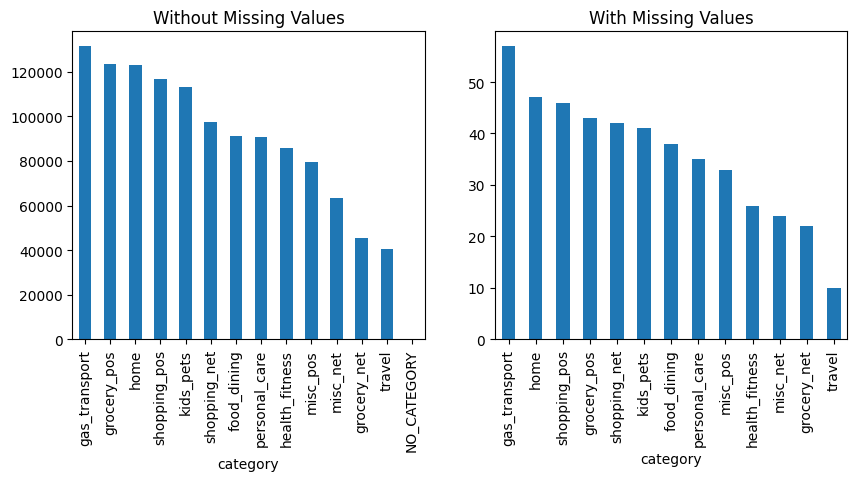

p-value of Chi-squared test: 0.8983447372555613
The missingness in 'category' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for first:


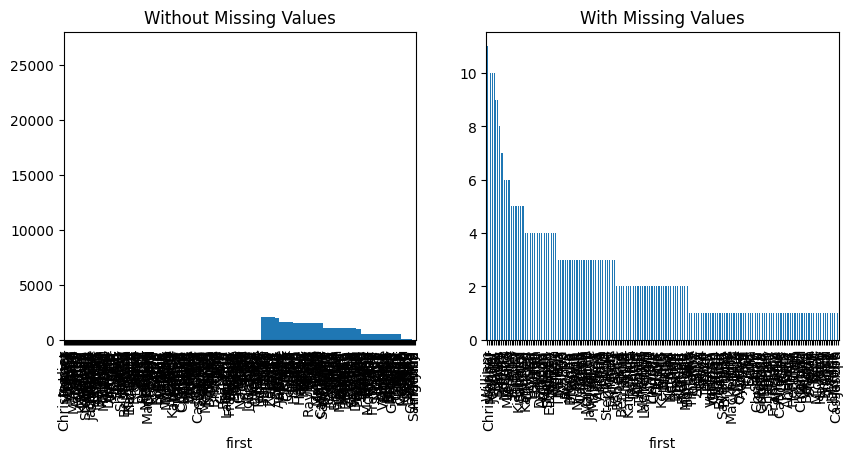

p-value of Chi-squared test: 0.8611693522430471
The missingness in 'first' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for last:


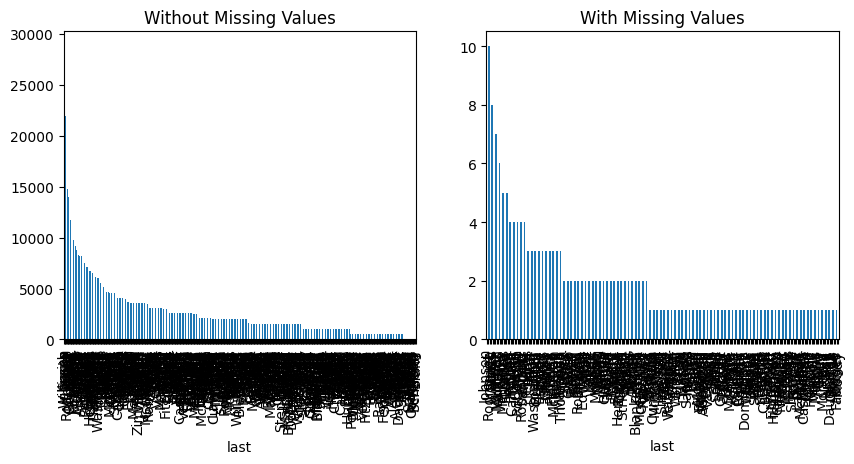

p-value of Chi-squared test: 0.9556923502114744
The missingness in 'last' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for gender:


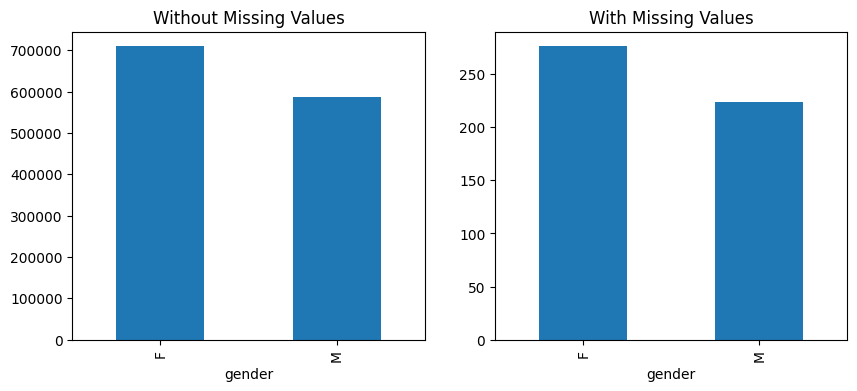

p-value of Chi-squared test: 0.8732188564017778
The missingness in 'gender' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for street:


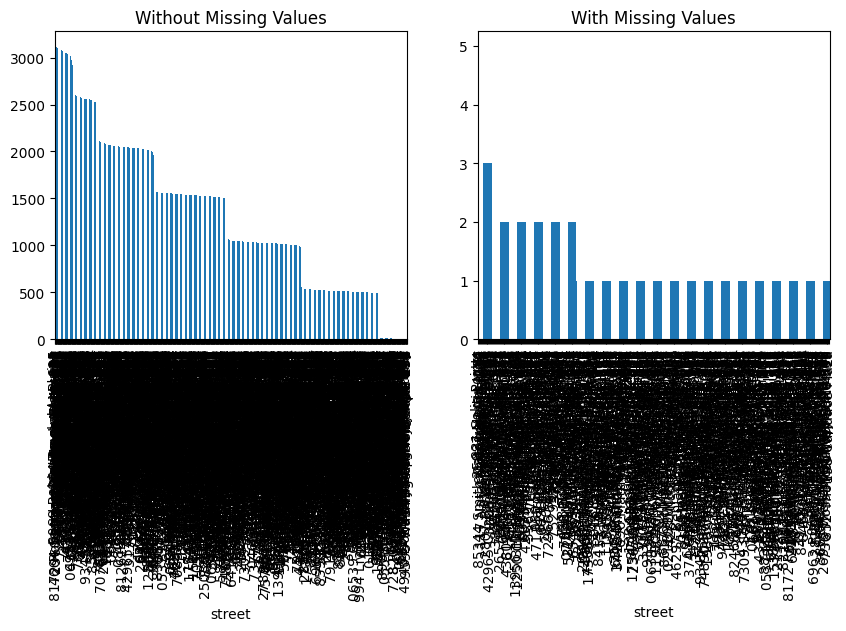

p-value of Chi-squared test: 0.9881505706324941
The missingness in 'street' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for city:


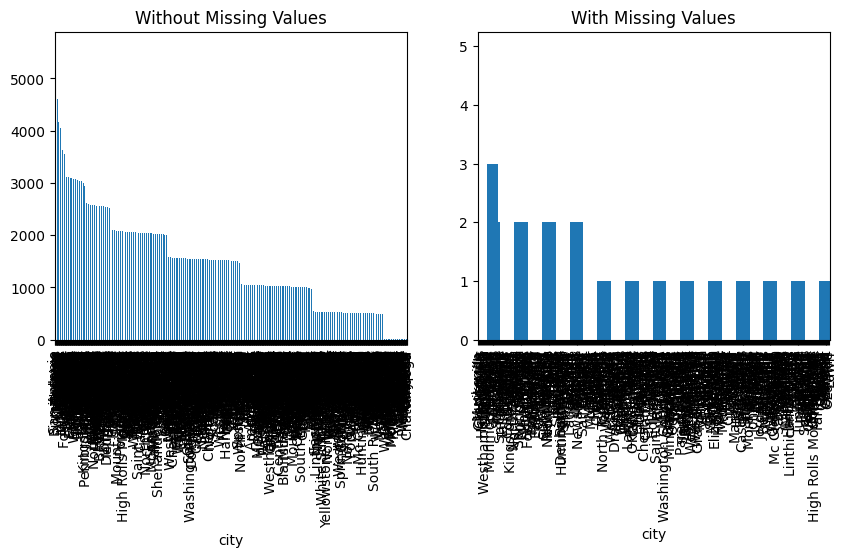

p-value of Chi-squared test: 0.9604403480238483
The missingness in 'city' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for state:


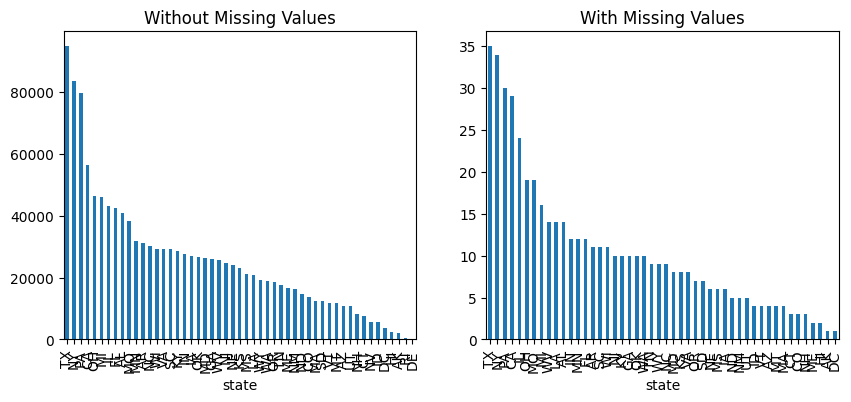

p-value of Chi-squared test: 0.9595076602379677
The missingness in 'state' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for job:


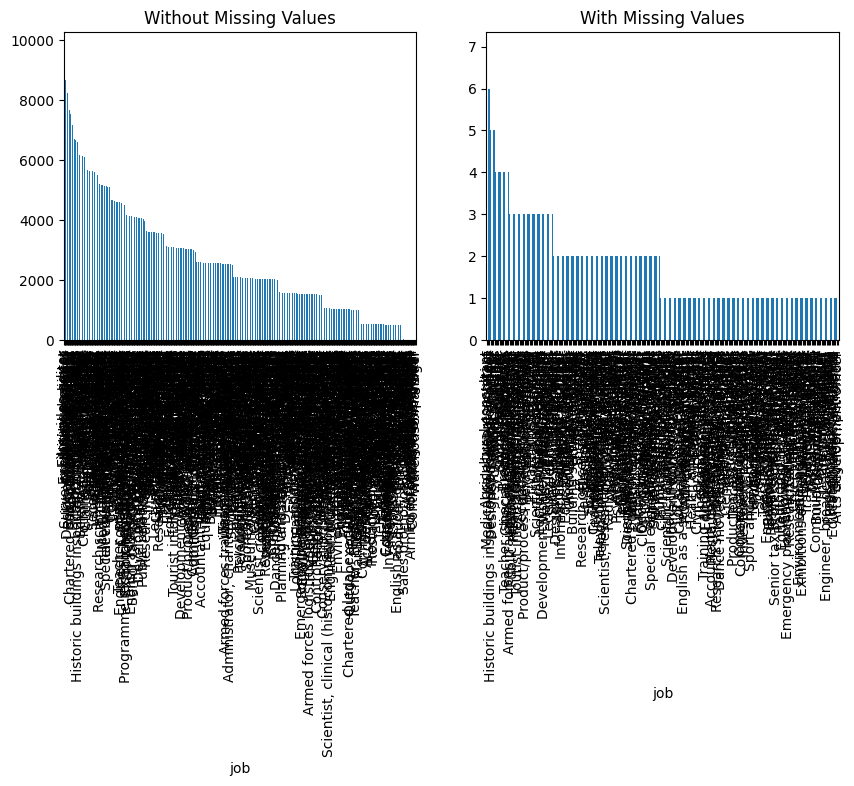

p-value of Chi-squared test: 0.9905507200458206
The missingness in 'job' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for dob:


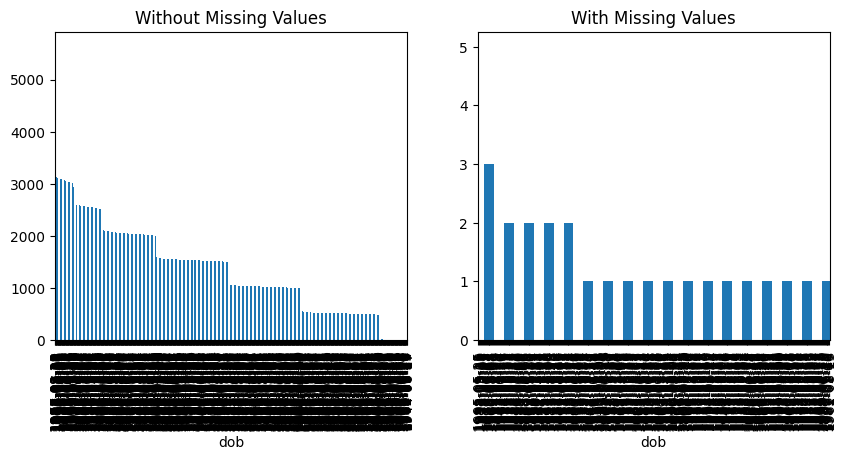

p-value of Chi-squared test: 0.9848071141740279
The missingness in 'dob' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for trans_num:
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for weekday:


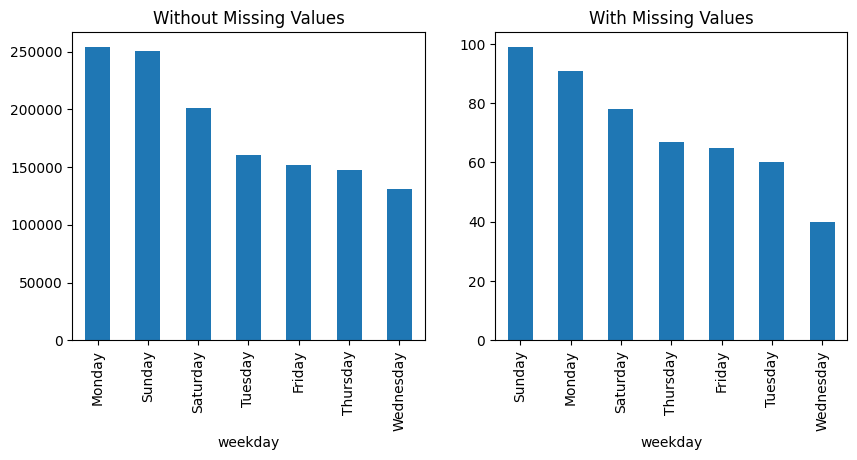

p-value of Chi-squared test: 0.5024746341580995
The missingness in 'weekday' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 


In [18]:
BM_MV = credit_card_df['city_pop'].isna()
for att in categorical_fields:
    print('Diagnosis Analysis of Missing Values for {}:'.format(att))
    Diagnose_MV_Categorical(credit_card_df,att,BM_MV)
    print('- - - - - - - - - - - - divider - - - - - - - - - - - ')

The missing values in the city_pop column appear to be of the MCAR (Missing Completely At Random) type, as the analysis does not reveal any discernible pattern or relationship with other attributes in the dataset. This randomness suggests that the missing values might have resulted from a system error or an unforeseen technical glitch during data collection or processing.

In [ ]:
BM_MV = credit_card_df['merch_zipcode'].isna()
for att in numerical_fields:
    print('Diagnosis Analysis of Missing Values for {}:'.format(att))
    Diagnose_MV_Categorical(credit_card_df,att,BM_MV)
    print('- - - - - - - - - - - - divider - - - - - - - - - - - ')

Diagnosis Analysis of Missing Values for cc_num:


Diagnosis Analysis of Missing Values for merchant:


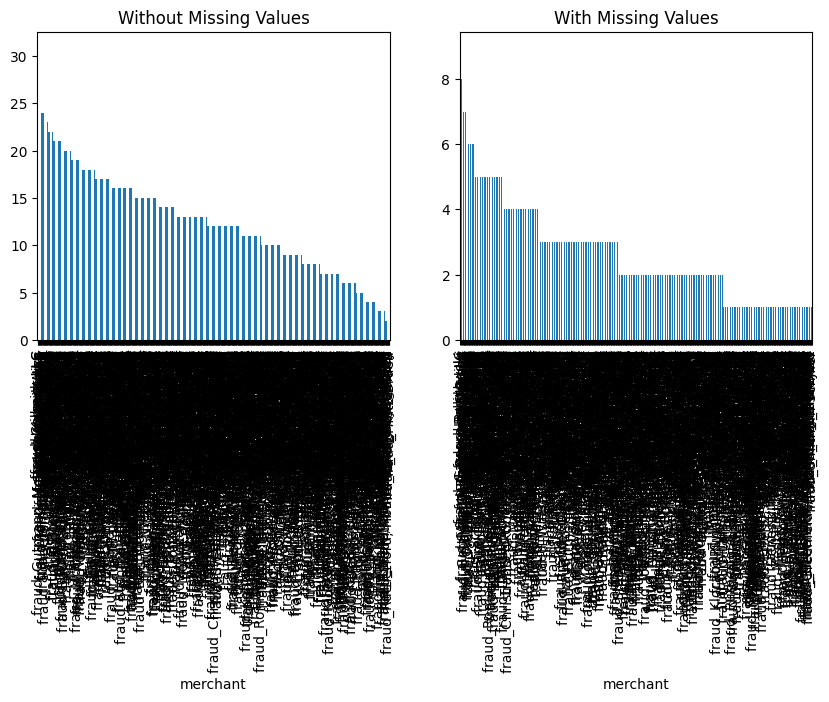

p-value of Chi-squared test: 0.4126174277259361
The missingness in 'merchant' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for category:


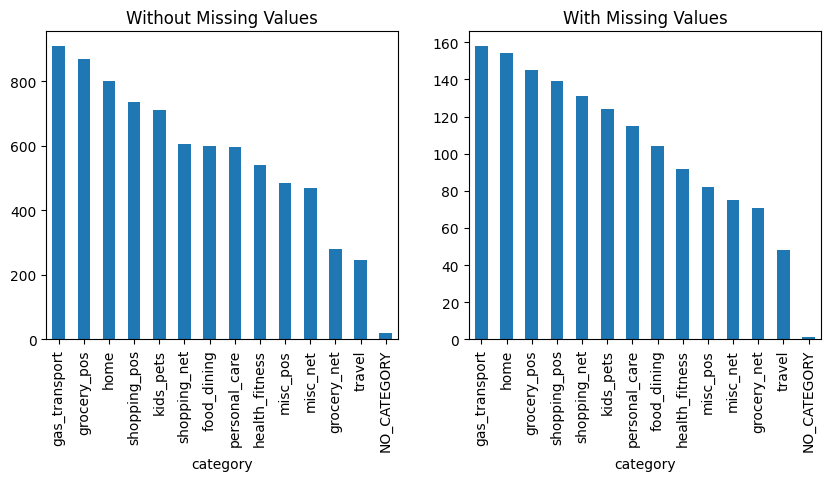

p-value of Chi-squared test: 0.2552914992612623
The missingness in 'category' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for first:


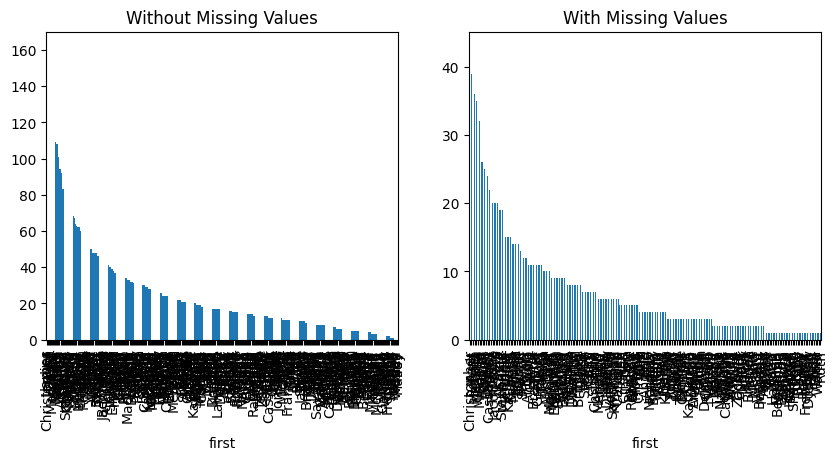

p-value of Chi-squared test: 3.979365907785152e-161
The missingness in 'first' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for last:


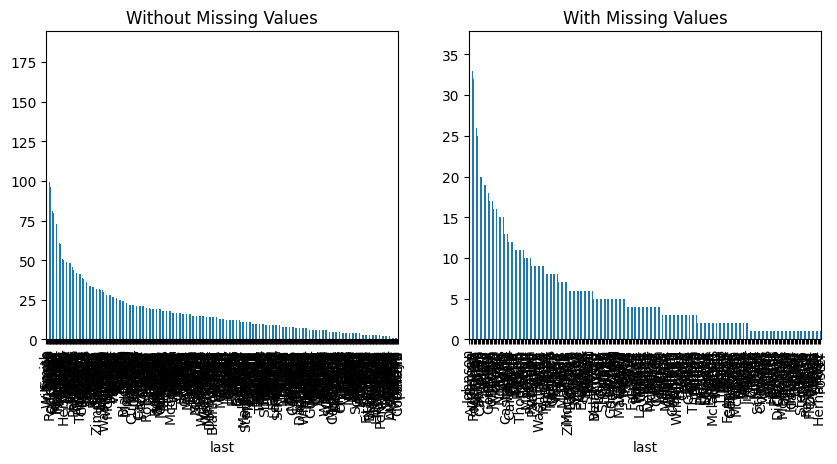

p-value of Chi-squared test: 1.544446912123674e-197
The missingness in 'last' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for gender:


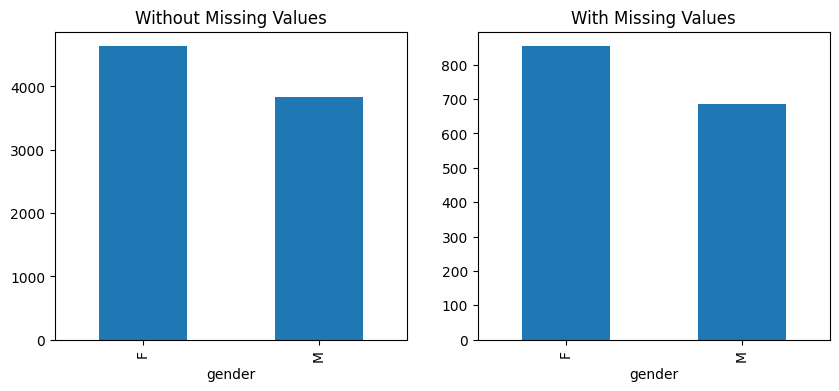

p-value of Chi-squared test: 0.6197993964474187
The missingness in 'gender' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for street:


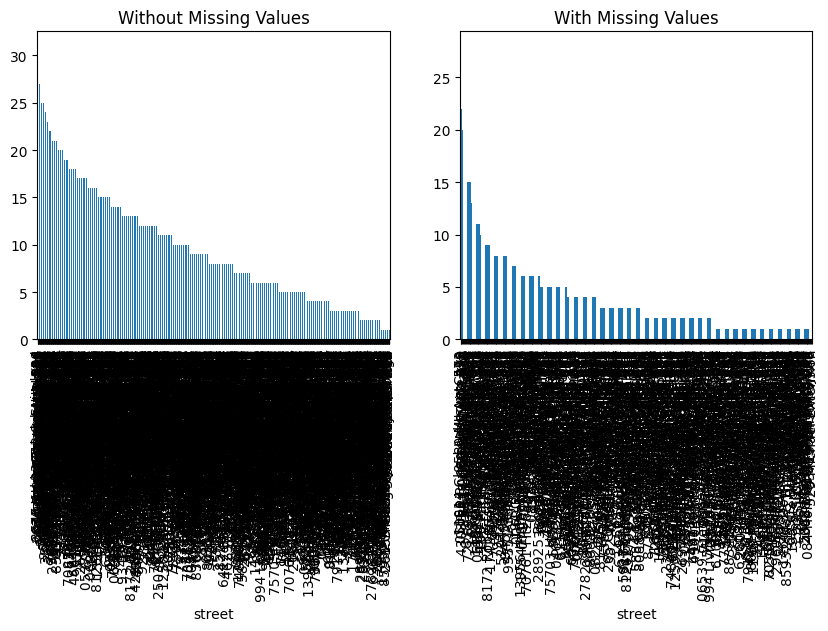

p-value of Chi-squared test: 0.0
The missingness in 'street' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for city:


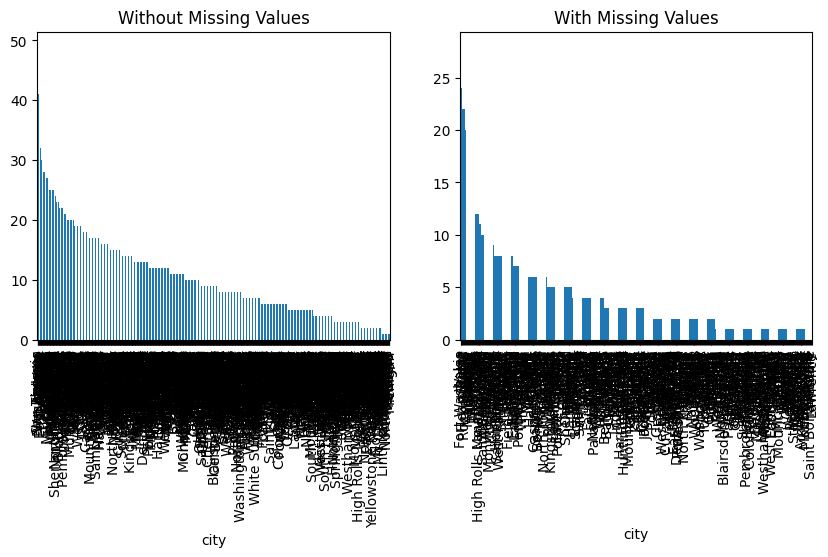

p-value of Chi-squared test: 0.0
The missingness in 'city' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for state:


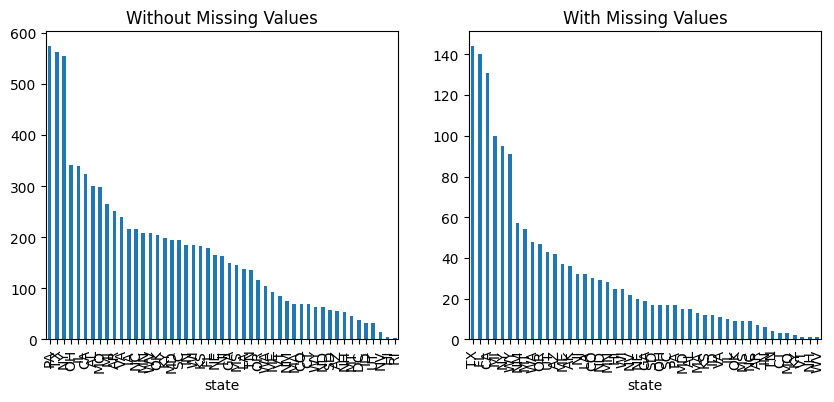

p-value of Chi-squared test: 0.0
The missingness in 'state' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for job:


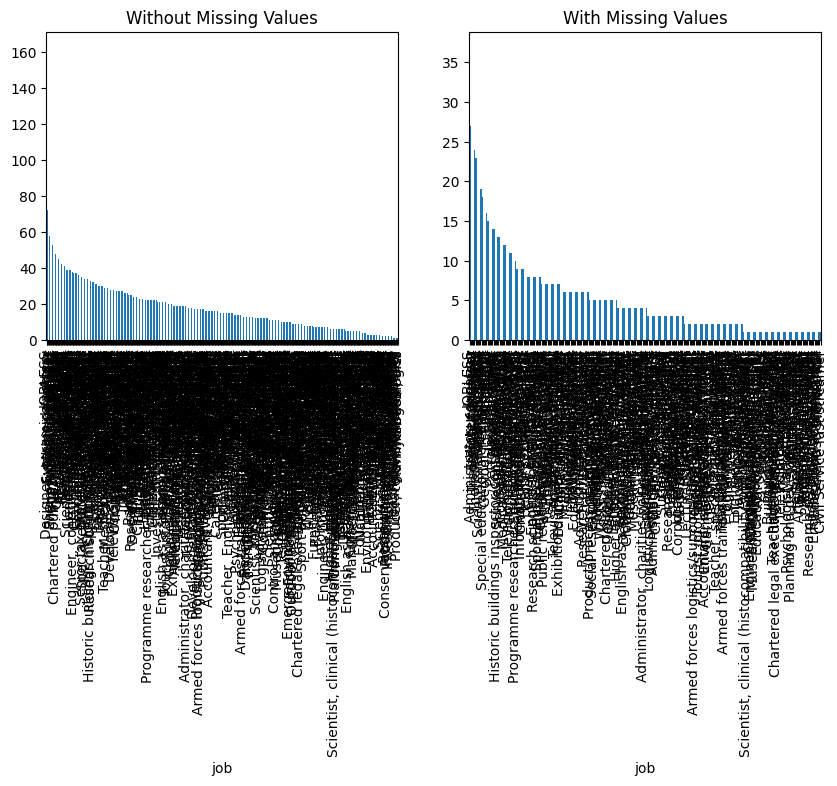

p-value of Chi-squared test: 8.940178655844258e-227
The missingness in 'job' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for dob:


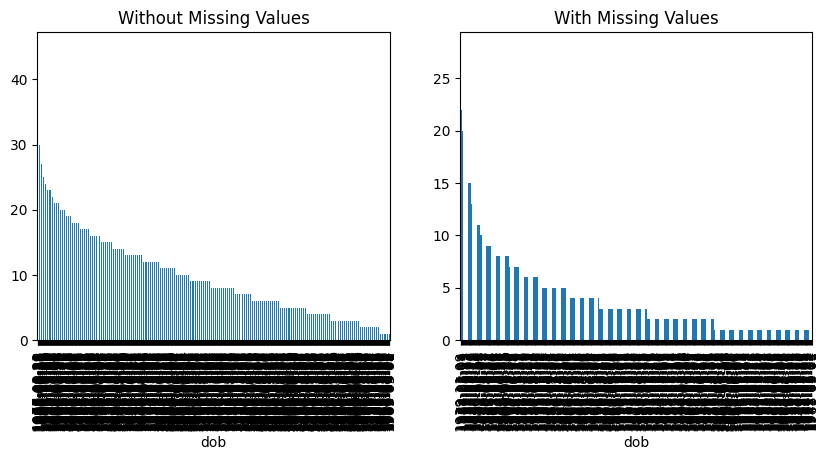

p-value of Chi-squared test: 0.0
The missingness in 'dob' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for trans_num:
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for weekday:


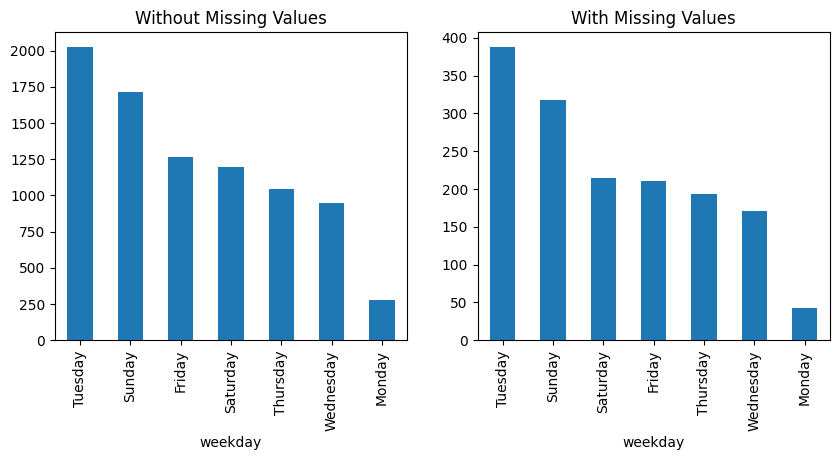

p-value of Chi-squared test: 0.7377440515643501
The missingness in 'weekday' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 


In [ ]:
BM_MV = credit_card_df['merch_zipcode'].isna()
for att in categorical_fields:
    print('Diagnosis Analysis of Missing Values for {}:'.format(att))
    Diagnose_MV_Categorical(credit_card_df,att,BM_MV)
    print('- - - - - - - - - - - - divider - - - - - - - - - - - ')

#### Missing Anlaysis for Categorical Attribute.

Missing Analysis for merchant


Diagnosis Analysis of Missing Values for cc_num:


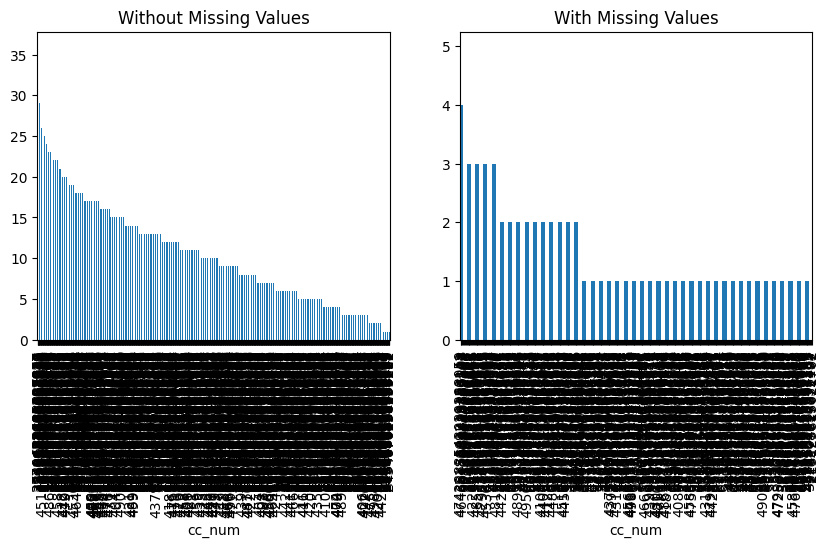

p-value of Chi-squared test: 0.43552985395484994
The missingness in 'cc_num' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for amt:


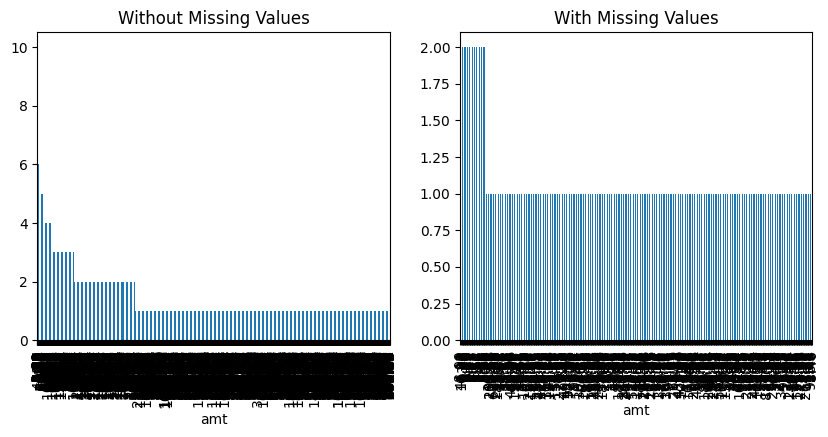

p-value of Chi-squared test: 0.9999999999998972
The missingness in 'amt' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for zip:


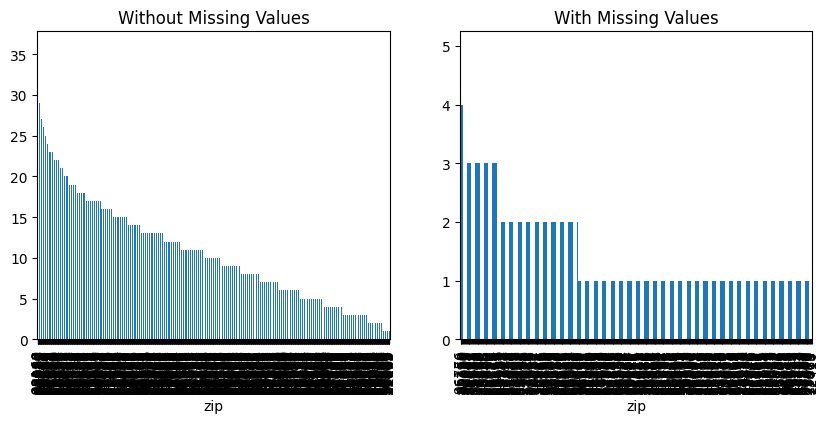

p-value of Chi-squared test: 0.4508278216988525
The missingness in 'zip' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for lat:


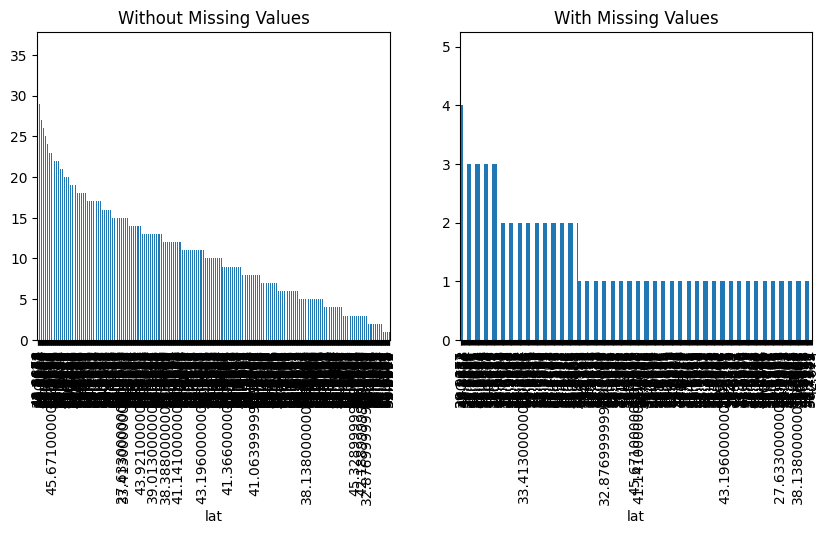

p-value of Chi-squared test: 0.4532322112684079
The missingness in 'lat' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for long:


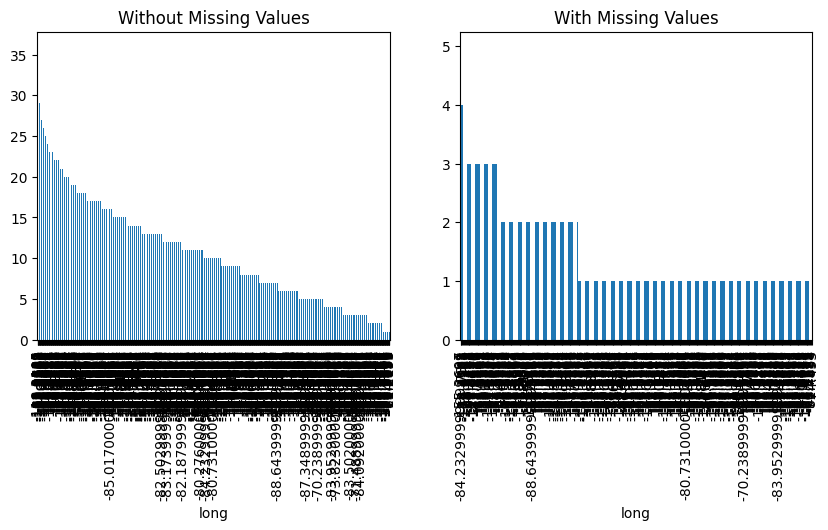

p-value of Chi-squared test: 0.4585726311639574
The missingness in 'long' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for city_pop:


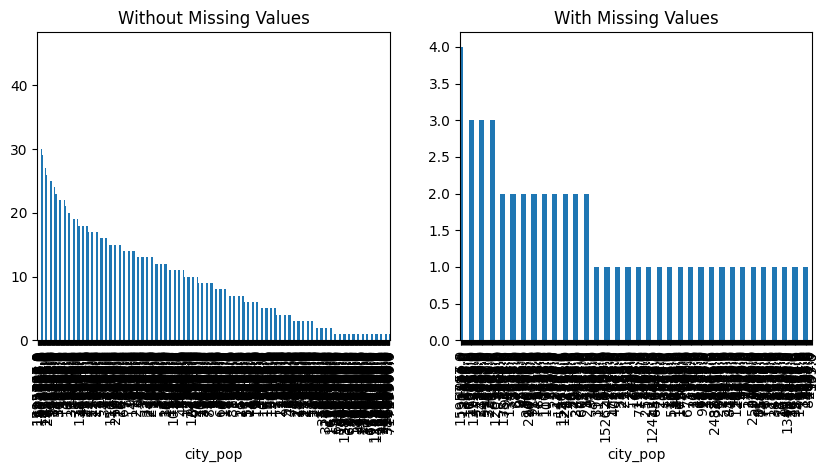

p-value of Chi-squared test: 0.3783810485246167
The missingness in 'city_pop' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for unix_time:


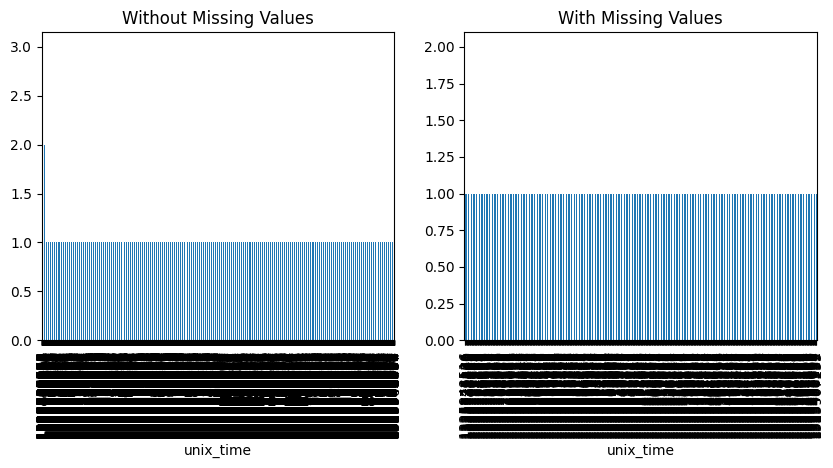

p-value of Chi-squared test: 0.565371624904215
The missingness in 'unix_time' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for merch_lat:


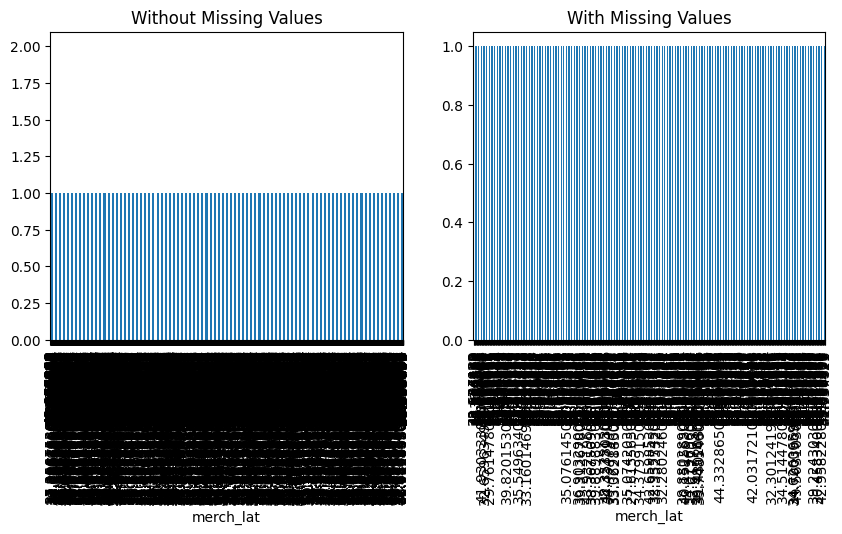

p-value of Chi-squared test: 0.48683689071720526
The missingness in 'merch_lat' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for merch_long:


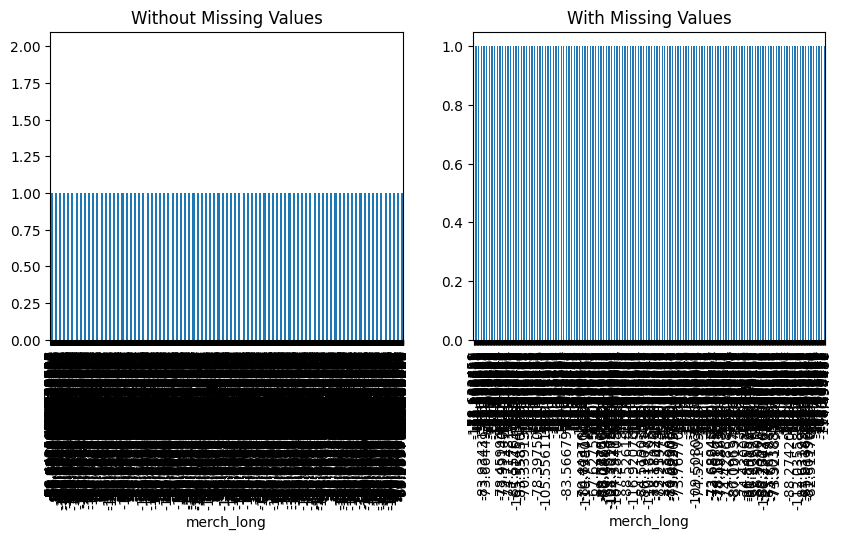

p-value of Chi-squared test: 0.49247756416151345
The missingness in 'merch_long' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for is_fraud:


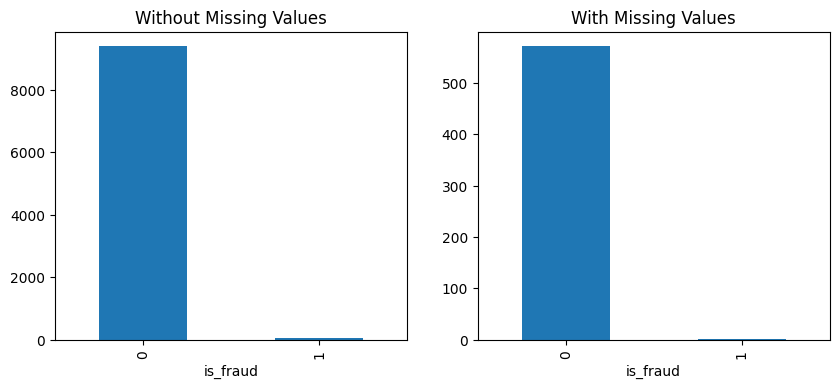

p-value of Chi-squared test: 0.4543278869845381
The missingness in 'is_fraud' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for merch_zipcode:


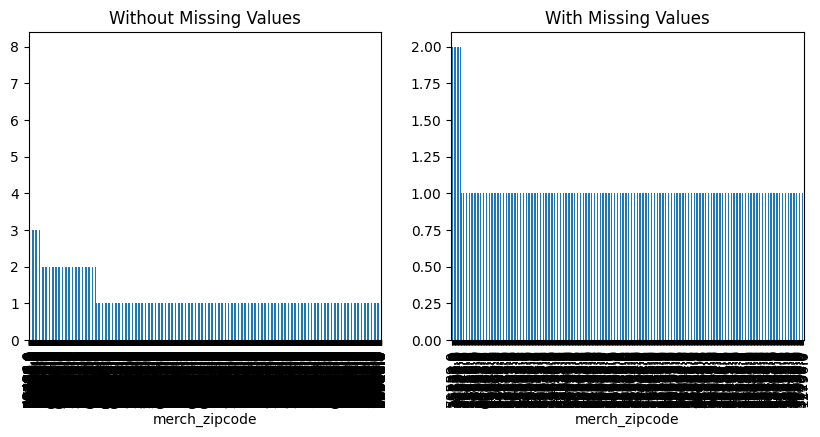

p-value of Chi-squared test: 0.7280552793458623
The missingness in 'merch_zipcode' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for month:


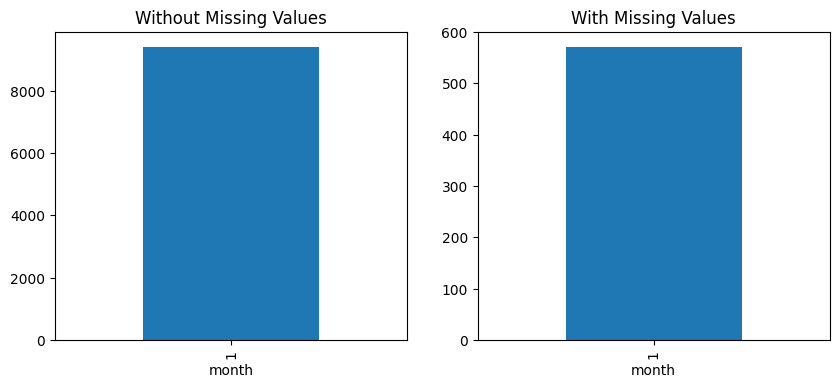

p-value of Chi-squared test: 1.0
The missingness in 'month' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for day:


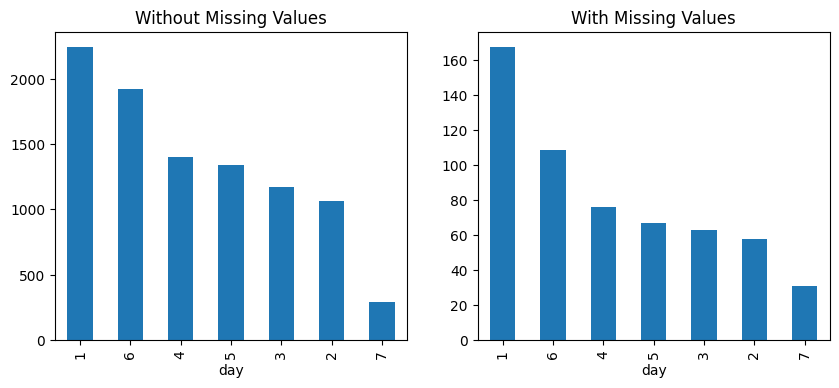

p-value of Chi-squared test: 0.001522379104565068
The missingness in 'day' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for hour:


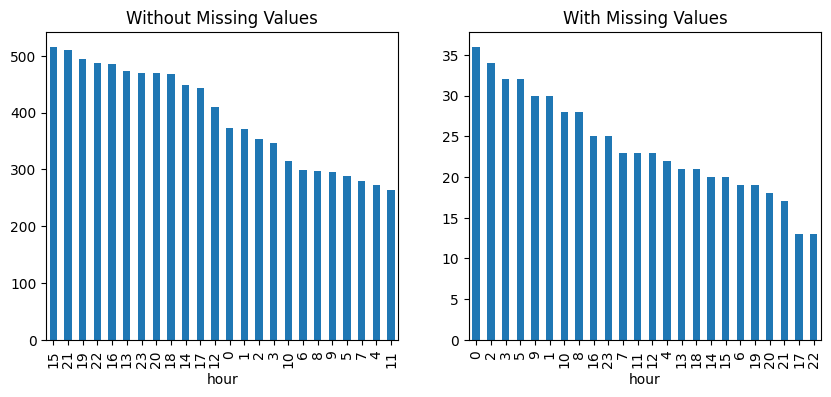

p-value of Chi-squared test: 8.289736457228202e-11
The missingness in 'hour' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 


In [ ]:
BM_MV = credit_card_df['merchant'].isna()
for att in numerical_fields:
    print('Diagnosis Analysis of Missing Values for {}:'.format(att))
    Diagnose_MV_Categorical(credit_card_df,att,BM_MV)
    print('- - - - - - - - - - - - divider - - - - - - - - - - - ')

Diagnosis Analysis of Missing Values for merchant:
No data for group: With Missing Values


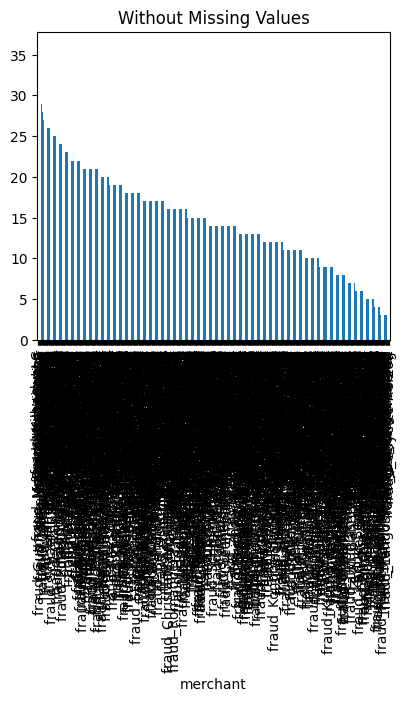

p-value of Chi-squared test: 1.0
The missingness in 'merchant' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for category:


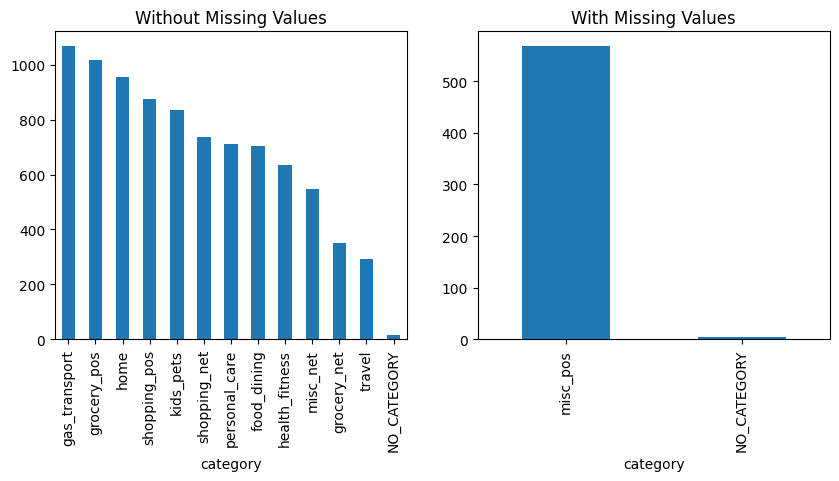

p-value of Chi-squared test: 0.0
The missingness in 'category' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for first:


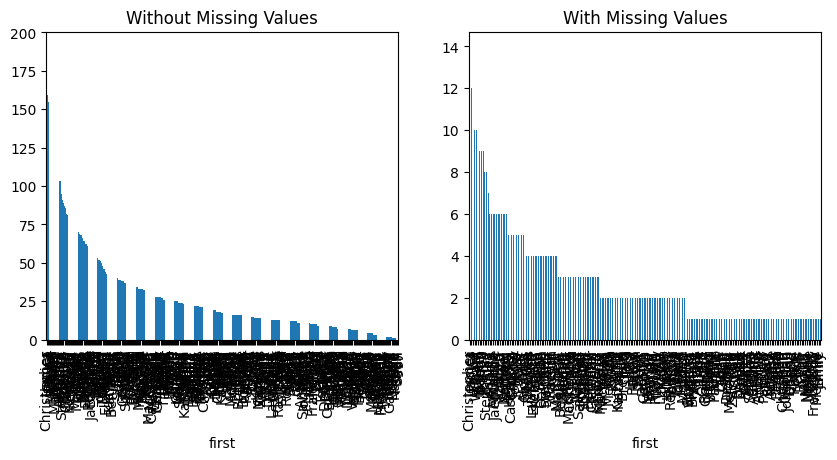

p-value of Chi-squared test: 0.2167160748310095
The missingness in 'first' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for last:


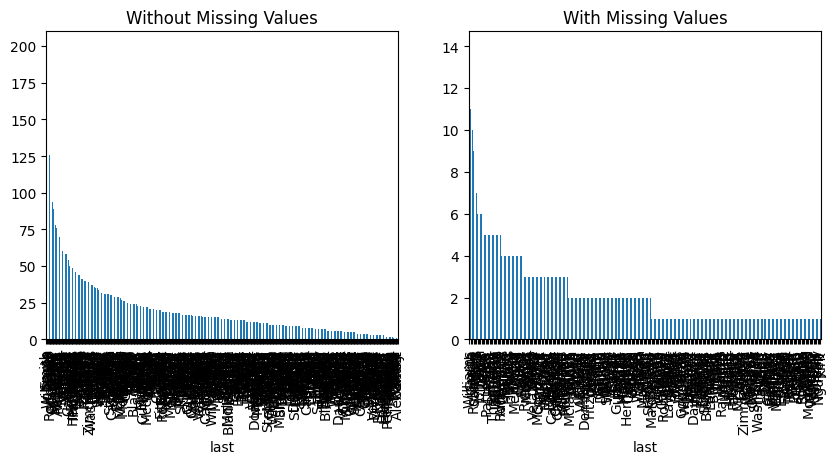

p-value of Chi-squared test: 0.24012873507138988
The missingness in 'last' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for gender:


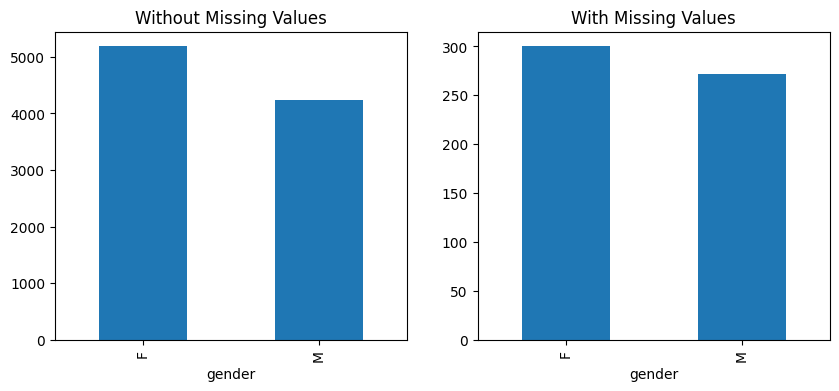

p-value of Chi-squared test: 0.2518563274369289
The missingness in 'gender' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for street:


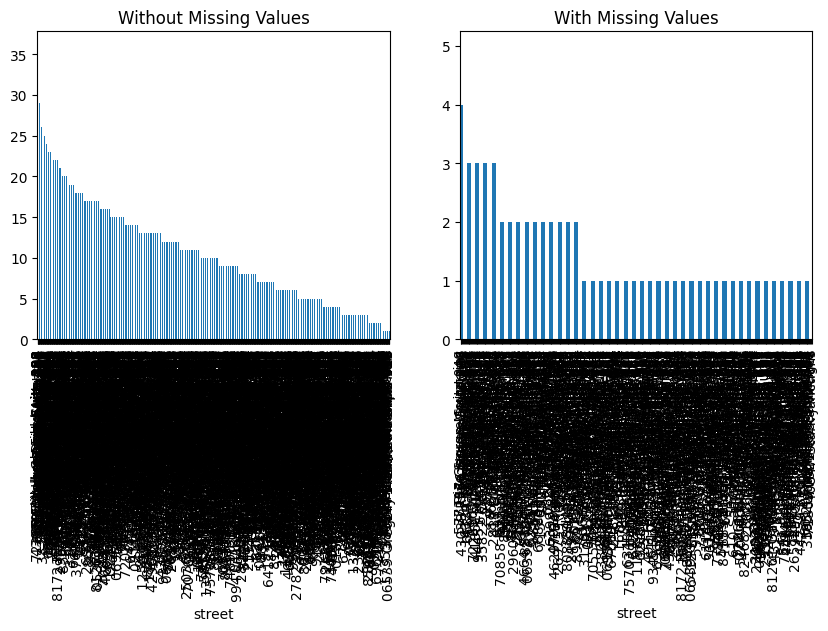

p-value of Chi-squared test: 0.43552985395484994
The missingness in 'street' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for city:


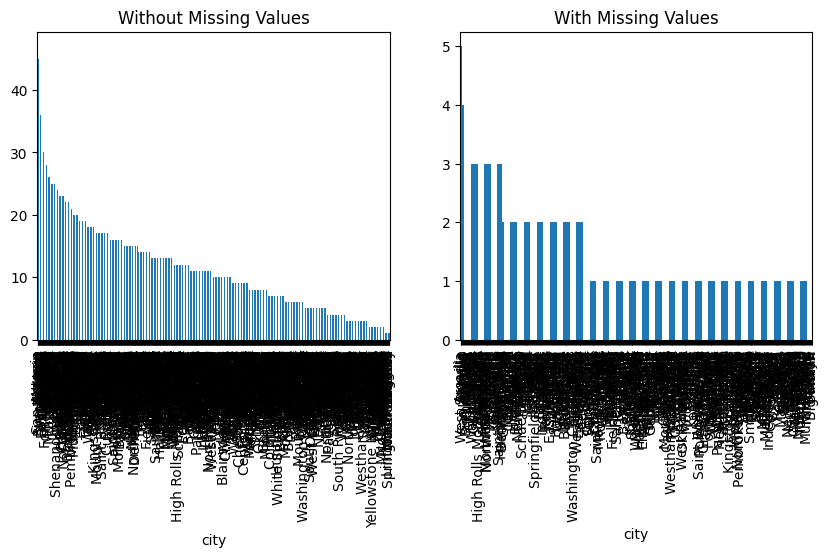

p-value of Chi-squared test: 0.4087488255111294
The missingness in 'city' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for state:


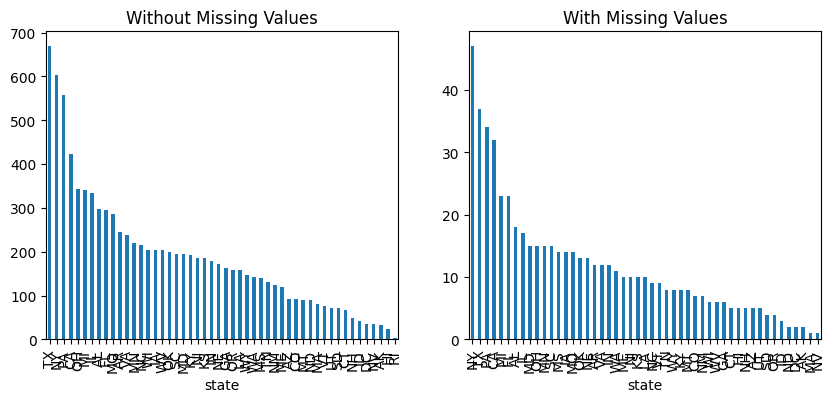

p-value of Chi-squared test: 0.40256034339396485
The missingness in 'state' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for job:


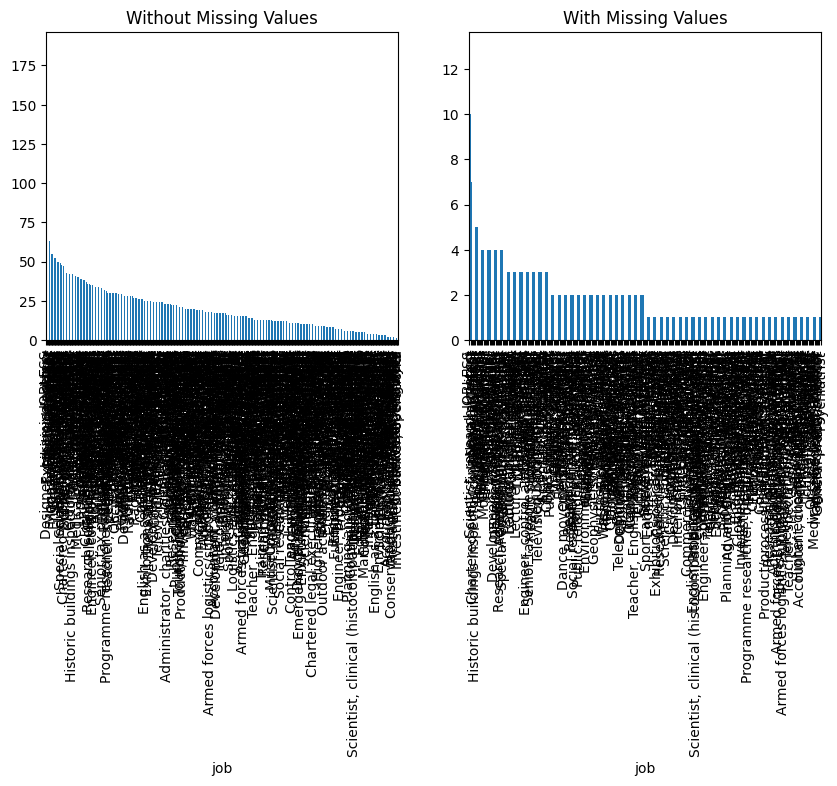

p-value of Chi-squared test: 0.1813212367831802
The missingness in 'job' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for dob:


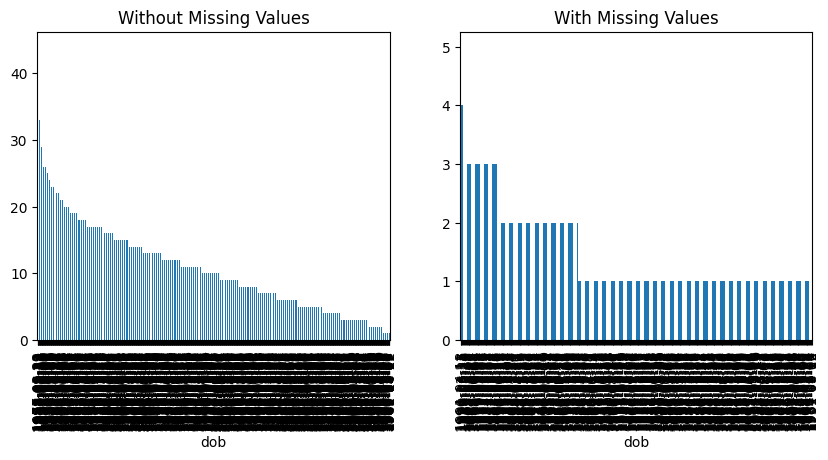

p-value of Chi-squared test: 0.3611684001068878
The missingness in 'dob' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for trans_num:
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for weekday:


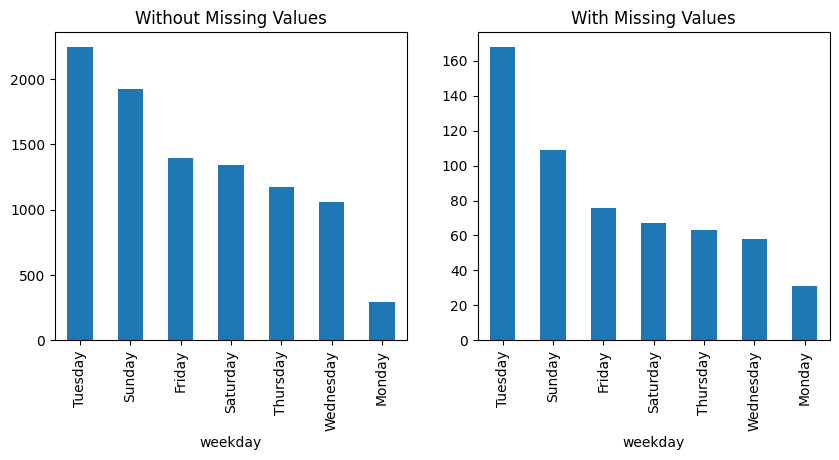

p-value of Chi-squared test: 0.001522379104565068
The missingness in 'weekday' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 


In [ ]:
BM_MV = credit_card_df['merchant'].isna()
for att in categorical_fields:
    print('Diagnosis Analysis of Missing Values for {}:'.format(att))
    Diagnose_MV_Categorical(credit_card_df,att,BM_MV)
    print('- - - - - - - - - - - - divider - - - - - - - - - - - ')

The missing values in the merchant column are of the MAR (Missing At Random) type, as they occur specifically for transactions categorized as misc_pos. This indicates a systematic relationship between the missing merchant values and the category attribute, suggesting that the missing data is not random but linked to transactions classified under this particular category.

#### Missing Anlysis for Category

Diagnosis Analysis of Missing Values for cc_num:


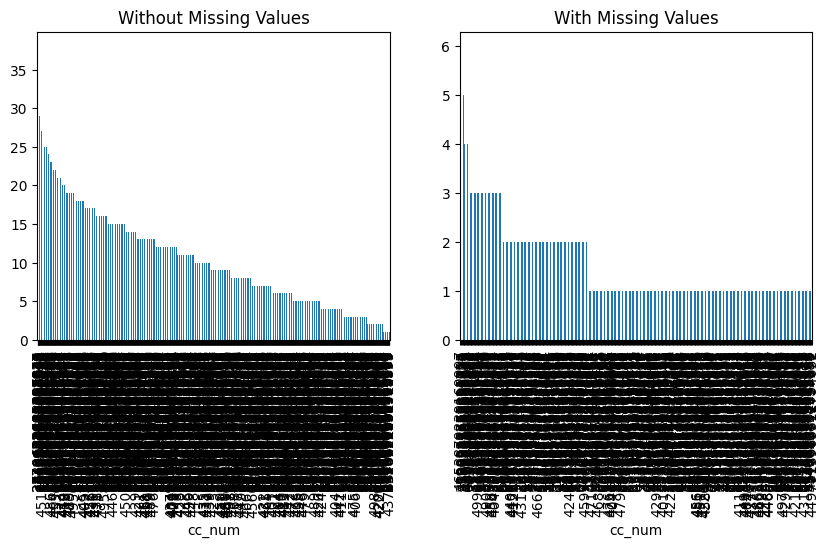

p-value of Chi-squared test: 0.12493015303295593
The missingness in 'cc_num' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for amt:


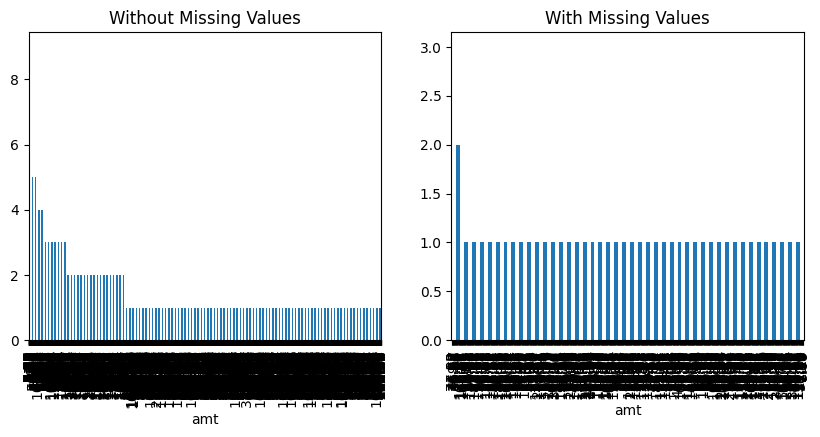

p-value of Chi-squared test: 0.003057558508051745
The missingness in 'amt' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for zip:


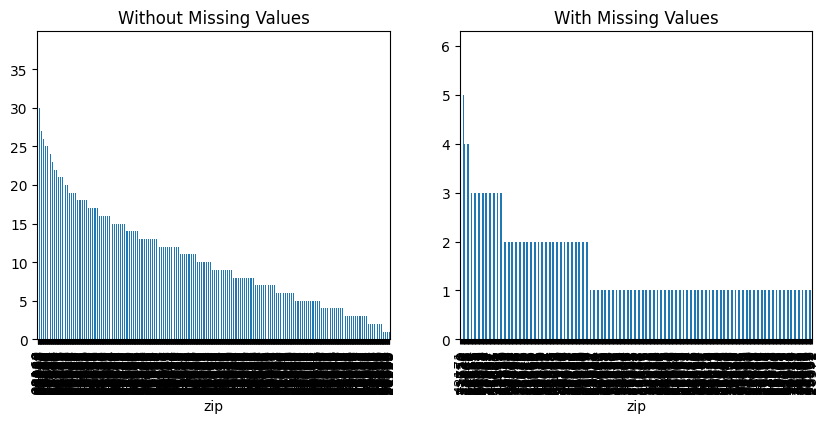

p-value of Chi-squared test: 0.11590440720881298
The missingness in 'zip' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for lat:


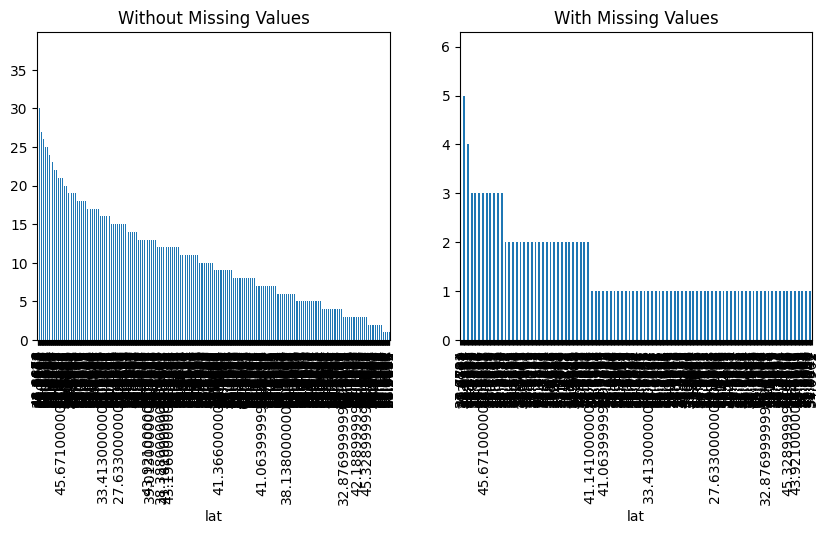

p-value of Chi-squared test: 0.11116553389244502
The missingness in 'lat' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for long:


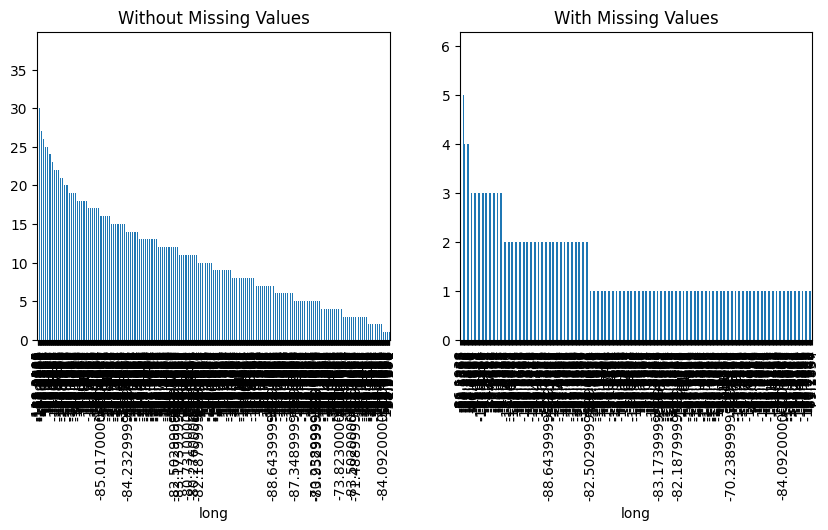

p-value of Chi-squared test: 0.11438729279482357
The missingness in 'long' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for city_pop:


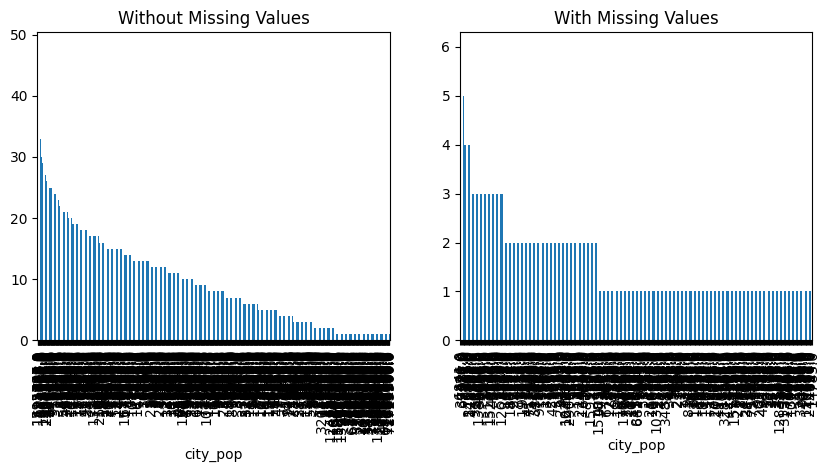

p-value of Chi-squared test: 0.00627390753526572
The missingness in 'city_pop' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for unix_time:


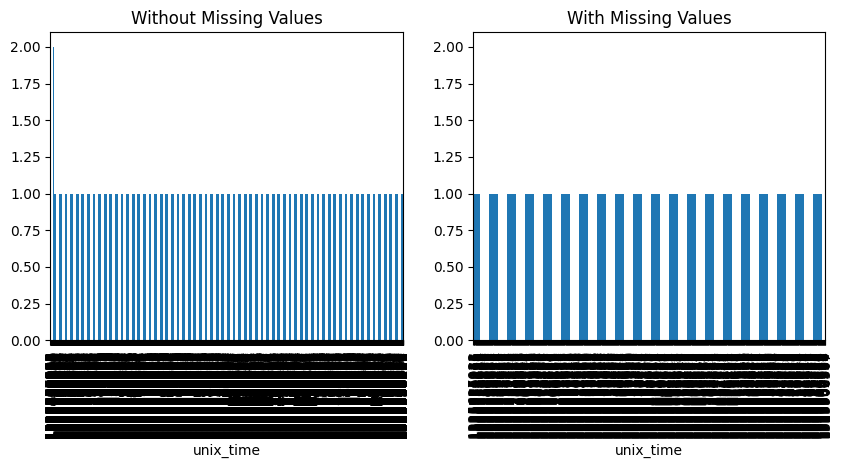

p-value of Chi-squared test: 0.47124041589802373
The missingness in 'unix_time' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for merch_lat:


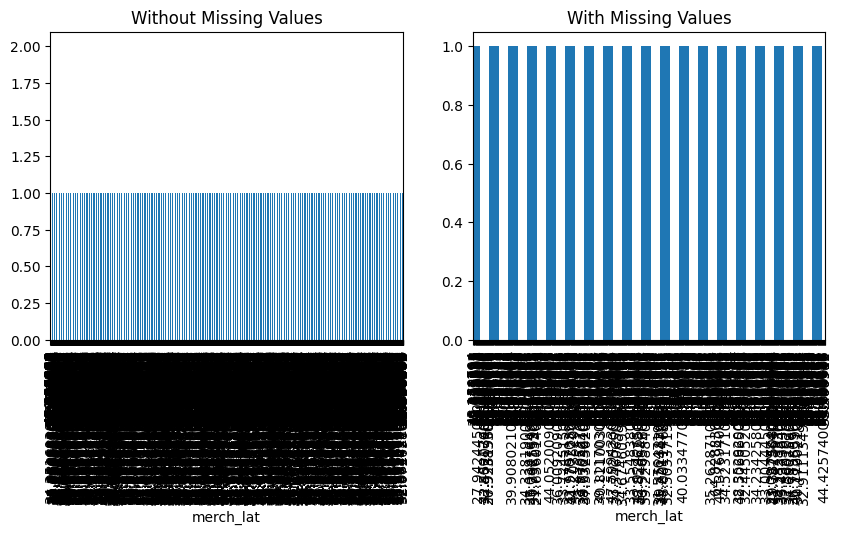

p-value of Chi-squared test: 0.48683689071721037
The missingness in 'merch_lat' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for merch_long:


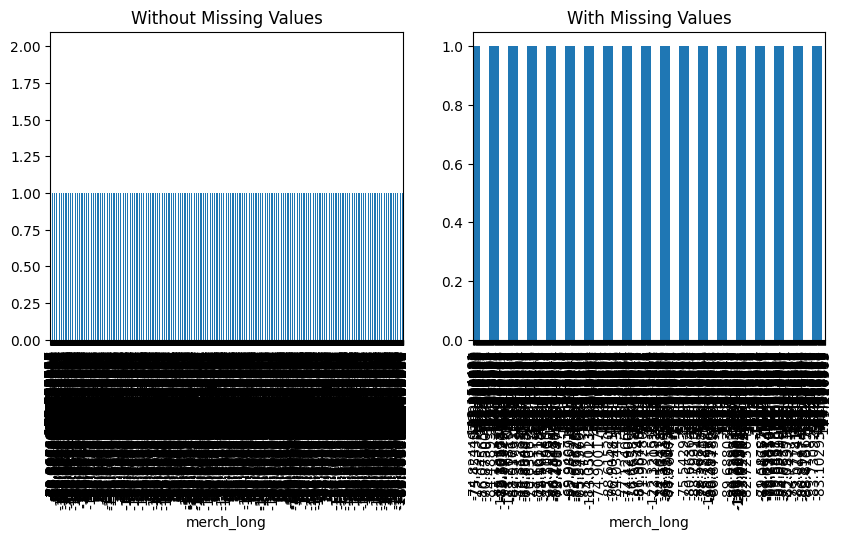

p-value of Chi-squared test: 0.4924775641615186
The missingness in 'merch_long' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for is_fraud:


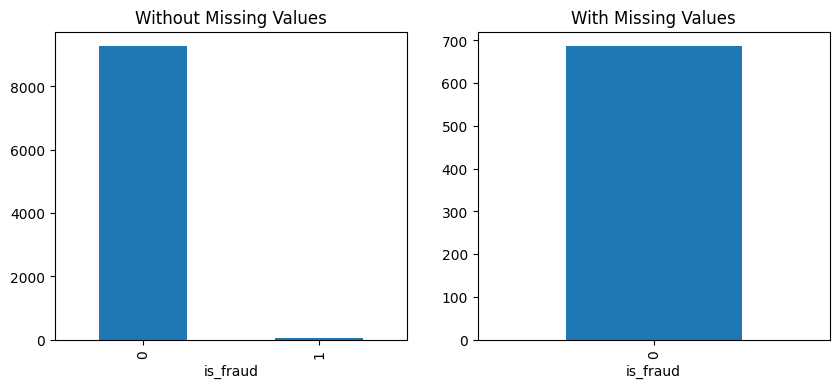

p-value of Chi-squared test: 0.11508713762214962
The missingness in 'is_fraud' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for merch_zipcode:


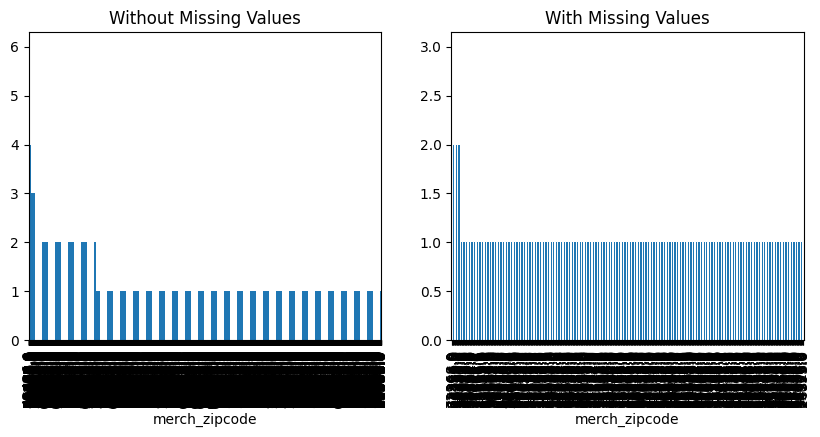

p-value of Chi-squared test: 0.24752384512958264
The missingness in 'merch_zipcode' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for month:


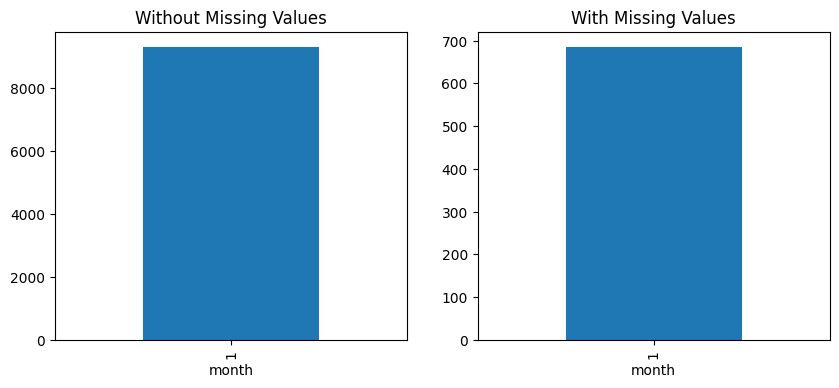

p-value of Chi-squared test: 1.0
The missingness in 'month' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for day:


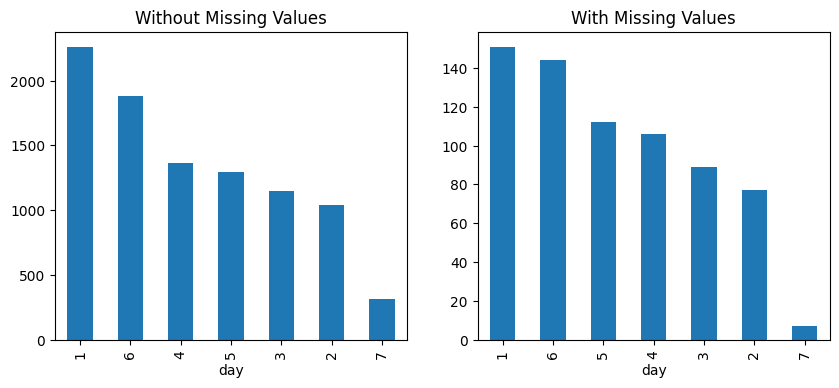

p-value of Chi-squared test: 0.01614127847653508
The missingness in 'day' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for hour:


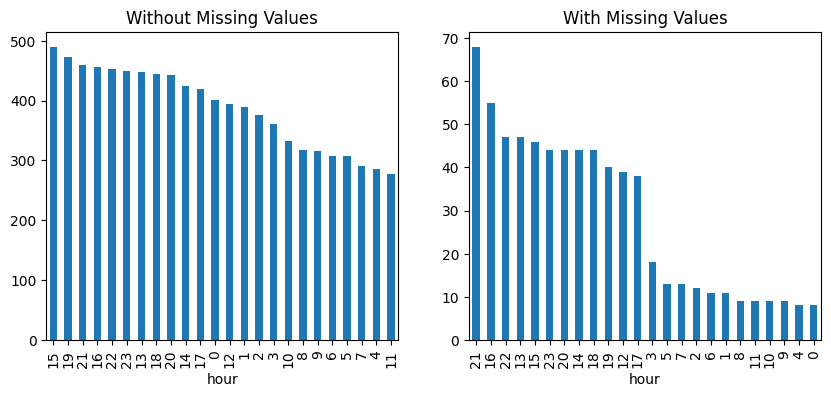

p-value of Chi-squared test: 9.68982636587047e-24
The missingness in 'hour' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 


In [ ]:
BM_MV = credit_card_df['category'].isna()
for att in numerical_fields:
    print('Diagnosis Analysis of Missing Values for {}:'.format(att))
    Diagnose_MV_Categorical(credit_card_df,att,BM_MV)
    print('- - - - - - - - - - - - divider - - - - - - - - - - - ')

Diagnosis Analysis of Missing Values for merchant:


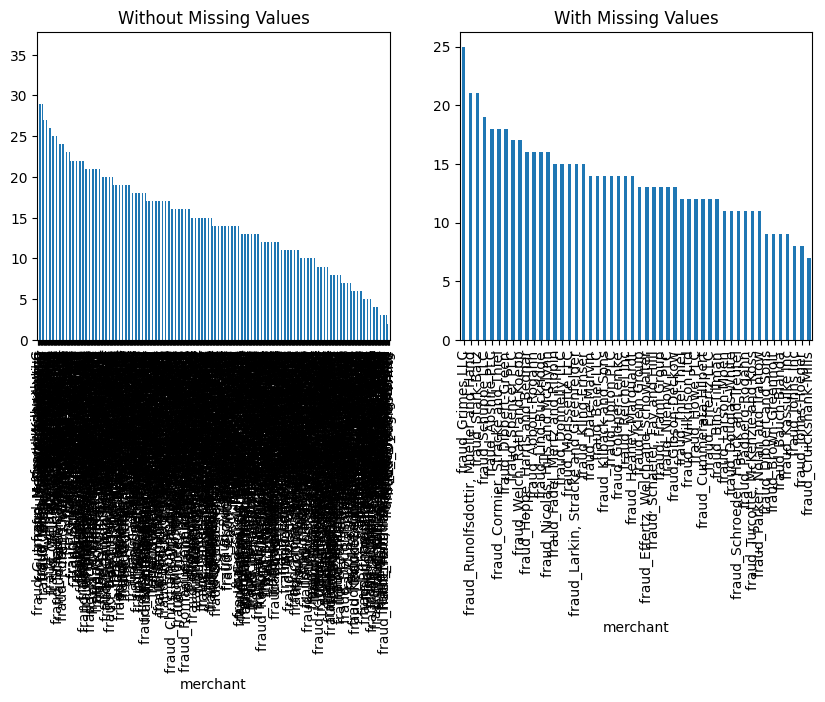

p-value of Chi-squared test: 0.0
The missingness in 'merchant' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for category:
No data for group: With Missing Values


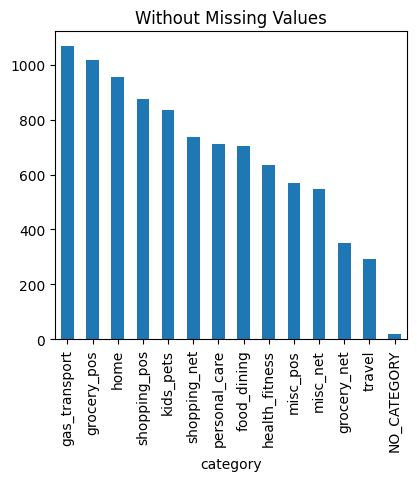

p-value of Chi-squared test: 1.0
The missingness in 'category' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for first:


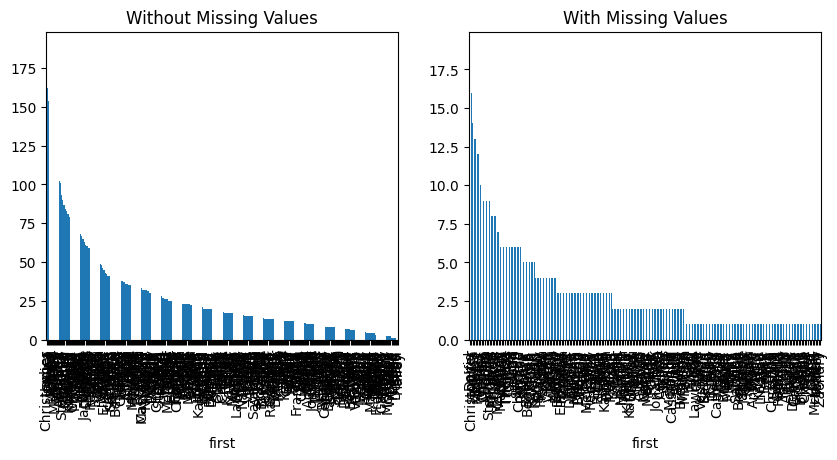

p-value of Chi-squared test: 0.6188877199565457
The missingness in 'first' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for last:


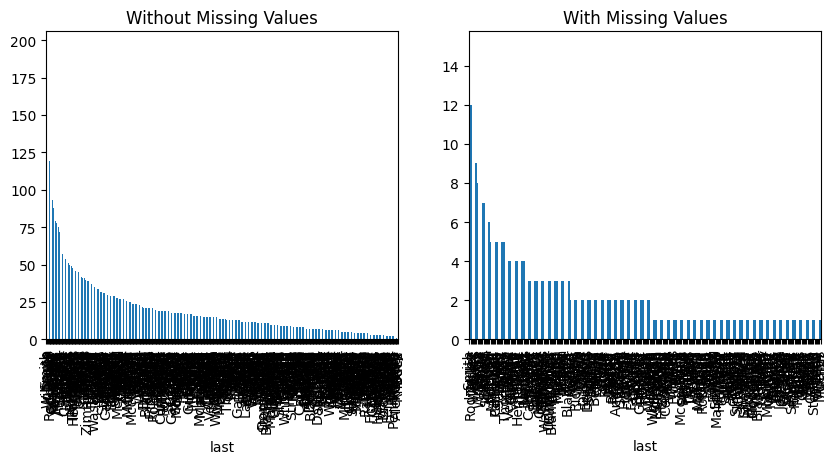

p-value of Chi-squared test: 0.16577405004793666
The missingness in 'last' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for gender:


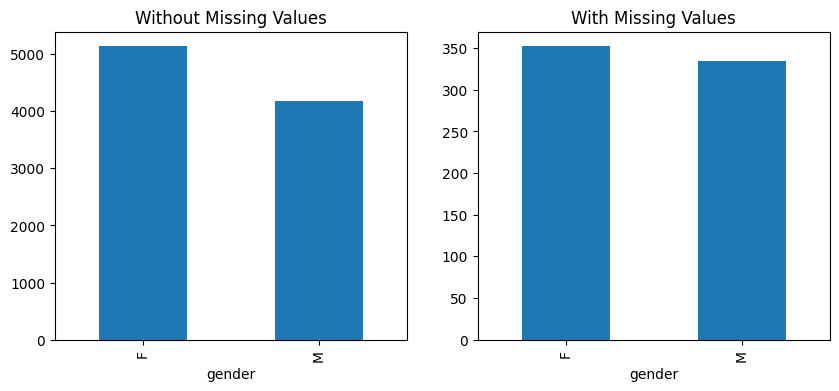

p-value of Chi-squared test: 0.058793889618349734
The missingness in 'gender' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for street:


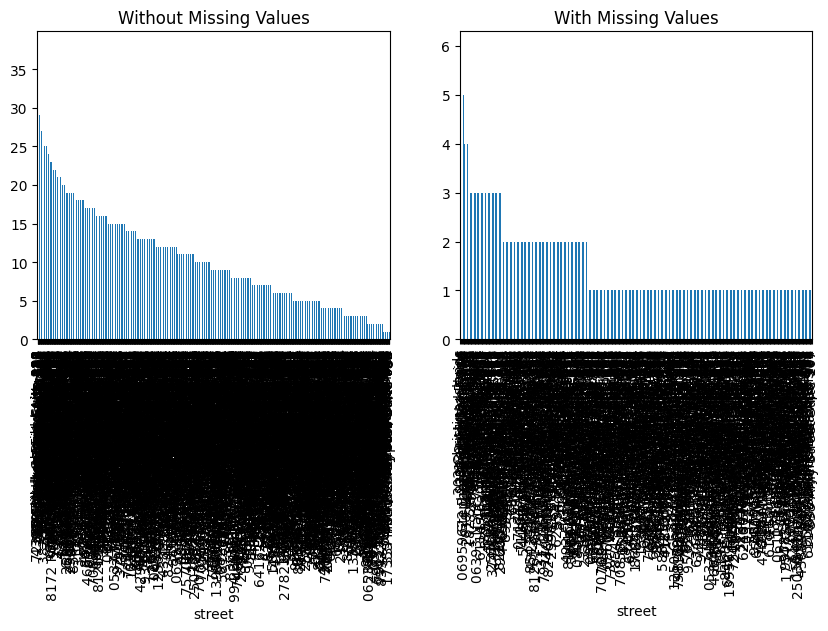

p-value of Chi-squared test: 0.12493015303295543
The missingness in 'street' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for city:


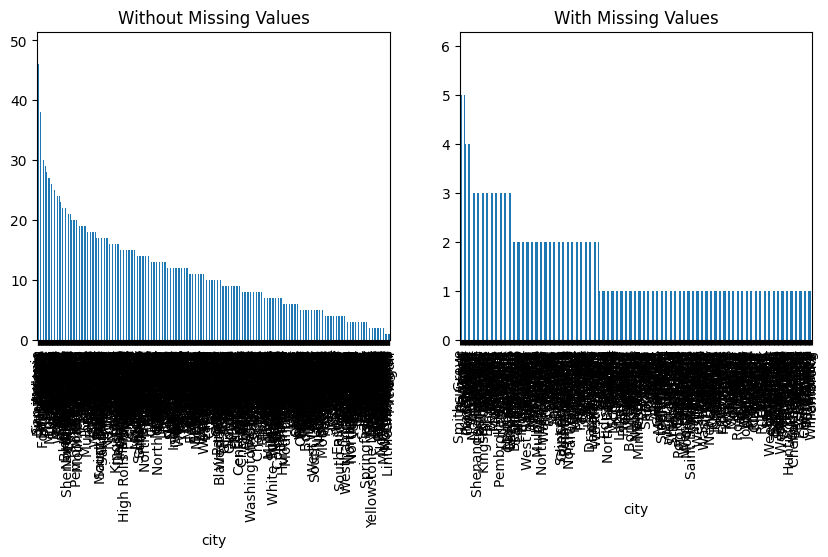

p-value of Chi-squared test: 0.10027393466019653
The missingness in 'city' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for state:


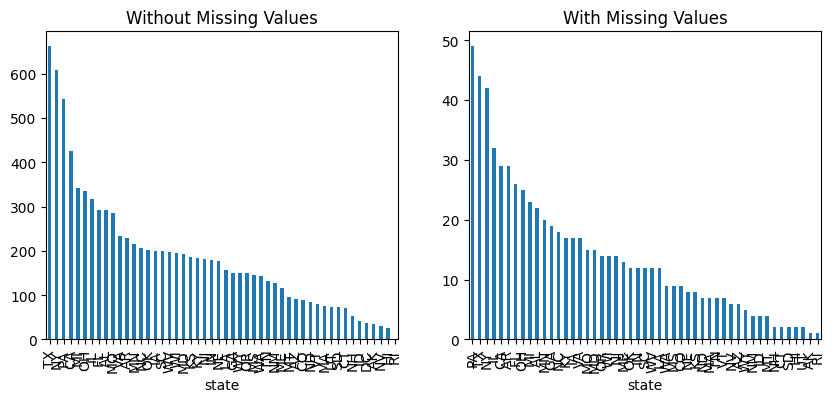

p-value of Chi-squared test: 0.10598798878485985
The missingness in 'state' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for job:


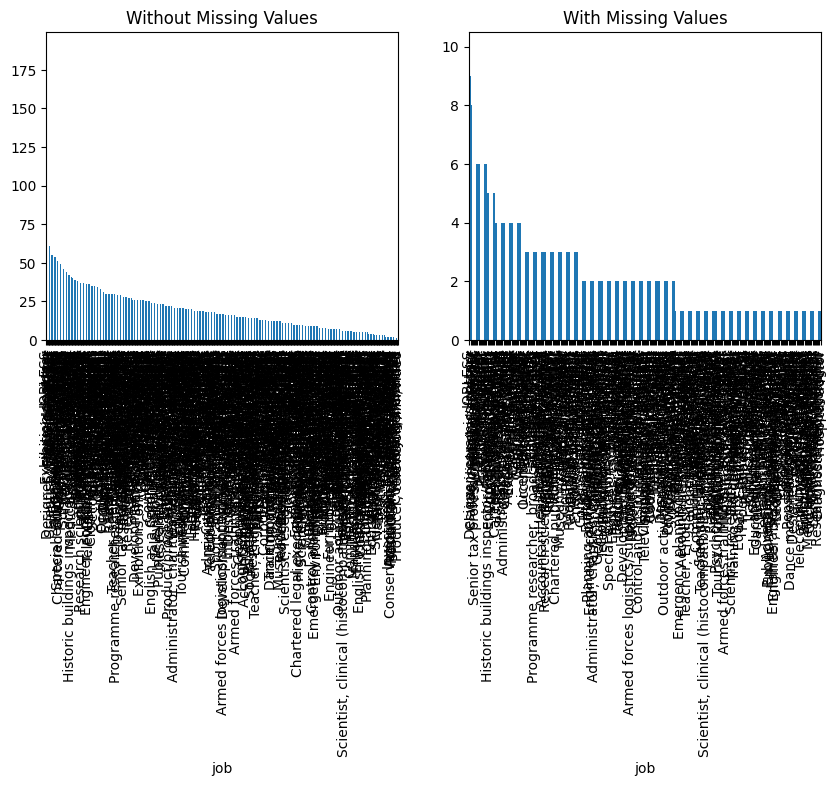

p-value of Chi-squared test: 0.01642509867407276
The missingness in 'job' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for dob:


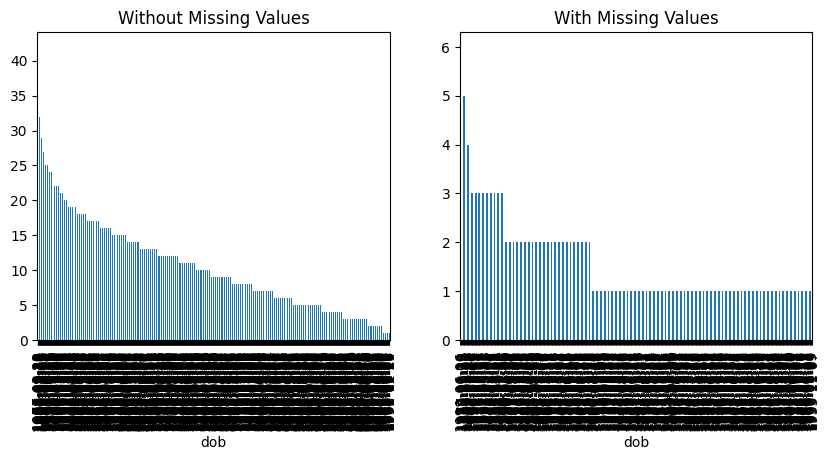

p-value of Chi-squared test: 0.1090684152358218
The missingness in 'dob' appears to be **completely at random** (p >= 0.05).
No significant relationship was detected between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for trans_num:
- - - - - - - - - - - - divider - - - - - - - - - - - 
Diagnosis Analysis of Missing Values for weekday:


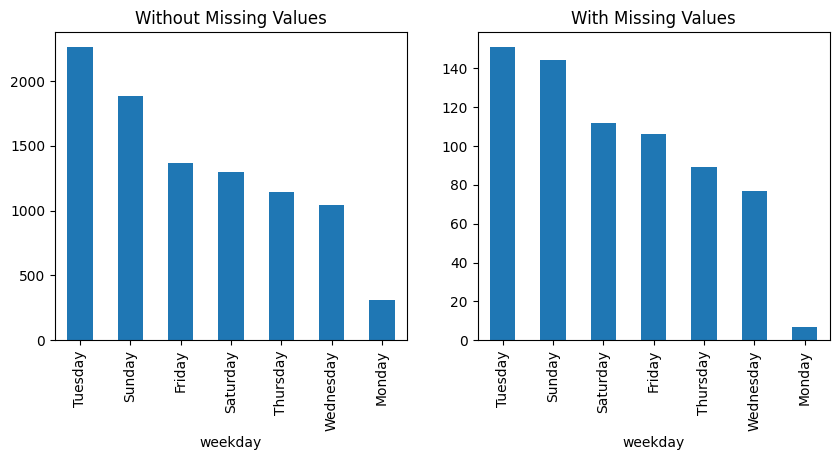

p-value of Chi-squared test: 0.01614127847653508
The missingness in 'weekday' is likely **not completely at random** (p < 0.05).
This suggests a significant relationship between missingness and the attribute values.
- - - - - - - - - - - - divider - - - - - - - - - - - 


In [ ]:
BM_MV = credit_card_df['category'].isna()
for att in categorical_fields:
    print('Diagnosis Analysis of Missing Values for {}:'.format(att))
    Diagnose_MV_Categorical(credit_card_df,att,BM_MV)
    print('- - - - - - - - - - - - divider - - - - - - - - - - - ')

The missing values in the category column appear to be of the MCAR (Missing Completely At Random) type, as their occurrence does not show any discernible relationship or dependency on other attributes in the dataset. This suggests that the missing values are entirely random and unrelated to other factors, such as time, merchant, or transaction amount.

Correlation matrix for numerical columns:


<Axes: >

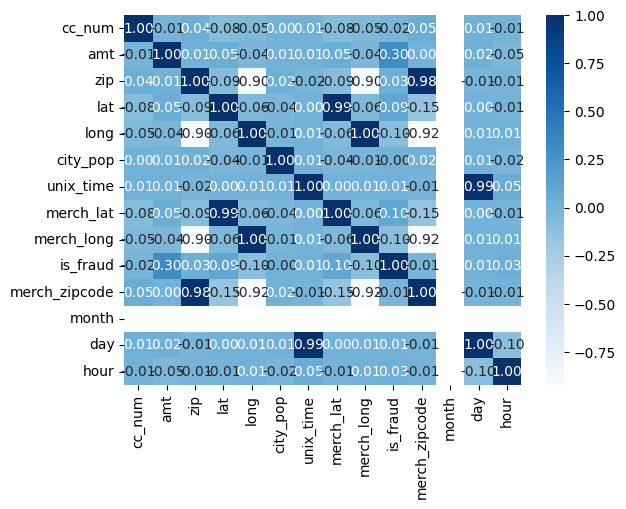

In [ ]:
print("Correlation matrix for numerical columns:")
correlation_matrix = credit_card_df[numerical_fields].corr()
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='Blues')

In [ ]:
threshold = 0.7
unique_pairs = set()  # Set to store unique column pairs
for i in range(len(correlation_matrix.columns)):
    for j in range(len(correlation_matrix.columns)):
        column_name_1 = correlation_matrix.columns[i]
        column_name_2 = correlation_matrix.columns[j]
        correlation_value = correlation_matrix.iloc[i, j]
        # Ensure it's not the same column and correlation exceeds the threshold
        if abs(correlation_value) > threshold and column_name_1 != column_name_2:
            # Use sorted tuple to ensure uniqueness of pairs
            pair = tuple(sorted([column_name_1, column_name_2]))
            if pair not in unique_pairs:  # Add only if the pair is not already in the set
                unique_pairs.add(pair)
                print(f"Correlation between {pair[0]} and {pair[1]}: {correlation_value}")
# Optionally, convert the set to a list or DataFrame if needed
unique_pairs_list = list(unique_pairs)

Correlation between long and zip: -0.9000144126848112
Correlation between merch_long and zip: -0.8993399998875251
Correlation between merch_zipcode and zip: 0.9809632404405952
Correlation between lat and merch_lat: 0.993841203463952
Correlation between long and merch_long: 0.9992027564897872
Correlation between long and merch_zipcode: -0.9200711946880511
Correlation between day and unix_time: 0.9887539337489989
Correlation between merch_long and merch_zipcode: -0.9212463411128824


In [ ]:
cramers_v_matrix = pd.DataFrame(index=categorical_fields, columns=categorical_fields)
MAX_UNIQUE_VALUES = 10000
for col1 in categorical_fields:
    for col2 in categorical_fields:
        if col1 == col2:
            # Cramér's V for the same column is always 1
            cramers_v_matrix.loc[col1, col2] = 1.0
        else:
            # Check unique value counts to prevent large contingency tables
            if (
                credit_card_df[col1].nunique() <= MAX_UNIQUE_VALUES and
                credit_card_df[col2].nunique() <= MAX_UNIQUE_VALUES
            ):
                # Create contingency table and calculate Cramér's V
                contingency_table = pd.crosstab(credit_card_df[col1], credit_card_df[col2])
                cramers_v_matrix.loc[col1, col2] = association(contingency_table, method="cramer")
            else:
                # If columns have too many unique values, set to NaN or another placeholder
                cramers_v_matrix.loc[col1, col2] = None
# Convert to numeric for better handling
cramers_v_matrix

,merchant,category,first,last,gender,street,city,state,job,dob,trans_num,weekday
merchant,1.0,0.961743,0.261511,0.263742,0.272952,0.309793,0.29748,0.262052,0.26083,0.307364,1.0,0.268427
category,0.961743,1.0,0.195303,0.236586,0.047631,0.322504,0.31069,0.07559,0.23073,0.320092,1.0,0.077265
first,0.261511,0.195303,1.0,0.723075,1.0,1.0,0.968964,0.64187,0.740217,0.992322,1.0,0.184911
last,0.263742,0.236586,0.723075,1.0,0.743296,1.0,0.963848,0.739025,0.719521,0.991209,1.0,0.217098
gender,0.272952,0.047631,1.0,0.743296,1.0,1.0,0.96247,0.278379,0.757637,0.993304,1.0,0.03034
street,0.309793,0.322504,1.0,1.0,1.0,1.0,1.0,1.0,0.988873,1.0,1.0,0.300625
city,0.29748,0.31069,0.968964,0.963848,0.96247,1.0,1.0,0.984153,0.952969,0.992059,1.0,0.287523
state,0.262052,0.07559,0.64187,0.739025,0.278379,1.0,0.984153,1.0,0.753572,0.993556,1.0,0.070231
job,0.26083,0.23073,0.740217,0.719521,0.757637,0.988873,0.952969,0.753572,1.0,0.979747,1.0,0.218946
dob,0.307364,0.320092,0.992322,0.991209,0.993304,1.0,0.992059,0.993556,0.979747,1.0,1.0,0.297735


In [ ]:
threshold = 0.7
unique_pairs = set()  # Set to store unique column pairs
# Loop through each pair of columns in the matrix
for i in range(len(cramers_v_matrix.columns)):
    for j in range(i + 1, len(cramers_v_matrix.columns)):  # Avoid duplicates and self-comparison
        column_1 = cramers_v_matrix.columns[i]
        column_2 = cramers_v_matrix.columns[j]
        correlation_value = cramers_v_matrix.iloc[i, j]
        # Skip if correlation_value is None or NaN
        if correlation_value is None or pd.isna(correlation_value):
            continue
        # Check if correlation exceeds the threshold
        if correlation_value > threshold:
            # Use sorted tuple to ensure uniqueness of pairs
            pair = tuple(sorted([column_1, column_2]))
            if pair not in unique_pairs:  # Add only if the pair is not already in the set
                unique_pairs.add(pair)
                print(f"Correlation between {pair[0]} and {pair[1]}: {correlation_value}")
# Optionally, convert the set to a list or DataFrame if needed
unique_pairs_list = list(unique_pairs)

Correlation between category and merchant: 0.9617431296161042
Correlation between merchant and trans_num: 1.0000000000000002
Correlation between category and trans_num: 0.9999999999999999
Correlation between first and last: 0.7230753740049419
Correlation between first and gender: 1.0
Correlation between first and street: 0.9999999999999999
Correlation between city and first: 0.968964456371266
Correlation between first and job: 0.7402169574376581
Correlation between dob and first: 0.9923223969570343
Correlation between first and trans_num: 1.0
Correlation between gender and last: 0.7432957738455712
Correlation between last and street: 0.9999999999999998
Correlation between city and last: 0.9638483246623428
Correlation between last and state: 0.7390254265616502
Correlation between job and last: 0.7195213073867845
Correlation between dob and last: 0.9912090710775977
Correlation between last and trans_num: 1.0
Correlation between gender and street: 1.0
Correlation between city and gender: 

We can consider droping following values:
* merch_zip
* unix_time
* trans_num
* first
* last

## Outliers

In [ ]:
def numerical_outliers(df, col):
    if df[col].dropna().empty:
        print(f"No data in column {col}")
        return pd.DataFrame()
    fig = plt.boxplot(df[col].dropna(), vert=False)
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    BM = (df[col] > (Q3 + 1.5 * IQR)) | (df[col] < (Q1 - 1.5 * IQR))
    plt.show()
    return df[BM]

Outliers for cc_num


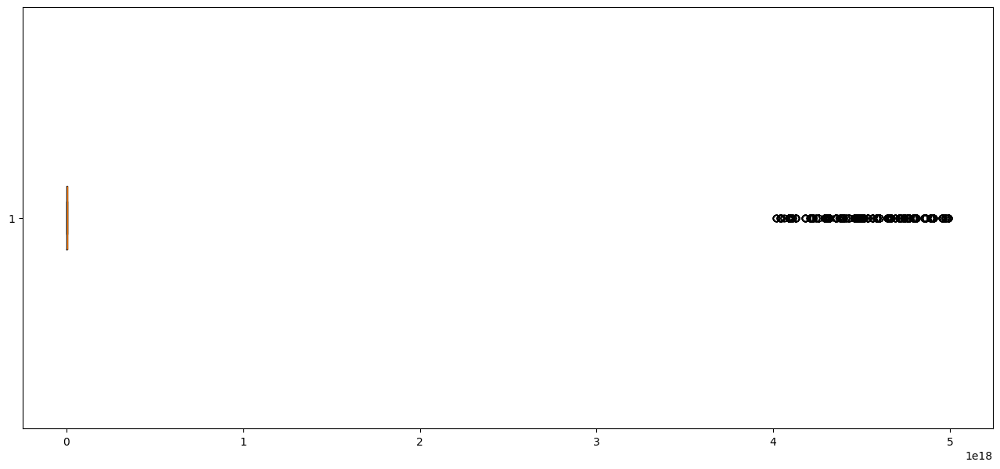

931
Outliers for amt


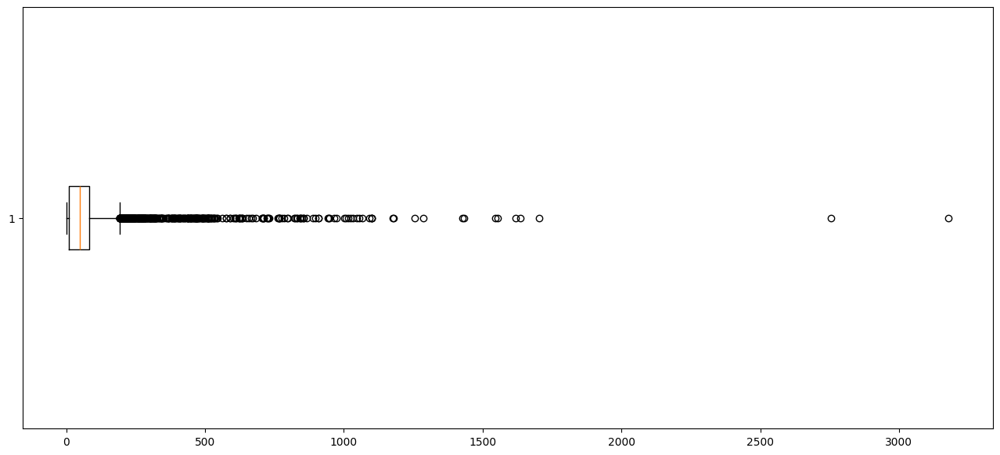

489
Outliers for zip


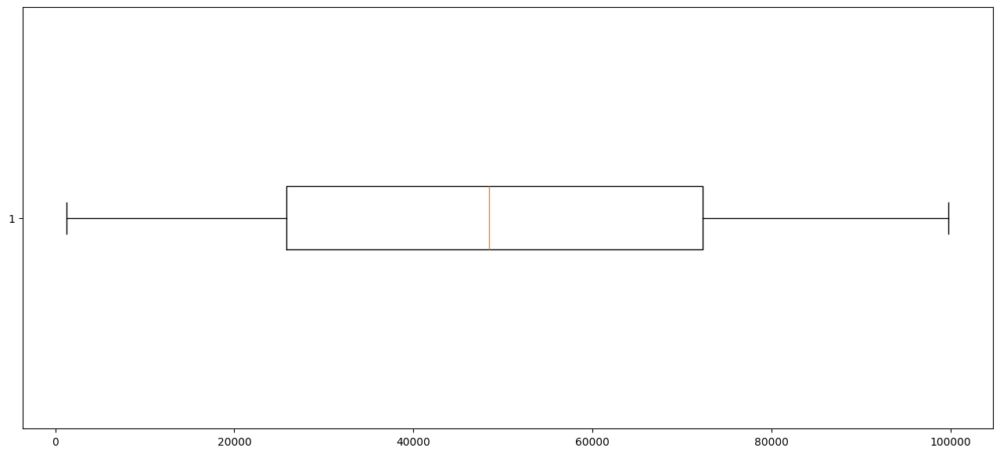

0
Outliers for lat


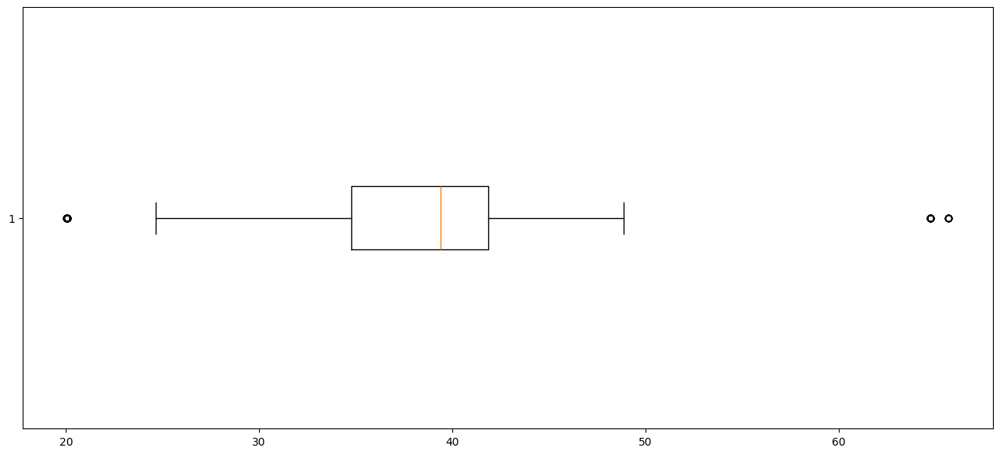

65
Outliers for long


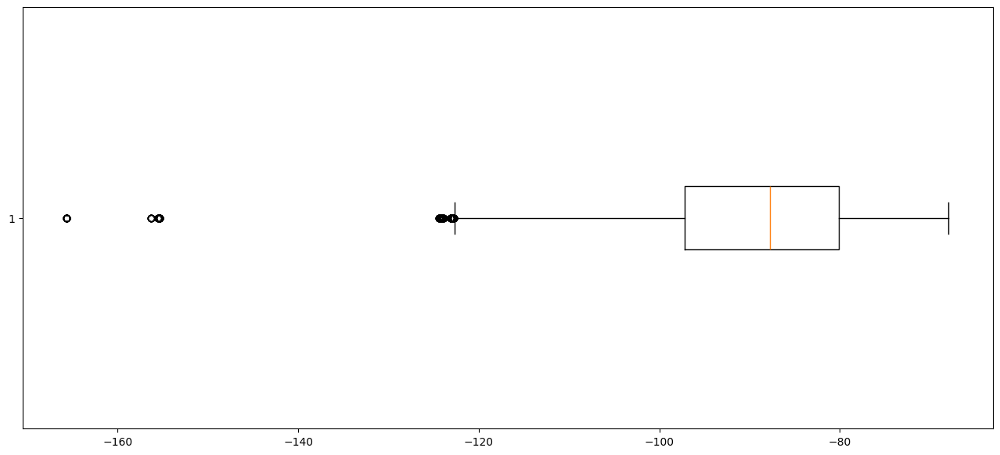

242
Outliers for city_pop


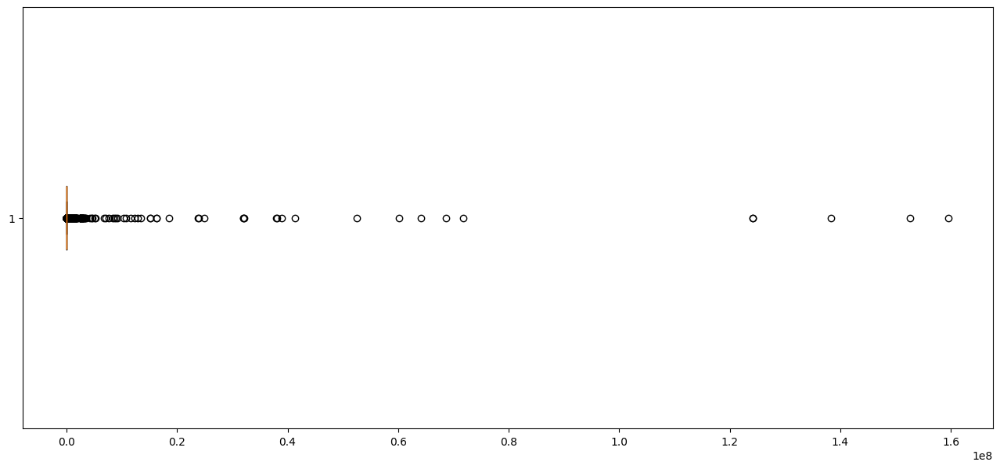

1901
Outliers for unix_time


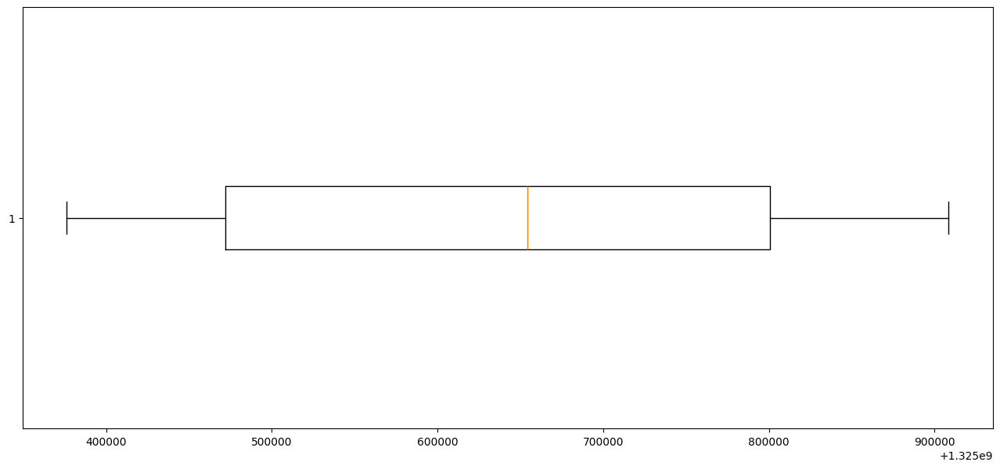

0
Outliers for merch_lat


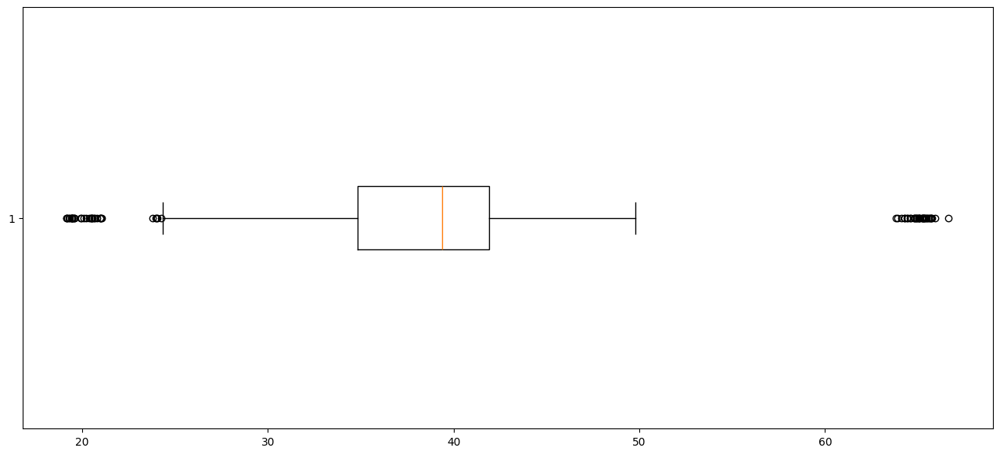

70
Outliers for merch_long


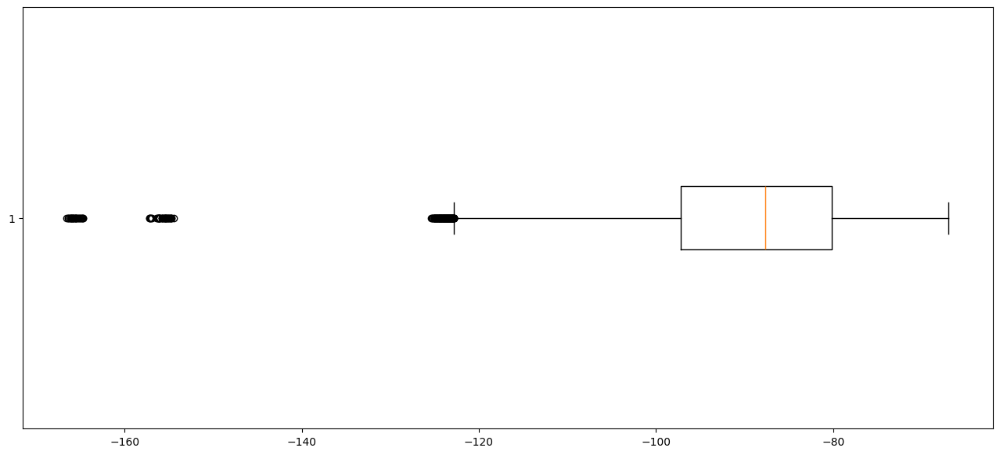

249
Outliers for is_fraud


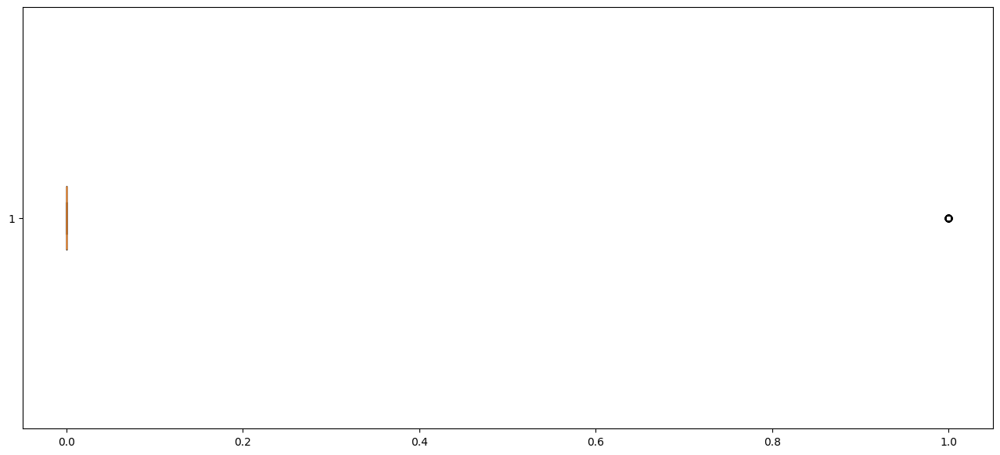

47
Outliers for merch_zipcode


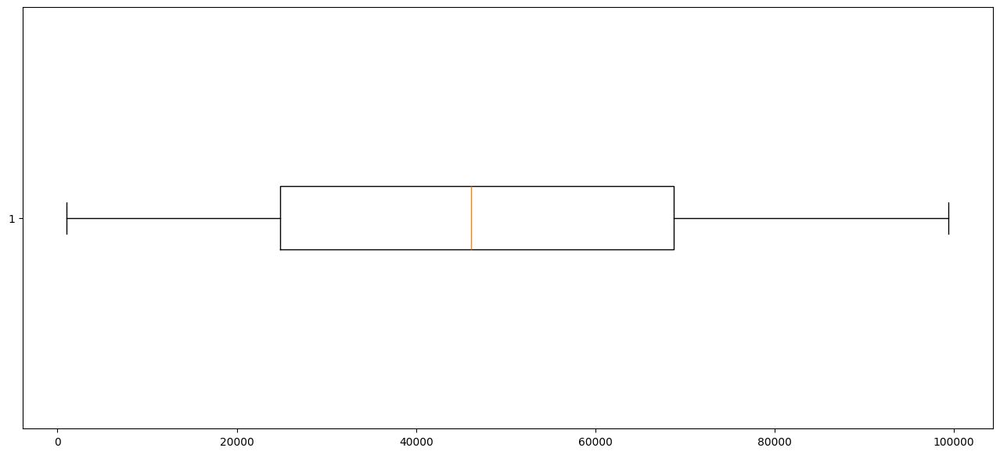

0
Outliers for month


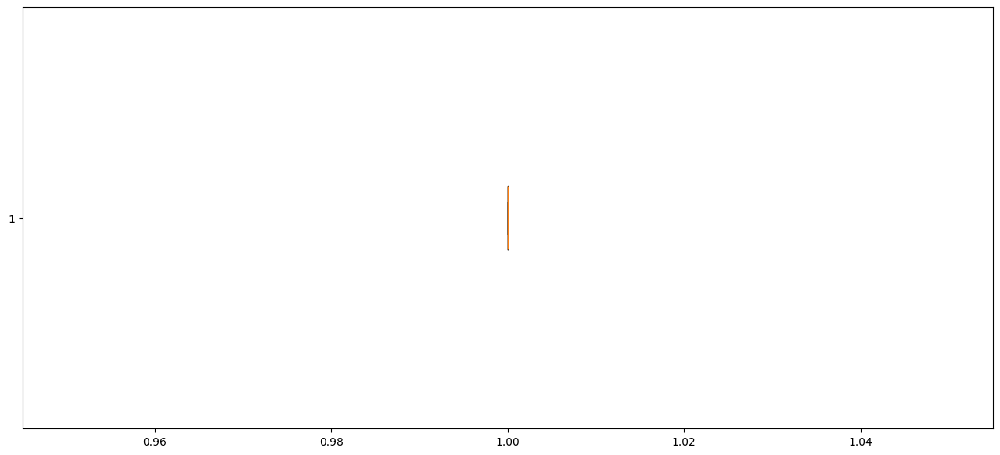

0
Outliers for day


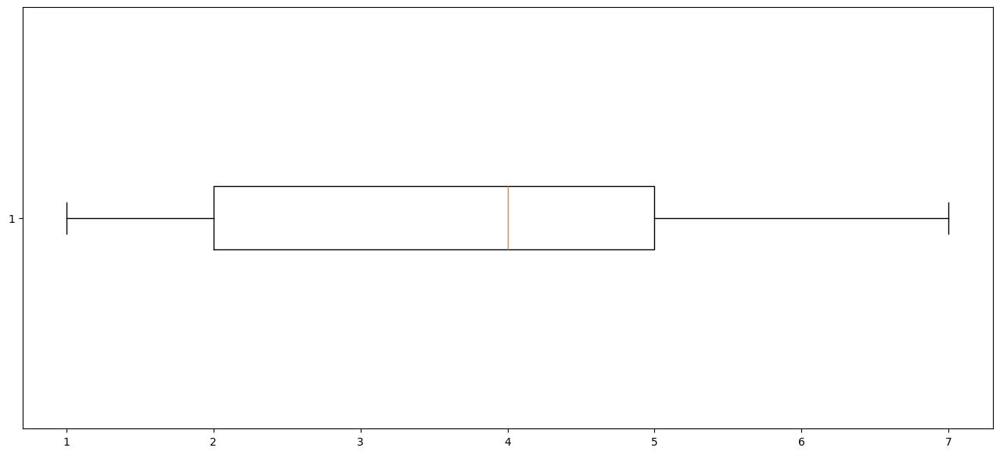

0
Outliers for hour


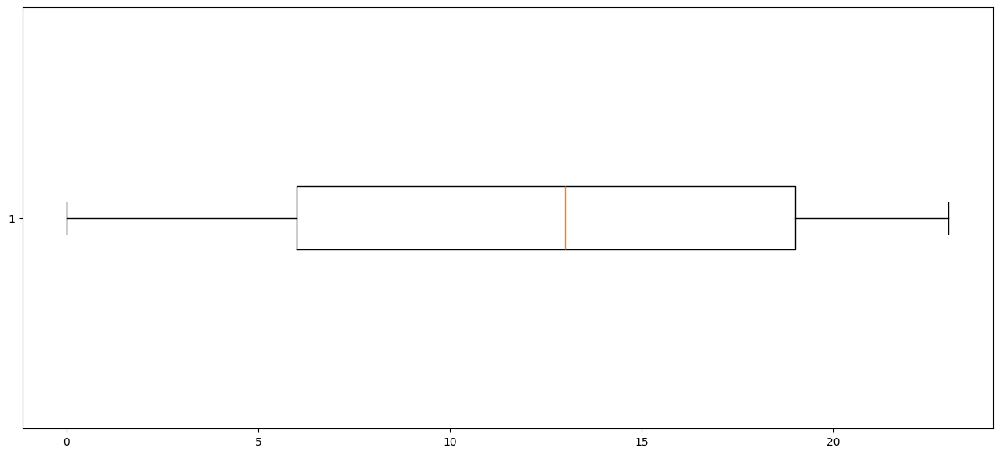

0


In [ ]:
outlier_total_list = []
for col in numerical_fields:
  print(f"Outliers for {col}")
  plt.figure(figsize=(16, 7))
  outlier_list = numerical_outliers(credit_card_df,col)
  outlier_total_list.append(outlier_list)
  print(len(outlier_list))

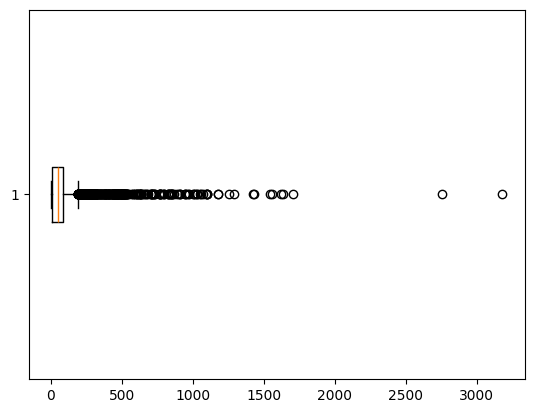

In [ ]:
fig = plt.boxplot(credit_card_df['amt'].dropna(), vert=False,)

In [ ]:
def categorical_outliers(df, col):
    print(df[col].value_counts())
    plt.figure(figsize=(16, 7))
    df[col].value_counts().plot.bar()
    plt.show()

Outliers for merchant
merchant
fraud_Kilback LLC                      36
fraud_McDermott-Weimann                33
fraud_Mraz-Herzog                      31
fraud_Hudson-Ratke                     29
fraud_Cormier LLC                      29
                                       ..
fraud_Langosh, Wintheiser and Hyatt     3
fraud_Bahringer-Larson                  3
fraud_Kessler Group                     3
fraud_Reichert-Weissnat                 2
fraud_Goyette-Herzog                    2
Name: count, Length: 646, dtype: int64


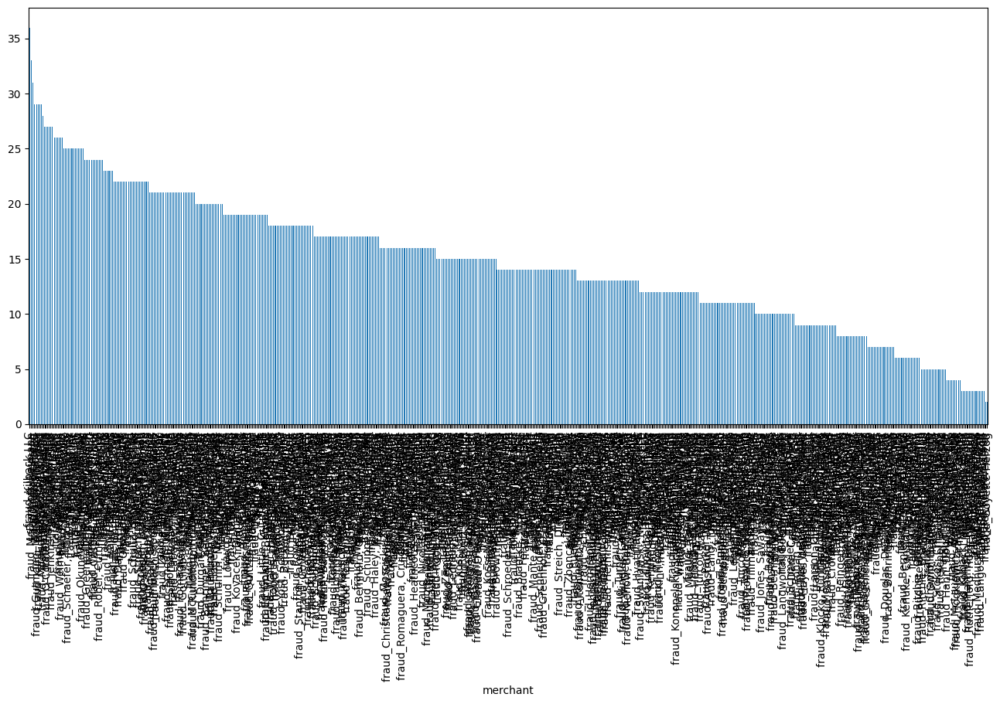

Outliers for category
category
gas_transport     1068
grocery_pos       1016
home               956
shopping_pos       876
kids_pets          834
shopping_net       736
personal_care      713
food_dining        703
health_fitness     634
misc_pos           568
misc_net           546
grocery_net        350
travel             294
NO_CATEGORY         20
Name: count, dtype: int64


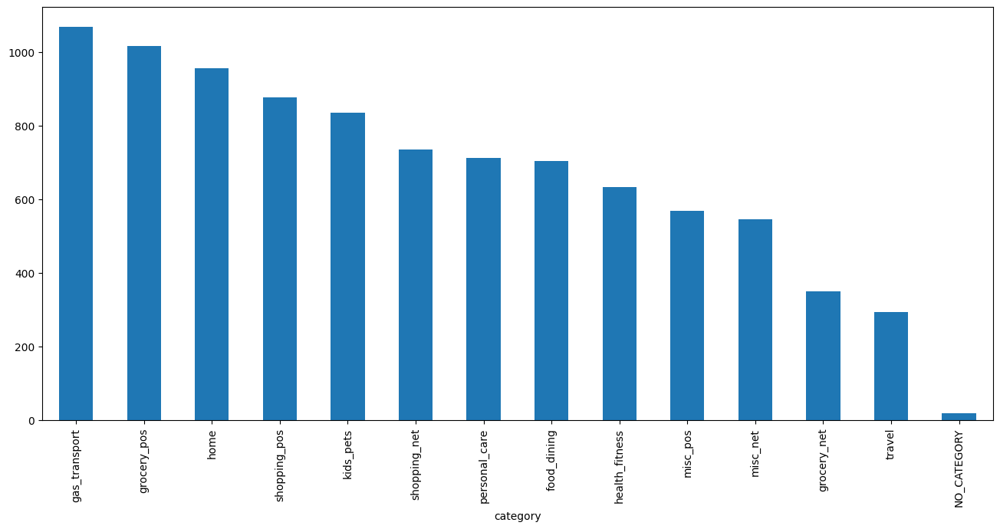

Outliers for first
first
Christopher    205
James          170
Jessica        167
David          152
Robert         145
              ... 
Natalie          1
Peggy            1
Sheri            1
Sean             1
Hailey           1
Name: count, Length: 335, dtype: int64


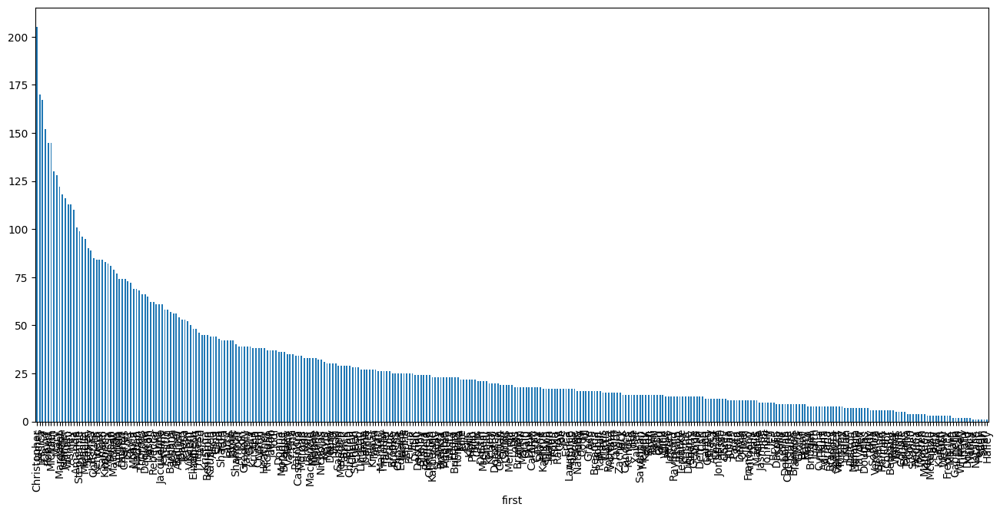

Outliers for last
last
Smith        211
Williams     187
Davis        177
Johnson      144
Rodriguez    131
            ... 
Powers         1
Watson         1
Berry          1
Alexander      1
Rhodes         1
Name: count, Length: 462, dtype: int64


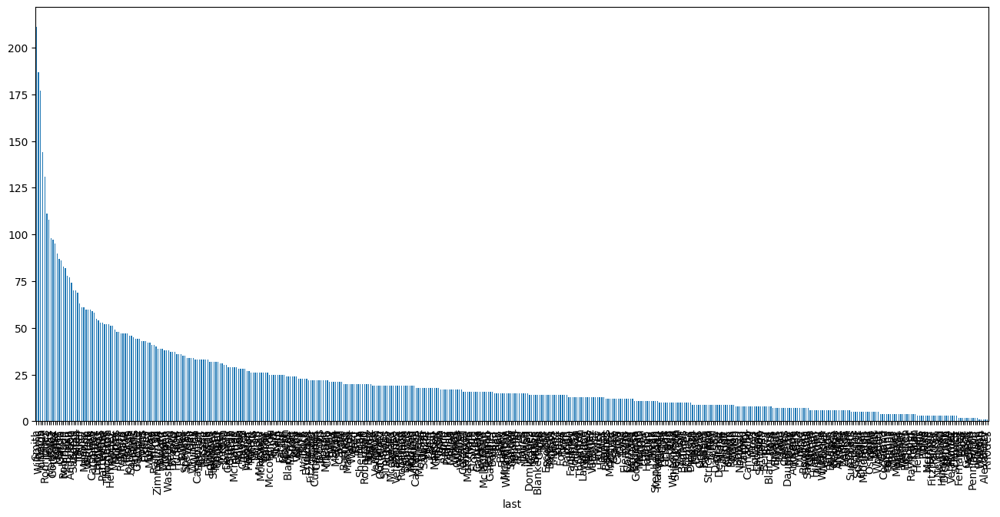

Outliers for gender
gender
F    5485
M    4515
Name: count, dtype: int64


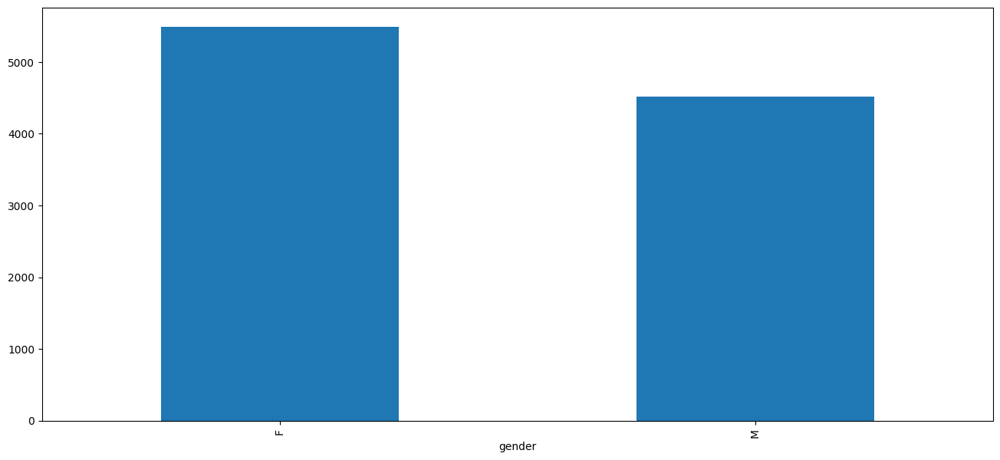

Outliers for street
street
43039 Riley Greens Suite 393      40
72269 Elizabeth Field Apt. 132    37
854 Walker Dale Suite 488         33
615 Clarke Spring Apt. 172        33
6033 Young Track Suite 804        32
                                  ..
66234 Hall Lock Suite 758          1
21810 James Mall                   1
019 Kimberly Light Apt. 039        1
6340 Jeffrey Dale                  1
337 Michael Harbors Suite 722      1
Name: count, Length: 903, dtype: int64


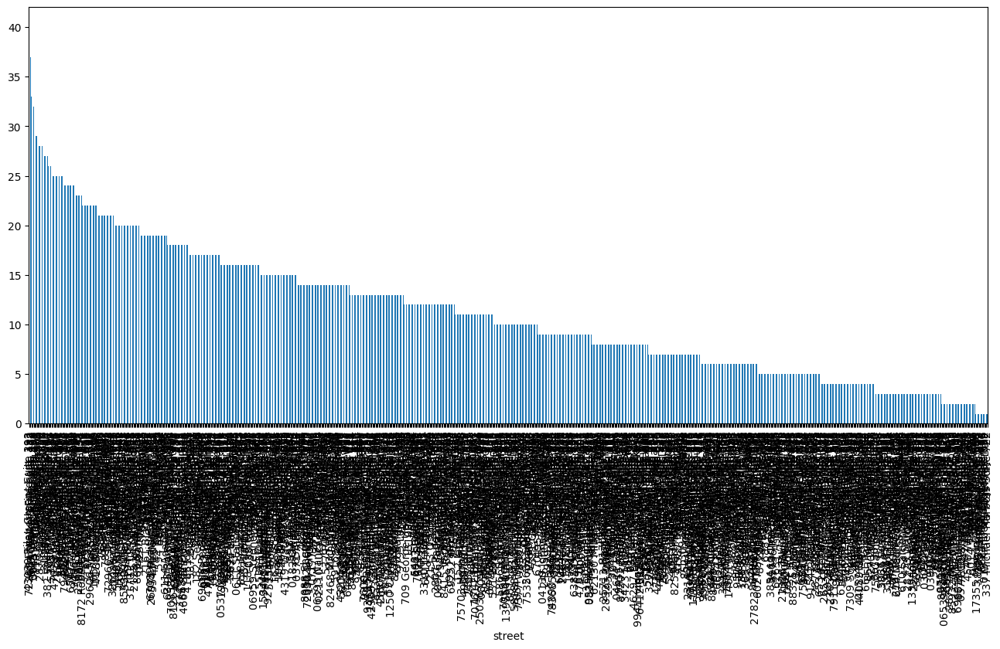

Outliers for city
city
San Antonio    51
Birmingham     49
Warren         49
Phoenix        48
Orient         47
               ..
Vancouver       1
Jackson         1
Kings Bay       1
Thornville      1
Michigan        1
Name: count, Length: 832, dtype: int64


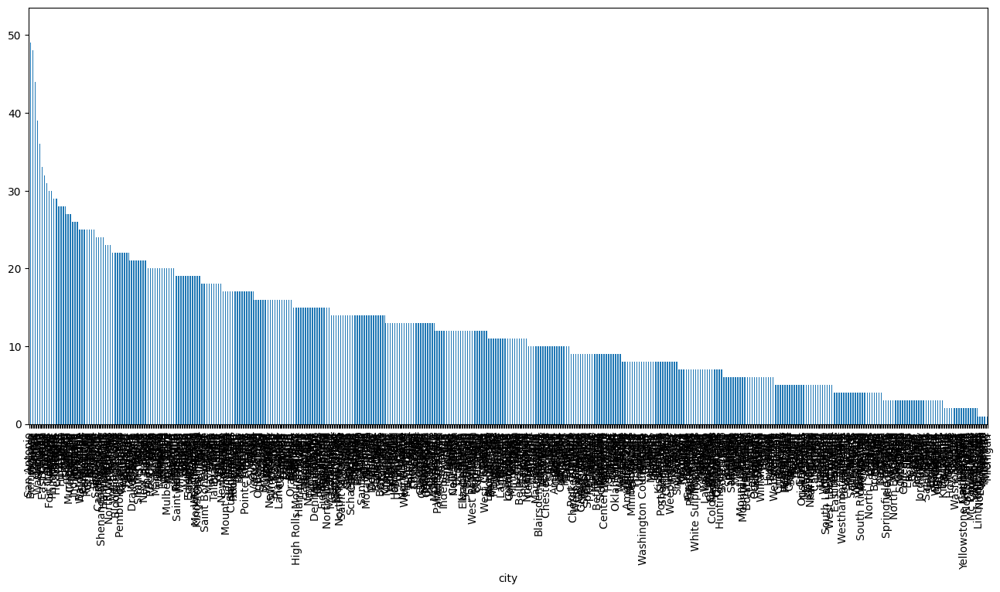

Outliers for state
state
TX    706
NY    650
PA    591
CA    454
MI    365
OH    359
IL    350
FL    319
AL    315
MO    301
AR    258
VA    250
MN    236
NC    225
IA    217
OK    213
SC    211
WV    209
WI    209
MD    209
KY    200
NJ    196
KS    195
IN    191
NE    186
GA    169
LA    169
OR    163
MS    155
WY    154
WA    153
TN    140
NM    132
ME    129
MT     99
CO     99
AZ     97
ND     92
VT     86
MA     83
UT     76
SD     75
CT     72
NH     54
ID     45
DC     38
NV     37
AK     36
HI     29
RI      3
Name: count, dtype: int64


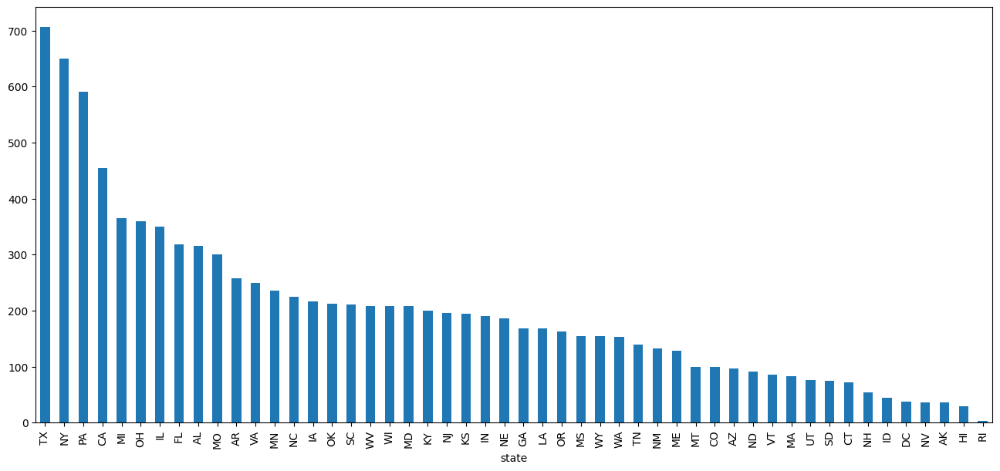

Outliers for job
job
JOBLESS                            200
Designer, ceramics/pottery          75
Exhibition designer                 71
Film/video editor                   69
Systems developer                   67
                                  ... 
Buyer, retail                        2
Restaurant manager, fast food        2
Conservator, furniture               1
Marketing executive                  1
Producer, television/film/video      1
Name: count, Length: 476, dtype: int64


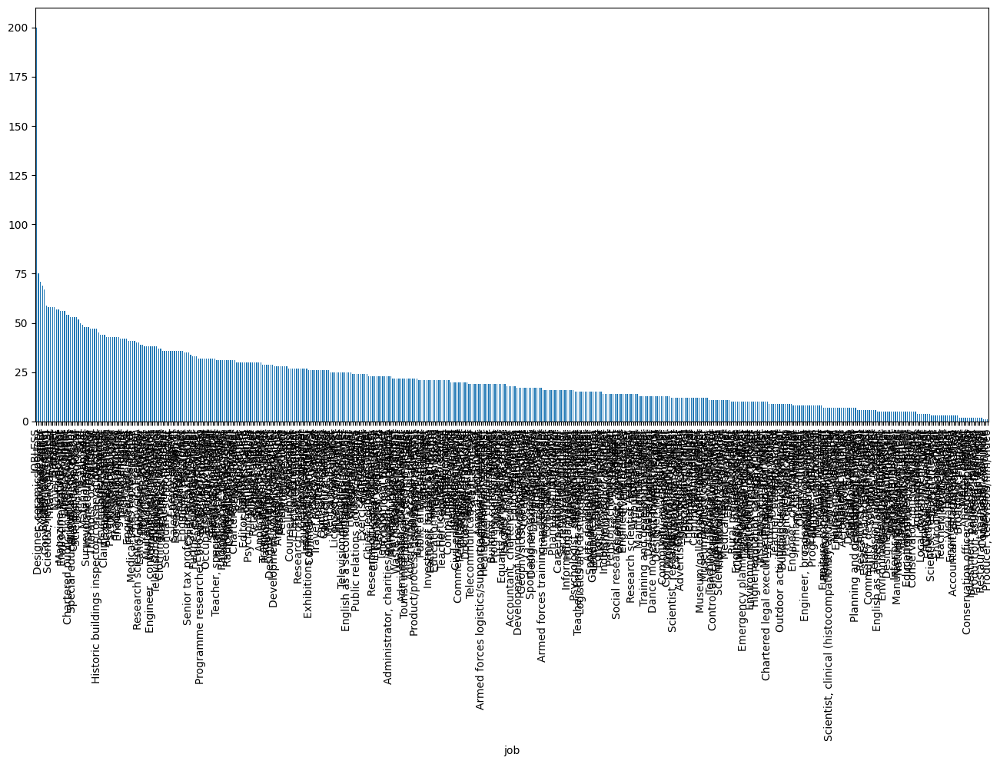

Outliers for dob
dob
1977-03-23    47
1978-06-21    40
1988-09-15    38
1981-10-24    37
1981-08-29    36
              ..
1985-01-02     1
1965-02-03     1
1950-12-14     1
1924-10-30     1
1972-07-29     1
Name: count, Length: 889, dtype: int64


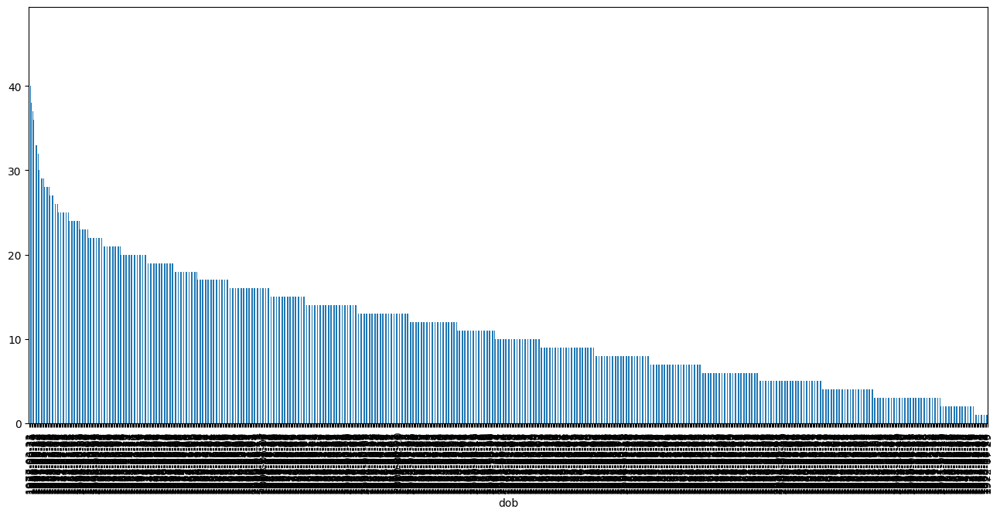

Outliers for trans_num
trans_num
0b242abb623afc578575680df30655b9    1
4936ddf0852d0344b45f9b54d032a027    1
14256aa985f72b9ef6a198efba2cfc1f    1
dfdfbd5d8e12d507ac4b0fa47f59a322    1
a318caf7b369cbb11b98c431b6c322a7    1
                                   ..
19e02012669ff9b28987a041e96db3e9    1
f07fae0c4096238c4b613a0ad7b0e982    1
6180d62d26ad7a771c8b80528f2db72e    1
22c0de29127b7d22e657ce09303b3bad    1
9085c17e4e64b08d4651ad37e254a003    1
Name: count, Length: 10000, dtype: int64


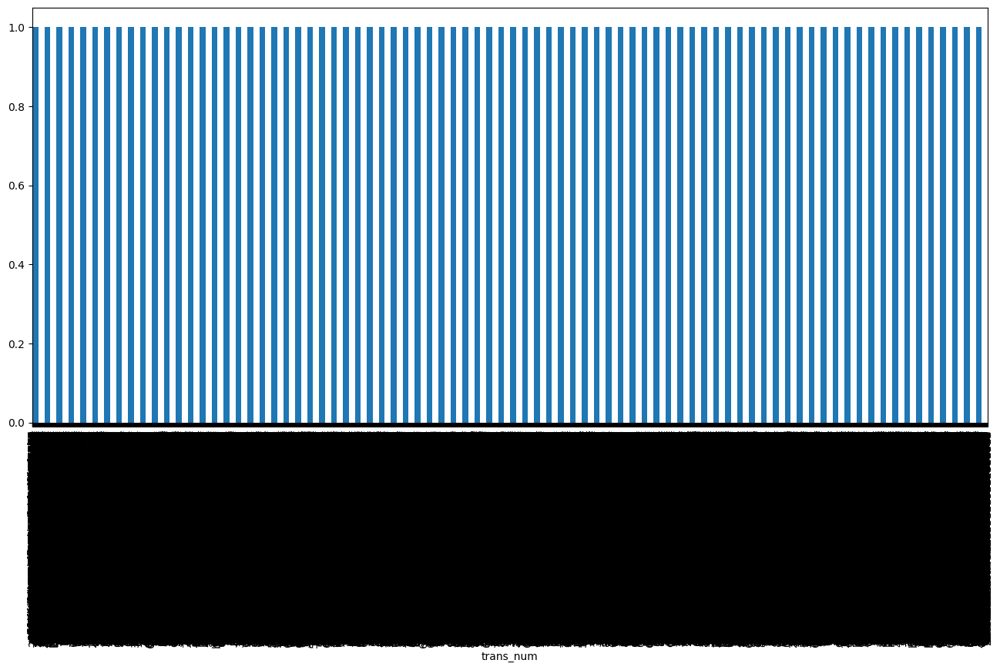

Outliers for weekday
weekday
Tuesday      2414
Sunday       2029
Friday       1474
Saturday     1409
Thursday     1236
Wednesday    1118
Monday        320
Name: count, dtype: int64


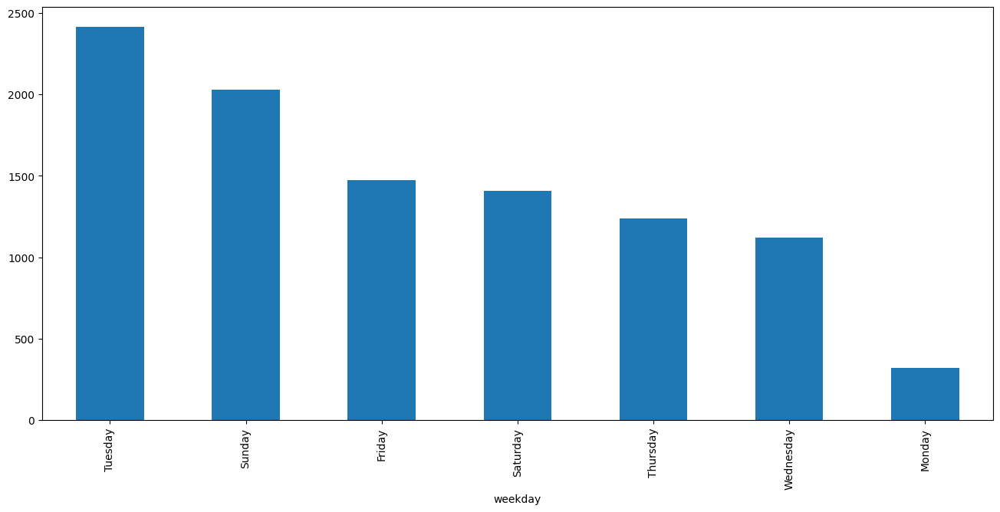

In [ ]:
for col in categorical_fields:
  print(f"Outliers for {col}")
  categorical_outliers(credit_card_df,col)

### Error Detection

In [ ]:
def detect_numerical_errors(df, numerical_columns):
    for col in numerical_columns:
        # Check for negative values
        negative_count = (df[col] < 0).sum()
        if negative_count > 0:
          print(f"Negative values in {col}: {negative_count}")
        # Detect outliers using IQR
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        outliers = df[(df[col] < Q1 - 1.5 * IQR) | (df[col] > Q3 + 1.5 * IQR)]
        if len(outliers) > 0:
          print(f"Outliers in {col}: {len(outliers)}")

In [ ]:
detect_numerical_errors(credit_card_df,numerical_fields)

Outliers in cc_num: 931
Outliers in amt: 489
Outliers in lat: 65
Negative values in long: 10000
Outliers in long: 242
Outliers in city_pop: 1901
Outliers in merch_lat: 70
Negative values in merch_long: 10000
Outliers in merch_long: 249
Outliers in is_fraud: 47


In [ ]:
in_valid_categories = {
    'category': 'NO_CATEGORY',
    'job': 'JOBLESS'
}

In [ ]:
def analyze_categorical_attributes_with_invalid_check(df, categorical_attributes, in_valid_categories):
    for col in categorical_attributes:
        # Check for specific invalid category
        if col in in_valid_categories:
            print(f"\nAnalyzing Categorical Attribute: {col}")
            invalid_value = in_valid_categories[col]
            invalid_rows = df[df[col] == invalid_value]
            if not invalid_rows.empty:
                print(f"Invalid entries found in '{col}' with value '{invalid_value}':")
                print(f"Number of invalid rows: {len(invalid_rows)}")

In [ ]:
analyze_categorical_attributes_with_invalid_check(credit_card_df,categorical_fields,in_valid_categories)


Analyzing Categorical Attribute: category
Invalid entries found in 'category' with value 'NO_CATEGORY':
Number of invalid rows: 20

Analyzing Categorical Attribute: job
Invalid entries found in 'job' with value 'JOBLESS':
Number of invalid rows: 200
